<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#High-Dimensional-Dataset-Examples" data-toc-modified-id="High-Dimensional-Dataset-Examples-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>High Dimensional Dataset Examples</a></span><ul class="toc-item"><li><span><a href="#Dow-Dataset" data-toc-modified-id="Dow-Dataset-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Dow Dataset</a></span></li><li><span><a href="#MNIST-Dataset" data-toc-modified-id="MNIST-Dataset-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>MNIST Dataset</a></span></li></ul></li><li><span><a href="#The-Curse-and-the-Blessing-of-Dimensionality" data-toc-modified-id="The-Curse-and-the-Blessing-of-Dimensionality-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>The Curse and the Blessing of Dimensionality</a></span></li><li><span><a href="#Inspecting-High-Dimensional-Features" data-toc-modified-id="Inspecting-High-Dimensional-Features-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Inspecting High Dimensional Features</a></span><ul class="toc-item"><li><span><a href="#Summary-Statistics" data-toc-modified-id="Summary-Statistics-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Summary Statistics</a></span></li><li><span><a href="#Exercise:-Compute-the-mean-and-standard-deviation-of-each-feature-in-the-Dow-dataset." data-toc-modified-id="Exercise:-Compute-the-mean-and-standard-deviation-of-each-feature-in-the-Dow-dataset.-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Exercise: Compute the mean and standard deviation of each feature in the Dow dataset.</a></span></li><li><span><a href="#Histogram-Plots" data-toc-modified-id="Histogram-Plots-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Histogram Plots</a></span></li><li><span><a href="#Discussion:-Do-these-features-follow-a-normal-distribution?" data-toc-modified-id="Discussion:-Do-these-features-follow-a-normal-distribution?-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Discussion: Do these features follow a normal distribution?</a></span></li></ul></li><li><span><a href="#Scatter-Plots" data-toc-modified-id="Scatter-Plots-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Scatter Plots</a></span><ul class="toc-item"><li><span><a href="#Discussion:-What-does-a-vertical/horizontal-line-mean-in-these-plots?" data-toc-modified-id="Discussion:-What-does-a-vertical/horizontal-line-mean-in-these-plots?-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Discussion: What does a vertical/horizontal line mean in these plots?</a></span></li><li><span><a href="#Joint-Plots" data-toc-modified-id="Joint-Plots-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Joint Plots</a></span></li><li><span><a href="#Correlation-Matrix" data-toc-modified-id="Correlation-Matrix-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Correlation Matrix</a></span></li><li><span><a href="#Exercise:-Show-that-the-correlation-matrix-is-numerically-equivalent-to-regression-slopes" data-toc-modified-id="Exercise:-Show-that-the-correlation-matrix-is-numerically-equivalent-to-regression-slopes-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Exercise: Show that the correlation matrix is numerically equivalent to regression slopes</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

In [2]:
import numpy as np
import pandas as pd

clrs = np.array(['#003057', '#EAAA00', '#4B8B9B', '#B3A369', '#377117', '#1879DB', '#8E8B76', '#F5D580', '#002233'])

# High Dimensional Data

Working with data that has more than 3 dimensions can be challenging. We live in a 3-dimensional world, our brains have evolved to think intuitively in 3 dimensions, making it relatively easy to visualize 3-dimensional data and gain good intuition about it. However, when working with data the number of dimensions can be much, much higher. This means new techniques and concepts are needed to make sense of these complex datasets.

## High Dimensional Dataset Examples

In this module we will work with 2 high-dimensional datasets: the Dow dataset that you have already seen (40 dimensions), and a new "toy" dataset of hand-written digits (64 dimensions).

### Dow Dataset

We can read in the Dow dataset below. By this point, this block should be familiar.

In [3]:
import pandas as pd

df = pd.read_excel('data/impurity_dataset-training.xlsx')
def is_real_and_finite(x):
    if not np.isreal(x):
        return False
    elif not np.isfinite(x):
        return False
    else:
        return True

all_data = df[df.columns[1:]].values #drop the first column (date)
numeric_map = df[df.columns[1:]].applymap(is_real_and_finite)
real_rows = numeric_map.all(axis=1).copy().values #True if all values in a row are real numbers
X_dow = np.array(all_data[real_rows,:-5], dtype='float') #drop the last 5 cols that are not inputs
y_dow = np.array(all_data[real_rows,-3], dtype='float')
y_dow = y_dow.reshape(-1,1)
print(X_dow.shape, y_dow.shape)

(10297, 40) (10297, 1)


There are 10,297 entries in this dataset, each of which has 40 process variables that describe it, and a corresponding continuous output (impurity level). We have worked with this before as a regression problem, but in this module we will focus solely on the feature matrix, $X$.

### MNIST Dataset

The MNIST dataset is one of the most famous "toy" datasets in machine learning. The dataset consists of images of hand-written numbers from 0-9. There are several variants, and the one we will use here is built into scikit-learn and has lower resolution digits compared to the original MNIST set.

In [4]:
from sklearn.datasets import load_digits

digits = load_digits()
print("Digits data shape: {}".format(digits.data.shape))
print("Digits output shape: {}".format(digits.target.shape))
X_mnist = np.array(digits.data)
y_mnist = np.array(digits.target)

Digits data shape: (1797, 64)
Digits output shape: (1797,)


We have 1,797 examples of digits, and each image has been "unraveled" into a 64-dimensional vector. If we want to see the digits we can re-organize the 64 dimensions into an 8x8 grid of pixels:

Digit: 9, Min: 0.0, Max: 16.0


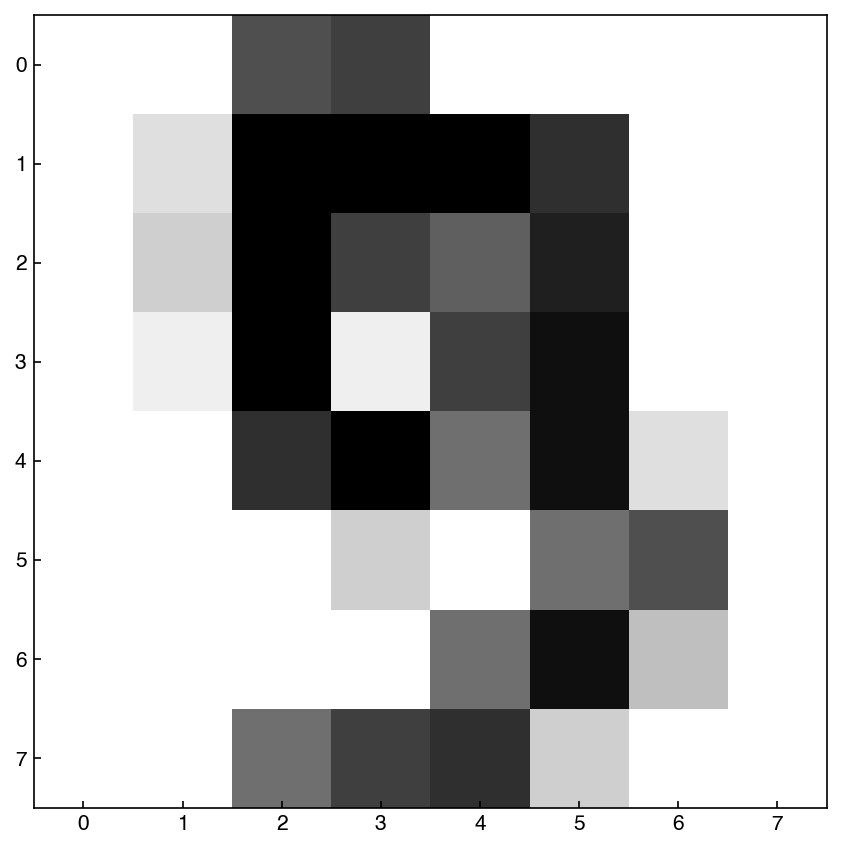

In [5]:
def show_image(digit_data, n, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    img = digit_data[n].reshape(8,8)
    ax.imshow(img, cmap='binary', vmin=0, vmax=16)
    
n = 9
show_image(X_mnist, n)
print('Digit: {}, Min: {}, Max: {}'.format(y_mnist[n],X_mnist.min(),X_mnist.max()))

In this case we see that the "features" have a different meaning, and are literally directly encoding the digit. We will often move back and forth between the "vector" view (a 64-dimensional vector) and the "image" view (an 8x8 image), but the data is the same. We will also assume that each pixel is independent for now, and does not account for it's neighbors, but we will revisit this assumption when we discuss feature engineering.

## The Curse and the Blessing of Dimensionality

Dimensionality in mathematics is different from the dimensionality of the physical world. Engineers typically consider problems in 3 dimensions, but in data science the number of dimensions is equal to the number of features and can be extremely high (>10k). This leads to two phenomena:

The *curse of dimensionality* refers to the fact that the volume of a high-dimensional space varies exponentially with the dimension. For example, consider the volume of a cube of length $L$ in dimension $d$:

$V_d = L^d$

If we want to sample this space with a resolution of $\Delta L = L/N$ we would need a total of $N^d$ points. If $N=10$ and $d=100$ (a moderate number of dimensions in data science) then the total number of samples needed is $10^{100}$, which is greater than the number of atoms in the known universe!

The blessing of dimensionality is a somewhat lesser known phenomenon that occurs because of the data sparsity that arises from the curse of dimensionality. It essentially means that as the number of independent dimensions increases the data tends to be more easily separable and will look increasingly like well-separated points. This makes the data more well-suited to simplistic statistical assumptions such as being represented by a Gaussian distribution with equal covariance. One way of thinking about this is that as the volume of the space increases, the average distance between points in that space will also increase. Therefore, as more dimensions are added data points become more well-separated. 

The curse of dimensionality always applies, but the blessing is not guaranteed. This means that in general it is more challenging to work in high dimensions.

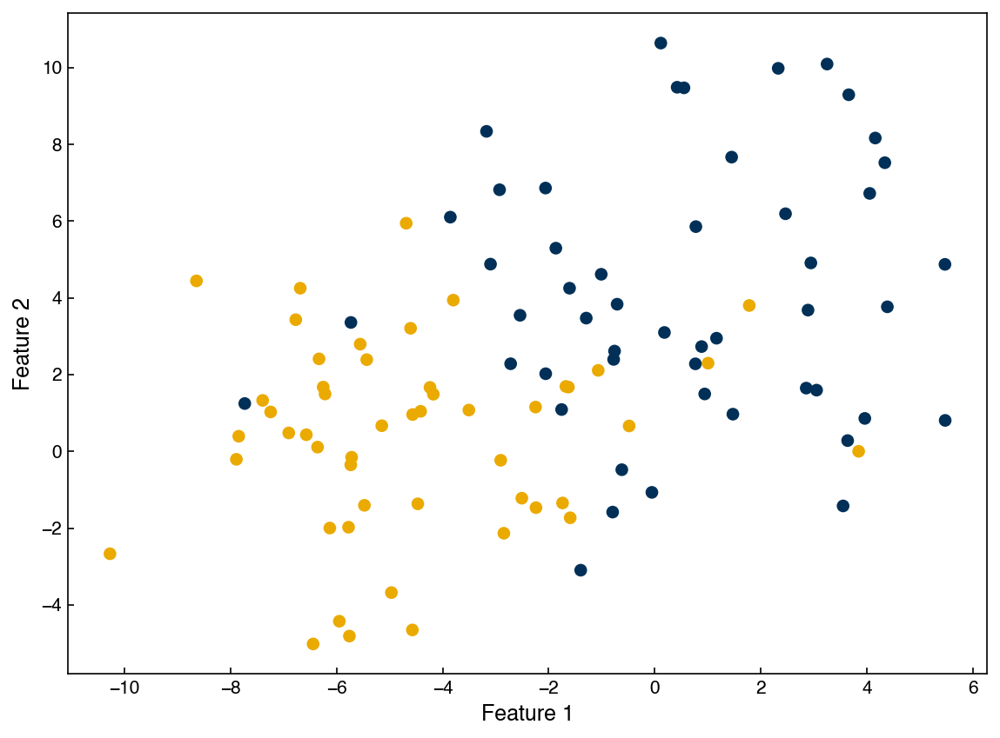

In [6]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import make_blobs

X, y = make_blobs(100, 2, centers = 2, cluster_std = 3.0, random_state = 3)
z = np.zeros((X.shape[0], 1))

for i, label in enumerate(y):
    z[i, 0] = np.random.normal(label * 2, 0.3, 1)

X = np.append(X, z, axis = 1)

fig, ax = plt.subplots()

ax.scatter(X[:, 0], X[:, 1], c = clrs[y])
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2');

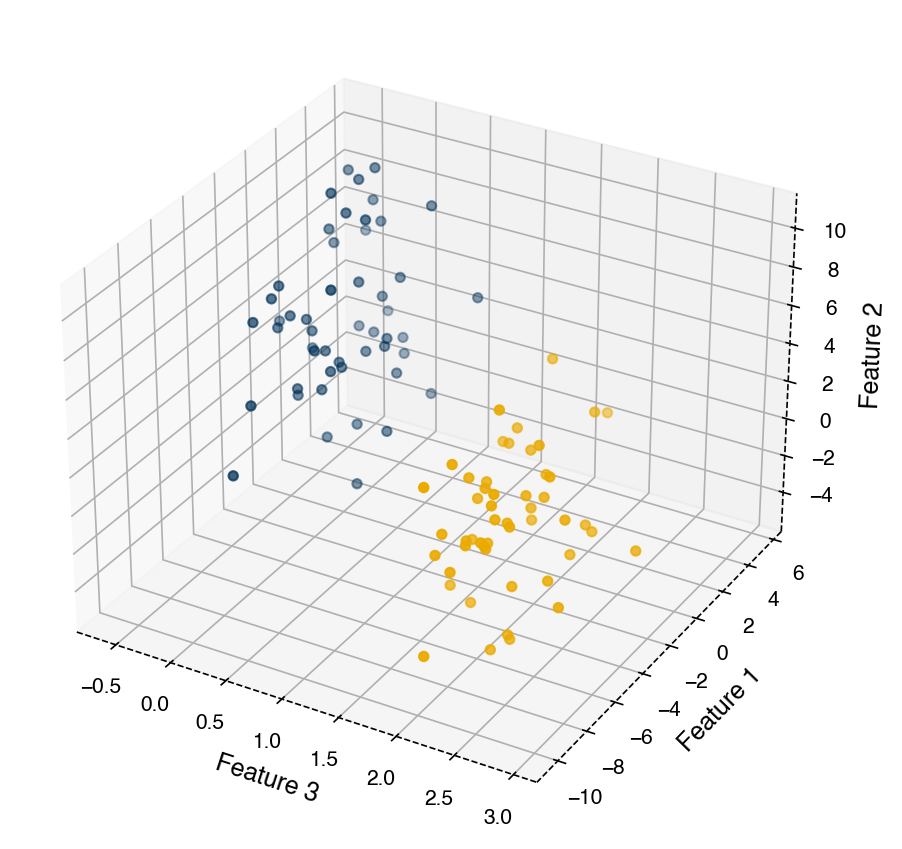

In [7]:
fig, ax = plt.subplots()
ax = plt.axes(projection = '3d')
ax.scatter(X[:, 2], X[:, 0], X[:, 1], c = clrs[y])
ax.set_xlabel('Feature 3')
ax.set_ylabel('Feature 1')
ax.set_zlabel('Feature 2')

plt.tight_layout();

## Inspecting High Dimensional Features

Unlike a 1-d or 2-d dataset, we cannot simply plot a high dimensional dataset. However, some visual analysis is still important.

### Summary Statistics

One of the simplest things we can do is check the "summary statistics" (mean, standard deviation, min, max, etc.) of each feature. This can be easily achieved with `numpy`. Let's take a look at the MNIST dataset first, since we haven't seen it before.

In [8]:
means = X_mnist.mean(axis=0)
print(means.shape)

(64,)


Here we have a 64-dimensional vector corresponding to the average at each pixel. Let's visualize it as an image:

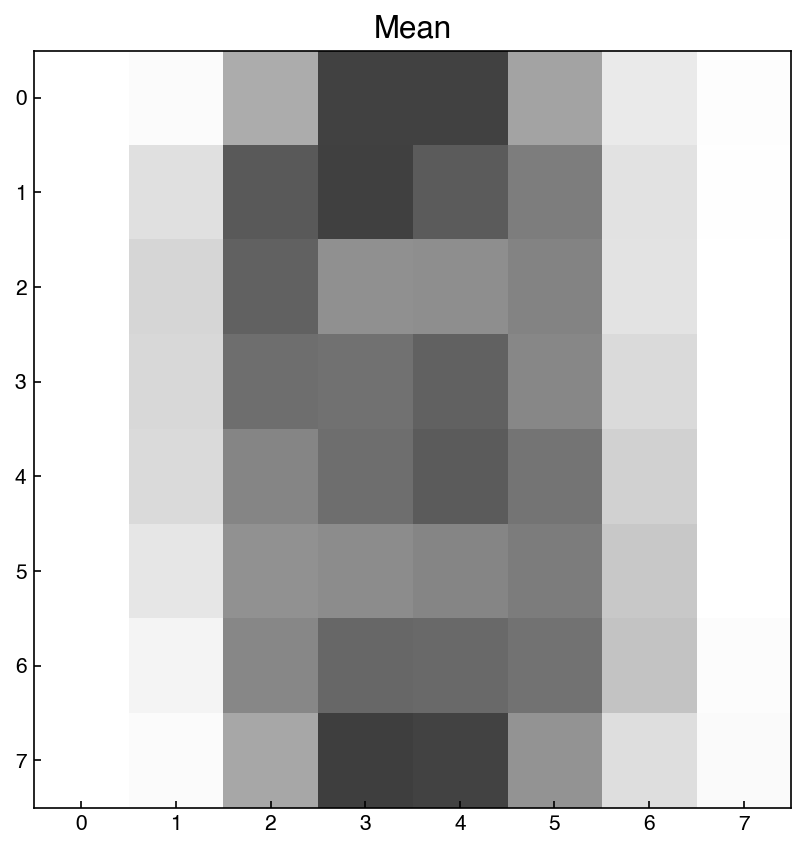

In [9]:
means = means.reshape(1,-1) #convert to *row* vector
show_image(means, 0)
plt.title('Mean');

Note that we first had to convert this to a *row* vector, so that `show_image` knows it is a single image. This tells us that the average values are highest near the center of the image, which is not surprising since all the digits are centered.

We can do the same with other summary statistics like standard deviation:

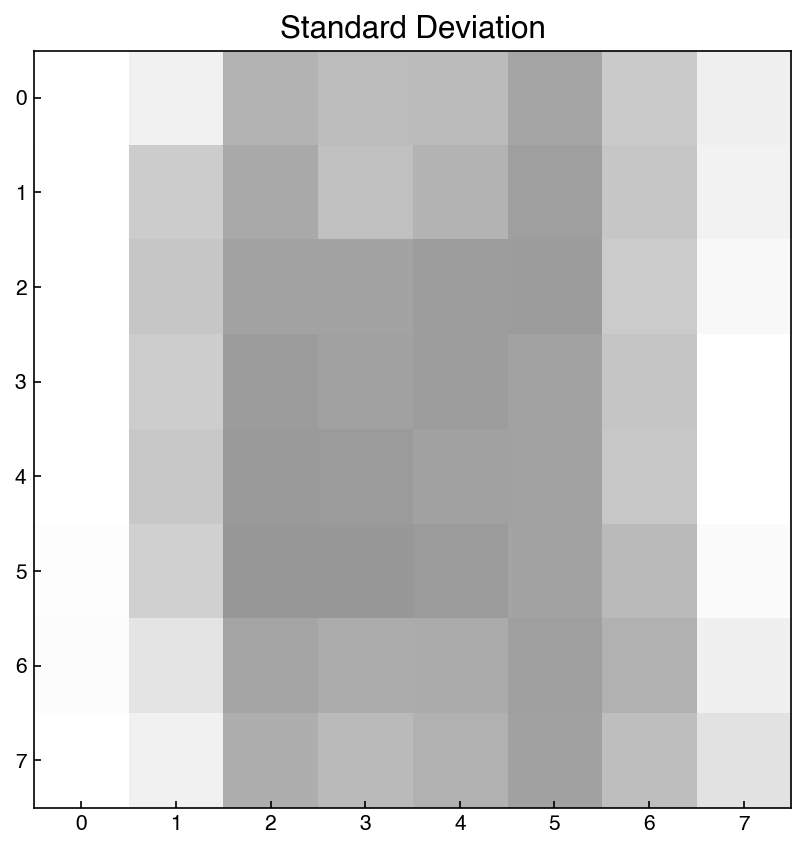

In [10]:
stdevs = X_mnist.std(axis=0).reshape(1, -1)
show_image(stdevs, 0)
plt.title('Standard Deviation');

Similarly, we see that the standard deviation is largest near the middle, though some of the edge/corner pixels also have large deviations. We could also look at the maximum:

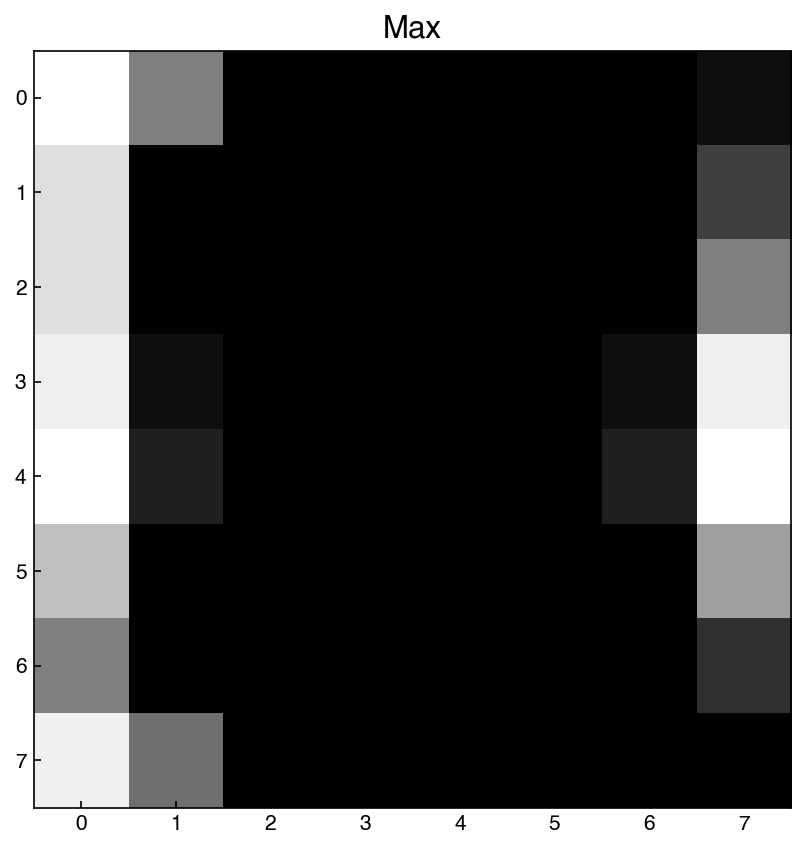

In [11]:
stdevs = X_mnist.max(axis=0).reshape(1, -1)
show_image(stdevs, 0)
plt.title('Max');

Here we see that there are some pixels where the maximum is very close to zero. This means these pixels are essentially never used. We will come back to this later.

### Exercise: Compute the mean and standard deviation of each feature in the Dow dataset.

In [12]:
means = X_dow.mean(axis = 0)
stds = X_dow.std(axis = 0)

data = pd.DataFrame(means, index = df.columns[1:-5], columns = ['mean'])
data['std'] = stds
data

,mean,std
x1:Primary Column Reflux Flow,363.769474,75.648106
x2:Primary Column Tails Flow,48.042734,8.343551
x3:Input to Primary Column Bed 3 Flow,2531.650693,571.295049
x4:Input to Primary Column Bed 2 Flow,2462.787740,503.647057
x5:Primary Column Feed Flow from Feed Column,111.401576,27.229915
x6:Primary Column Make Flow,105.252978,28.085373
x7:Primary Column Base Level,54.301929,9.014898
x8:Primary Column Reflux Drum Pressure,39.617144,4.617643
x9:Primary Column Condenser Reflux Drum Level,52.161516,8.889529
x10:Primary Column Bed1 DP,10.620064,3.790575


Summary statistics can give some insight into high-dimensional features by determining whether feature re-scaling is likely necessary, or whether some features do not contain information (for example, if the standard deviation is zero). However, it can still be hard to interpret these statistics, and they may not be meaningful if features do not follow a normal distribution.

### Histogram Plots

Another approach is to simply plot the 1-dimensional histograms of all the data. We have done this before with the Dow dataset, but let's take a look at the MNIST dataset:

In [13]:
N = X_mnist.shape[-1]
n = int(np.sqrt(N)) #n = 8 here
fig, axes = plt.subplots(n, n, figsize = (5 * n, 5 * n), dpi = 200)
ax_list = axes.ravel()
for i in range(N):
    ax_list[i].hist(X_mnist[:, i])
    ax_list[i].set_xlabel(i)

We can think of each plot in this matrix as corresponding to the pixel position in the image, and we are looking at a histogram of the pixel values.

### Discussion: Do these features follow a normal distribution?
> None of features follow a normal distribution.

## Scatter Plots

The histograms give more insight into the distribution of each feature, but they don't give any insight into how the features are related to each other. For this, we can use "scatter plots" of features against each other. This is often achieved with a scatter plot matrix. However, this matrix can become very large for data with dimensions >10 or so. The reason is that it will be an `n_dimensions` x `n_dimensions` matrix of plots. In the case of the MNIST dataset this would be 64x64, or 4096 total plots! Let's just look at a few features at a time instead:

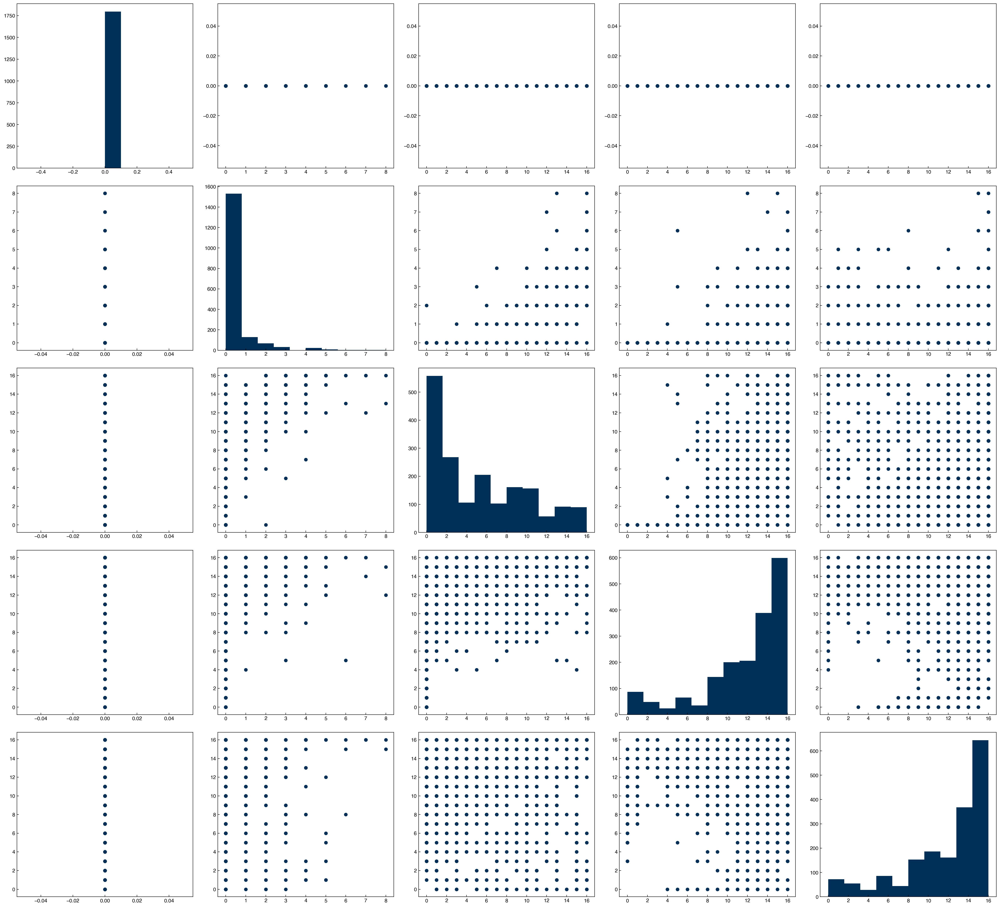

In [14]:
features = [0, 1, 2, 3, 4]
n  = len(features)
fig, axes = plt.subplots(n, n, figsize = (5.5 * n, 5 * n), dpi = 200)

for i in features:
    for j in features:
        ax = axes[i, j]
        if i == j:
            ax.hist(X_mnist[:, i])
        else:
            x = X_mnist[:, j]
            y = X_mnist[:, i]
            ax.scatter(x, y)

By plotting histograms along the diagonal it makes the plot matrix even more meaningful, since we get both single-feature (along diagonal) and dual feature (off-diagonal) information. The `seaborn` library also has a function that makes this even easier:

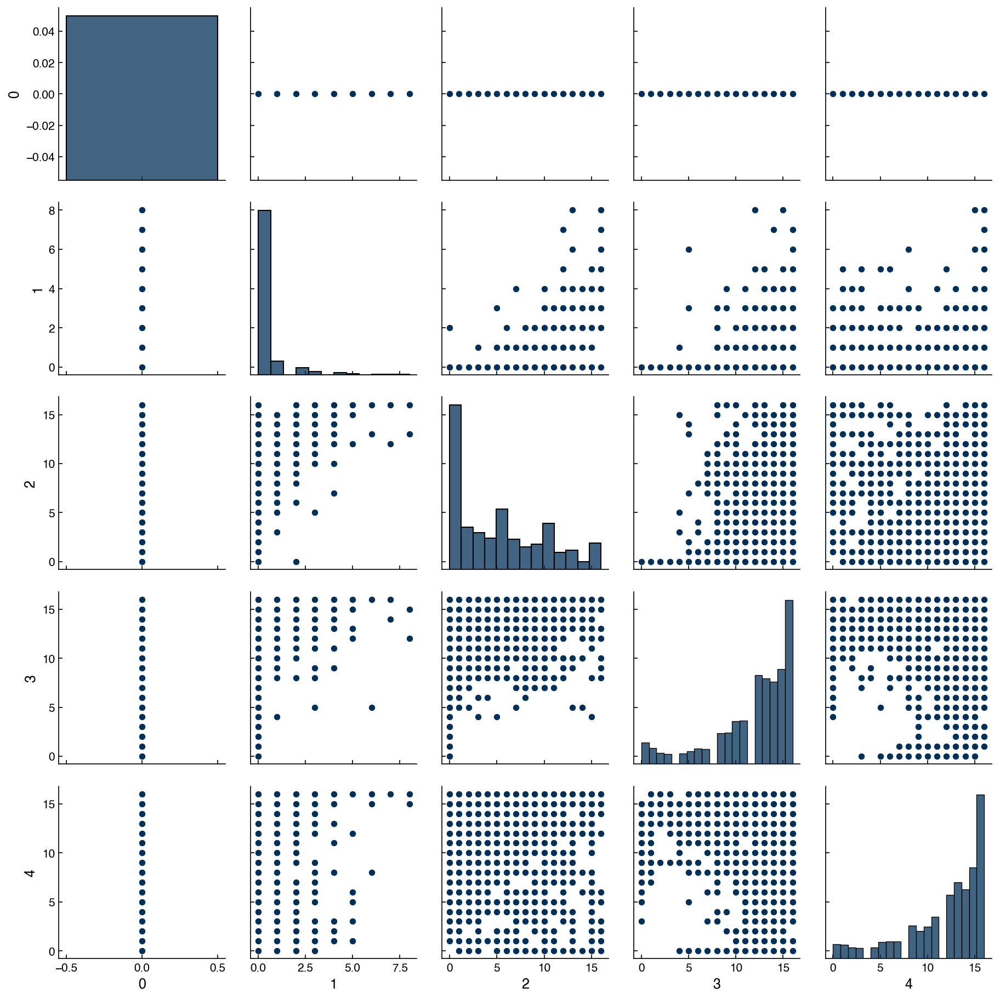

In [15]:
import seaborn as sns

mnist_df = pd.DataFrame(X_mnist)
sns.pairplot(mnist_df[features]);

We see that we first need to convert the array to a dataframe to use the plotting feature. In practice, the data will often already be in a dataframe format, so this is even more convenient.

### Discussion: What does a vertical/horizontal line mean in these plots?
> One of features only has a single value.

We can also make scatter plots for the Dow data to see how they look for continuous features.

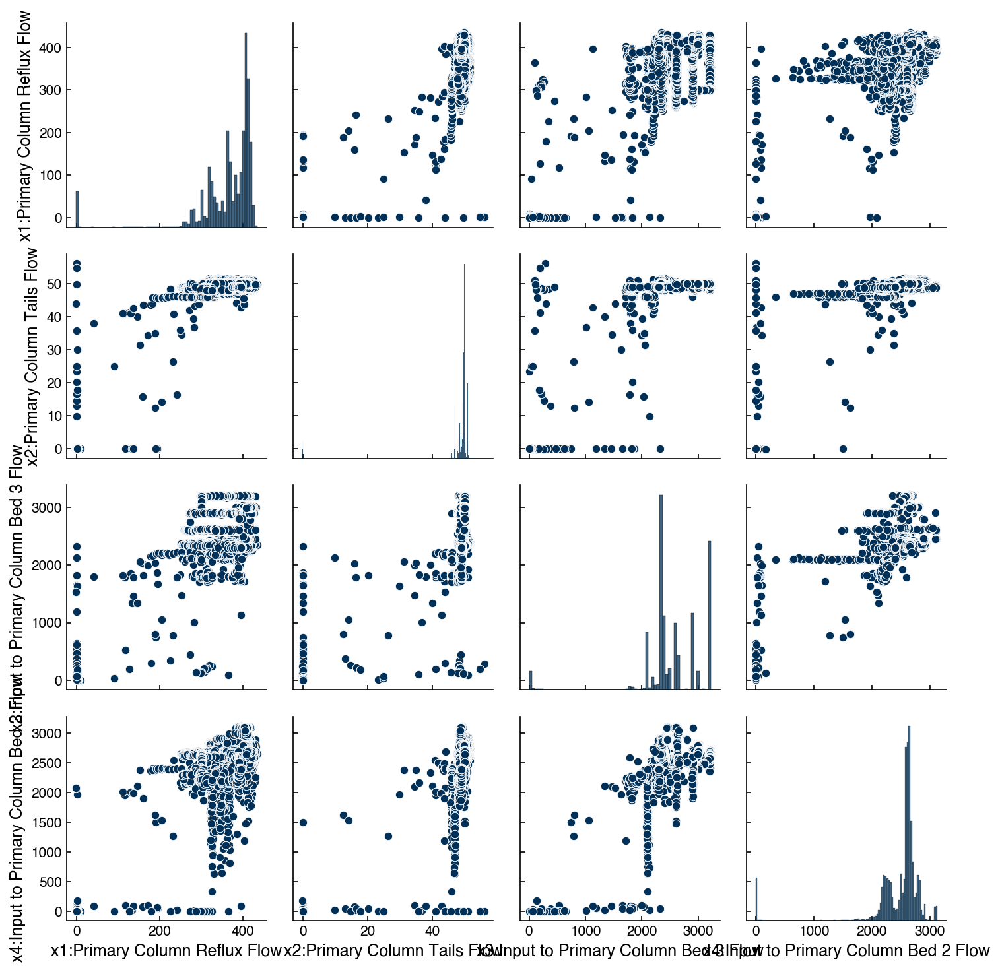

In [16]:
df_dow_clean = df[real_rows]
include_columns = df_dow_clean.columns[1:5]
sns.pairplot(df_dow_clean[include_columns])
plt.tight_layout()

Note this is a bit slower, since there are ~10K data points, so we have only selected 4 features.

### Joint Plots

Sometimes it is also useful to "zoom in" on a given set of variables to get a better feeling for how the features are related. This can be achieved with "joint plots" that show the scatter plot along with the correlation and the distributions. Again, `seaborn` has some nice built-in functionality for this. Let's take a closer look at the relationship between `x3` and `x4` in the Dow dataset:

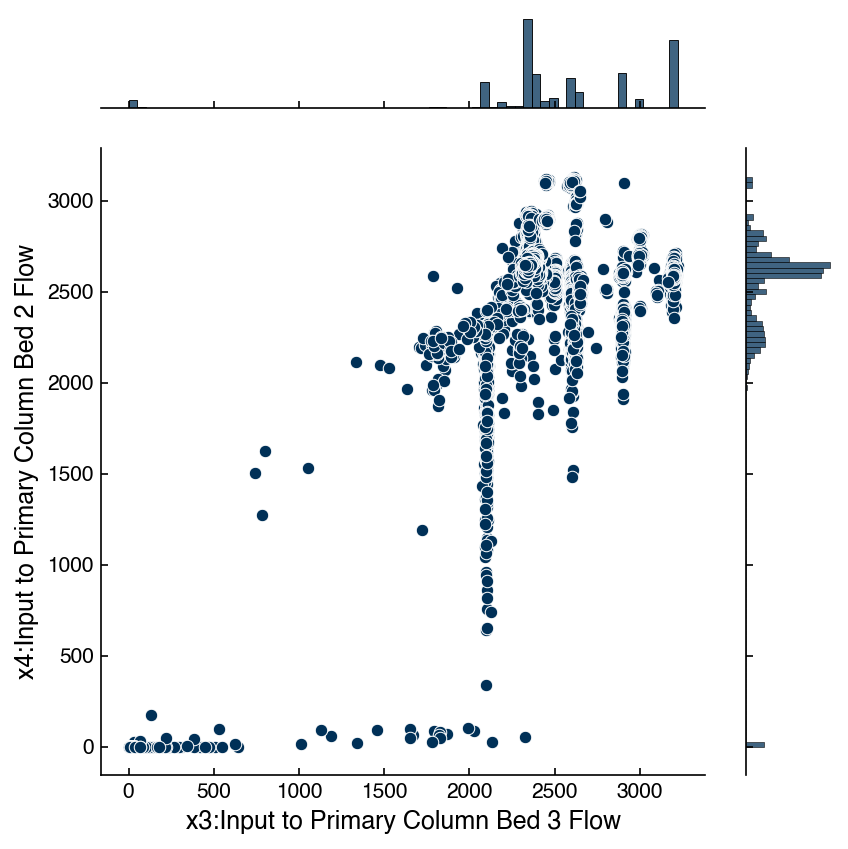

In [17]:
x_col = df_dow_clean.columns[3]
y_col = df_dow_clean.columns[4]
jp = sns.jointplot(x = x_col, y = y_col, data = df_dow_clean)

There are lots of options that can be used to get more insight. In particular the `kind="reg"` option provides the correlation between the variables:

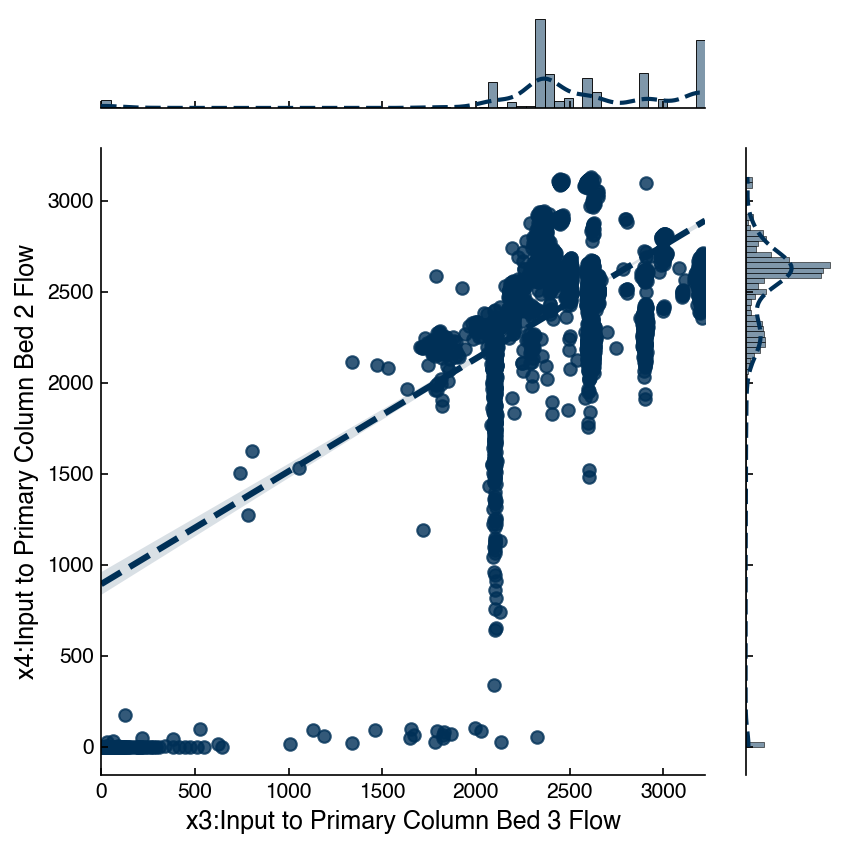

In [18]:
jp = sns.jointplot(x = x_col, y = y_col, data = df_dow_clean, kind = 'reg')

You can read up on the other options in the [seaborn documentation](https://seaborn.pydata.org/generated/seaborn.jointplot.html).

### Correlation Matrix

We discussed the correlation matrix earlier, but this is a good time to revisit it. We can think of the correlation matrix as "zooming out" from the scatter plot matrix. We can compute the correlation matrix with `numpy`. Let's take a look at variables 2-10 of the MNIST dataset (we are avoiding features with vertical/horizontal lines):

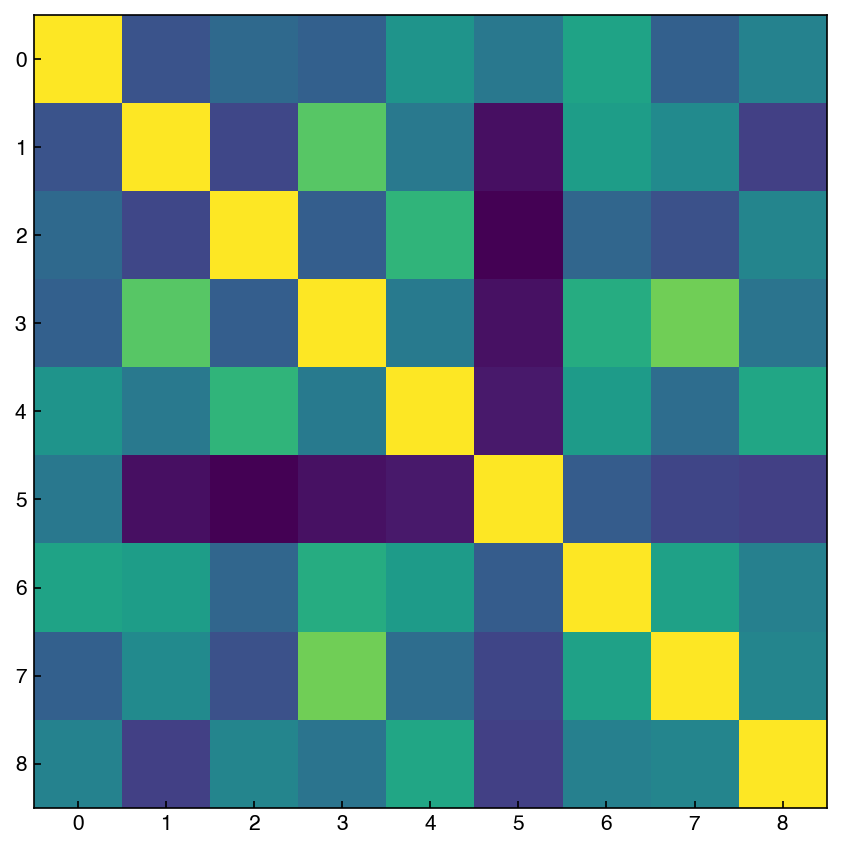

In [19]:
features = range(2, 11)
X_reduced = X_mnist[features] # select first 10 features
corr_mnist = np.corrcoef(X_reduced)

fig, ax = plt.subplots()
ax.imshow(corr_mnist);

There is also a useful tool in `seaborn` for creating an easier-to-read correlation matrix:

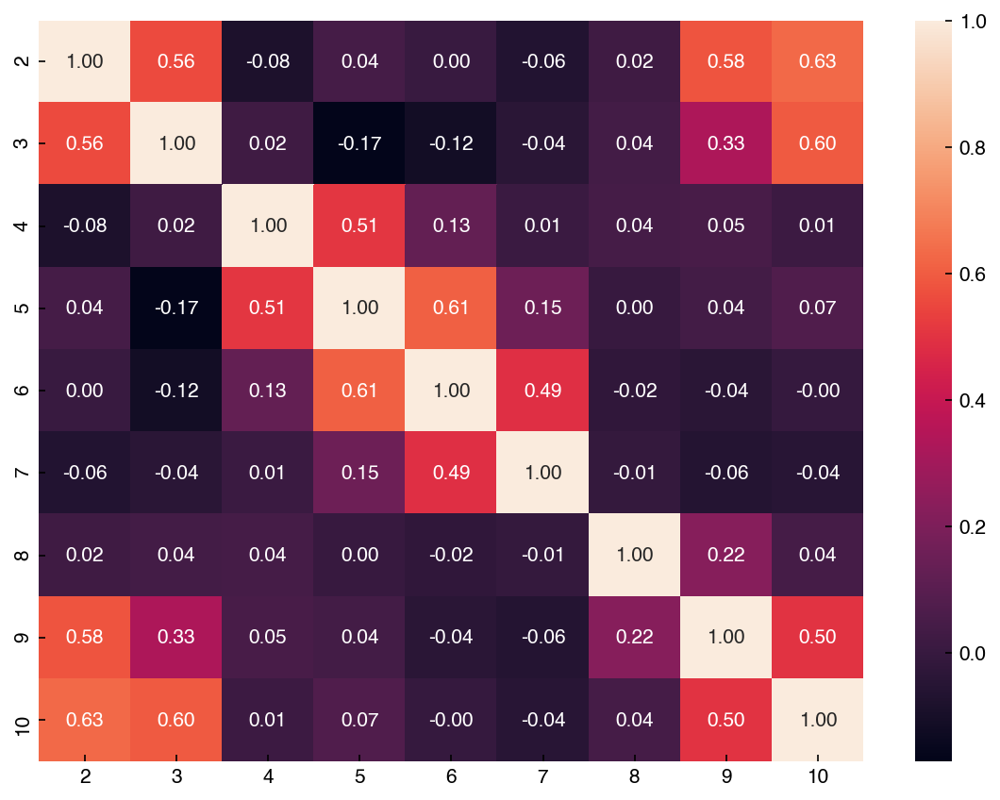

In [20]:
corr = mnist_df[features].corr()
hm = sns.heatmap(corr, annot = True, fmt = '.2f', annot_kws = {'fontsize': 10})

Unlike the scatter plot matrix, the correlation matrix is a bit easier to compute and visualize for a larger number of dimensions. Let's take a look at the full MNIST dataset:

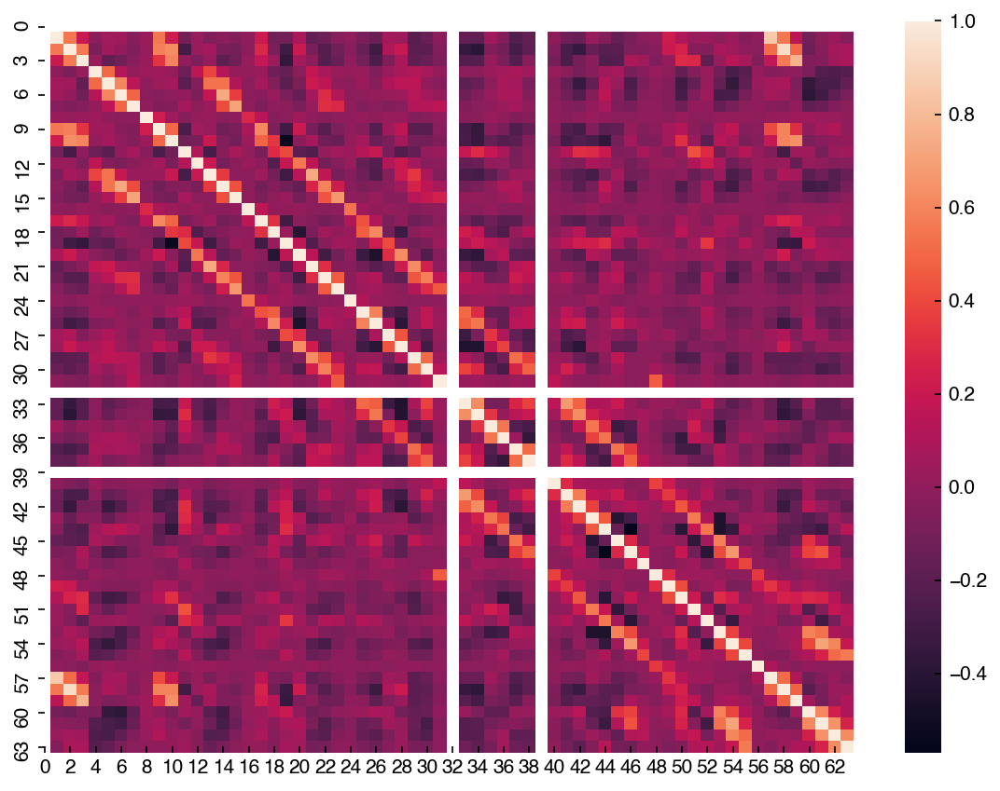

In [21]:
corr = mnist_df.corr()
hm = sns.heatmap(corr)

The labels are especially helpful when dealing with datasets where the features have names. Let's look at the correlation matrix for the first 4 features of the Dow dataset:

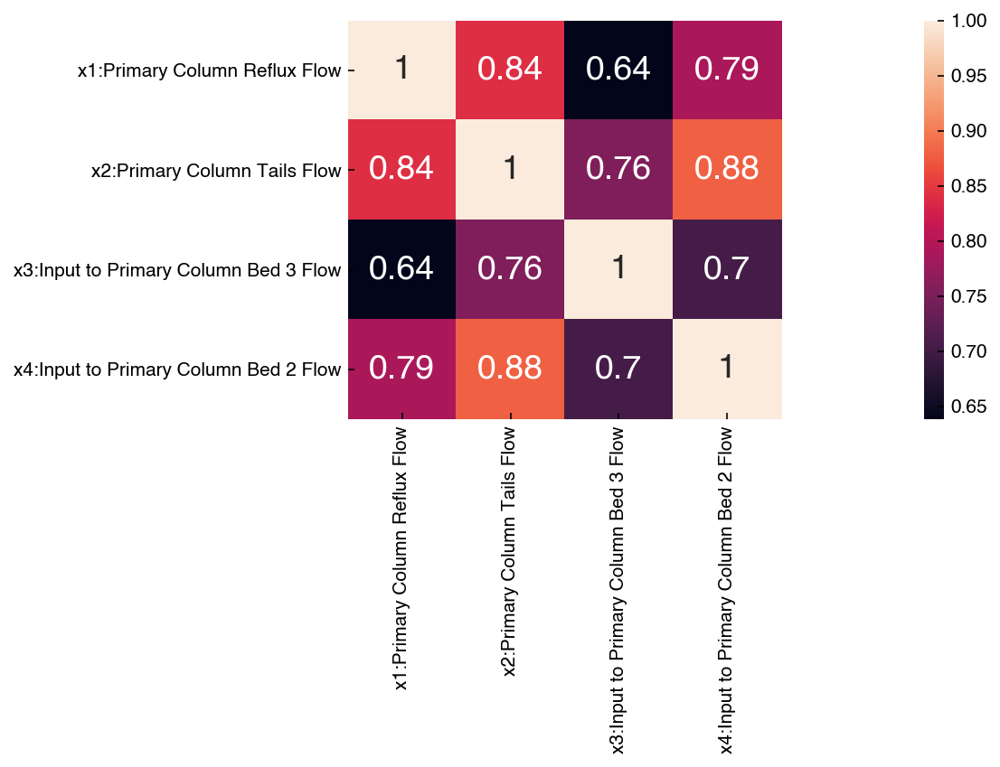

In [22]:
corr_dow = df_dow_clean[include_columns].corr()
hm = sns.heatmap(corr_dow, annot=True)
hm.set_xlim([0,5]);

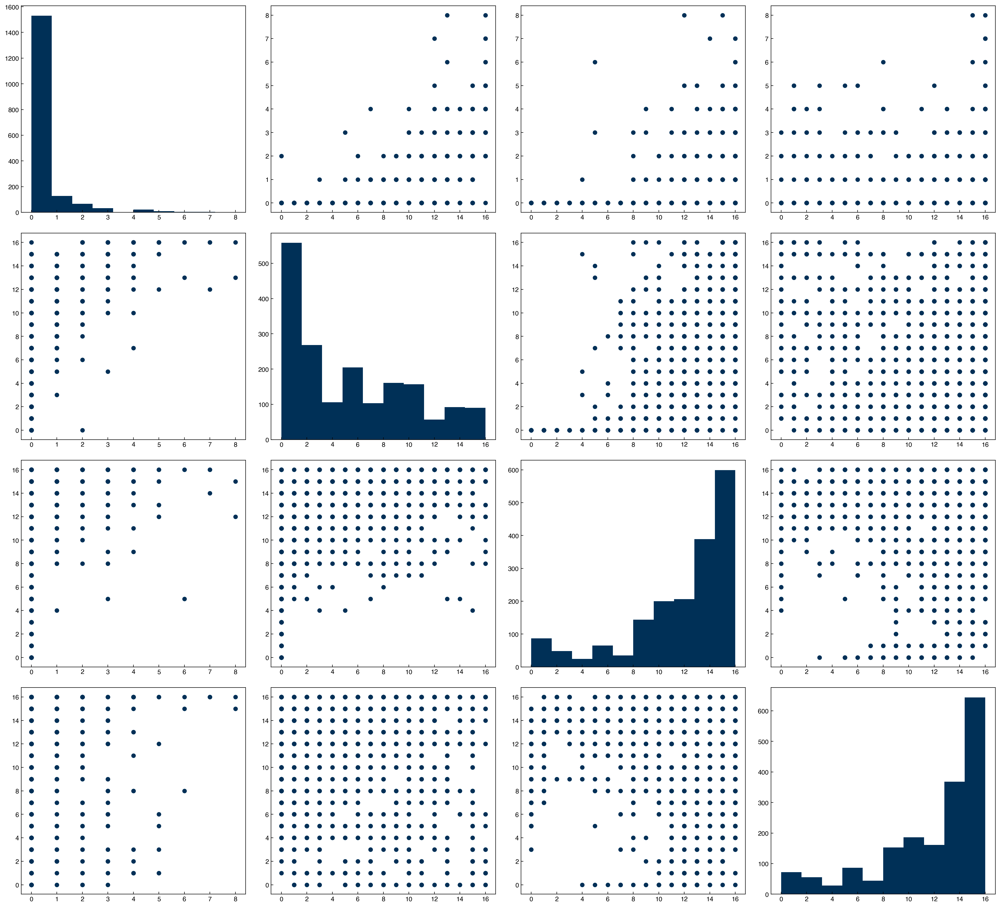

In [23]:
features = [1, 2, 3, 4]
n  = len(features)
fig, axes = plt.subplots(n, n, figsize = (5.5 * n, 5 * n), dpi = 200)

for i in features:
    for j in features:
        ax = axes[i - 1, j - 1]
        if i == j:
            ax.hist(X_mnist[:, i])
        else:
            x = X_mnist[:, j]
            y = X_mnist[:, i]
            ax.scatter(x, y)

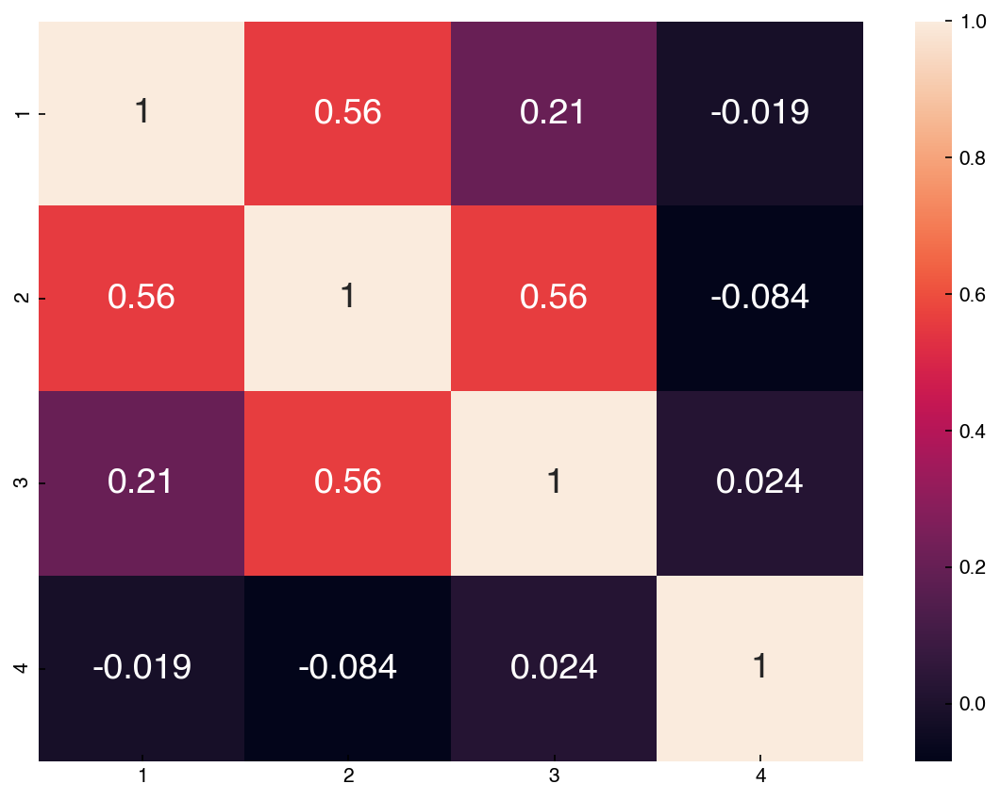

In [24]:
corr = mnist_df[features].corr()
hm = sns.heatmap(corr, annot = True)

Compare this to the scatter plot matrix. You can see that features with high correlations have scatter plots that are more aligned. One way to interpret this correlation matrix is as the slope of a regression line between any two features after the features have been standardized (mean = 0, stdev = 1).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Overview-of-Dimensionality-Reduction" data-toc-modified-id="Overview-of-Dimensionality-Reduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Overview of Dimensionality Reduction</a></span><ul class="toc-item"><li><span><a href="#Practical-uses-of-dimensionality-reduction" data-toc-modified-id="Practical-uses-of-dimensionality-reduction-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Practical uses of dimensionality reduction</a></span></li><li><span><a href="#Considerations-for-dimensionality-reduction" data-toc-modified-id="Considerations-for-dimensionality-reduction-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Considerations for dimensionality reduction</a></span></li><li><span><a href="#Assessing-performance-of-dimensionality-reduction-models" data-toc-modified-id="Assessing-performance-of-dimensionality-reduction-models-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Assessing performance of dimensionality reduction models</a></span><ul class="toc-item"><li><span><a href="#Variance" data-toc-modified-id="Variance-1.3.1"><span class="toc-item-num">1.3.1&nbsp;&nbsp;</span>Variance</a></span></li><li><span><a href="#Distance" data-toc-modified-id="Distance-1.3.2"><span class="toc-item-num">1.3.2&nbsp;&nbsp;</span>Distance</a></span></li><li><span><a href="#Visualization" data-toc-modified-id="Visualization-1.3.3"><span class="toc-item-num">1.3.3&nbsp;&nbsp;</span>Visualization</a></span></li><li><span><a href="#Model-performance" data-toc-modified-id="Model-performance-1.3.4"><span class="toc-item-num">1.3.4&nbsp;&nbsp;</span>Model performance</a></span></li></ul></li></ul></li><li><span><a href="#Principal-Component-Analysis-(PCA)" data-toc-modified-id="Principal-Component-Analysis-(PCA)-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Principal Component Analysis (PCA)</a></span><ul class="toc-item"><li><span><a href="#Discussion:-How-is-this-different-from-the-correlation-matrix?-Why-are-there-&quot;blocks&quot;-in-matrix?" data-toc-modified-id="Discussion:-How-is-this-different-from-the-correlation-matrix?-Why-are-there-&quot;blocks&quot;-in-matrix?-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Discussion: How is this different from the correlation matrix? Why are there "blocks" in matrix?</a></span></li><li><span><a href="#Exercise:-Find-the-rank-of-the-covariance-matrix" data-toc-modified-id="Exercise:-Find-the-rank-of-the-covariance-matrix-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Exercise: Find the rank of the covariance matrix</a></span></li><li><span><a href="#Exercise:-Find-the-&quot;average&quot;-10-dimensional-vector-for-an-&quot;8&quot;" data-toc-modified-id="Exercise:-Find-the-&quot;average&quot;-10-dimensional-vector-for-an-&quot;8&quot;-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Exercise: Find the "average" 10-dimensional vector for an "8"</a></span></li></ul></li><li><span><a href="#Kernel-PCA" data-toc-modified-id="Kernel-PCA-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel PCA</a></span><ul class="toc-item"><li><span><a href="#Other-PCA-variants" data-toc-modified-id="Other-PCA-variants-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Other PCA variants</a></span></li></ul></li><li><span><a href="#Other-dimensional-reduction-approaches" data-toc-modified-id="Other-dimensional-reduction-approaches-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Other dimensional reduction approaches</a></span><ul class="toc-item"><li><span><a href="#Manifold-learning" data-toc-modified-id="Manifold-learning-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Manifold learning</a></span></li><li><span><a href="#Autoencoding" data-toc-modified-id="Autoencoding-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Autoencoding</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

In [2]:
import numpy as np
import pandas as pd

clrs = np.array(['#003057', '#EAAA00', '#4B8B9B', '#B3A369', '#377117', '#1879DB', '#8E8B76', '#F5D580', '#002233', '#808080'])

# Dimensionality Reduction

Working with high dimensional data is challenging, and one common strategy is to try to reduce the amount of dimensions. This is called "dimensionality reduction" or "dimensional reduction".

## Overview of Dimensionality Reduction

### Practical uses of dimensionality reduction

There are a number of practical uses for dimensionality reduction algorithms:

* compression of data
* denoising of data
* interpretation of data
* improving model efficiency or performance

We will focus primarily on the ways that dimensionality reduction can aid in interpretation and improving model efficiency and performance, but the algorithms used for other applications are the same or similar.

### Considerations for dimensionality reduction

There are many different kinds of dimensionality reduction approaches, and when selecting between them there are a few things to consider. The relative importance of these factors will depend on the nature of the dataset and the goal of the analysis.

* Matrix rank - how many independent dimensions are there?
* Linearity of the low-dimensional subspace - are patterns linear or non-linear?
* Projection - can a new high-dimensional point be projected onto the low-dimensional map?
* Inversion - can a new low-dimensional point be projected back into high-dimensional space?
* Supervised vs. unsupervised - are the training labels used to determine the reduced dimensions?

### Assessing performance of dimensionality reduction models

It can be challenging to assess the performance of dimensional reduction models, especially when unsupervised. Nonetheless there are a few approaches that can be used. Selecting the right approach will depend on the problem, but using a variety of assessment criteria is always a good idea if possible.

#### Variance
One common idea in dimensional reduction is to assess the "retained variance" of the low-dimensional data. This is common in techniques such as PCA.

#### Distance

The "stress" function compares the distance between points $i$ and $j$ in a low-dimensional space to the distance in the full-dimensional space:

$ S(\vec{x}_{0}, \vec{x}_1, \vec{x}_2, ... \vec{x}_n) =  \left( \frac{\sum_{i=0}^n \sum_{i<j}(d_{ij} - ||x_i - x_j||)^2}{\sum_{i=0}^n \sum_{i<j} d_{ij}^2} \right)^{1/2} $


where $d_{ij}$ is the distance in the high-dimensional space and $\vec{x}$ is the vector in the low-dimensional space.

A conceptually similar way to express this is:

$\sum_i \sum_j || d(\vec{x}_i, \vec{x}_j) - d(P(\vec{x}_i), P(\vec{x}_j))||$

where $d(\vec{x}_i, \vec{x}_j)$ is the distance between $\vec{x}_i$ and $\vec{x}_j$ in the high-dimensional space, and $P(\vec{x}_j)$ is the reduced-dimension vector.

Some approaches seek to minimize these distances directly (e.g. multi-dimensional scaling), but it can also be used as an accuracy metric. We can implement this using a few helper functions. You don't need to worry about the details of this function, but can look up the documentation to see the connection.

In [3]:
from scipy.spatial.distance import pdist

def stress(X_reduced, X):
    D_red = pdist(X_reduced)
    D_tot = pdist(X)
    numerator = np.sum((D_tot - D_red)**2)
    denom = np.sum(D_tot**2)
    return np.sqrt(numerator / denom)

#### Visualization

Where possible, visualizing the data in the low-dimensional space and looking for patterns is a very powerful approach. However this becomes challenging if the low-dimensional space is $>$3 dimensions.

#### Model performance

If you have labels for the data one good approach is to construct a supervised model from both the low- and high-dimensional spaces and evaluating the accuracy of both. If the accuracy does not decrease then the key patterns are retained in the low-dimensional representation. This is also a pragmatic approach since one main use of dimensional reduction is to construct more efficient supervised models.

## Principal Component Analysis (PCA)

PCA should already be familiar, but we will take a closer look in this lesson. As a quick refresher the principal component analysis is obtained via the eigenvalues of the covariance matrix. First, let's take a look at the MNIST data since we haven't worked with it yet. First we need to re-import it:

In [4]:
import pandas as pd
from sklearn.datasets import load_digits

digits = load_digits()
print("Digits data shape: {}".format(digits.data.shape))
print("Digits output shape: {}".format(digits.target.shape))
X_mnist = np.array(digits.data)
y_mnist = np.array(digits.target)

Digits data shape: (1797, 64)
Digits output shape: (1797,)


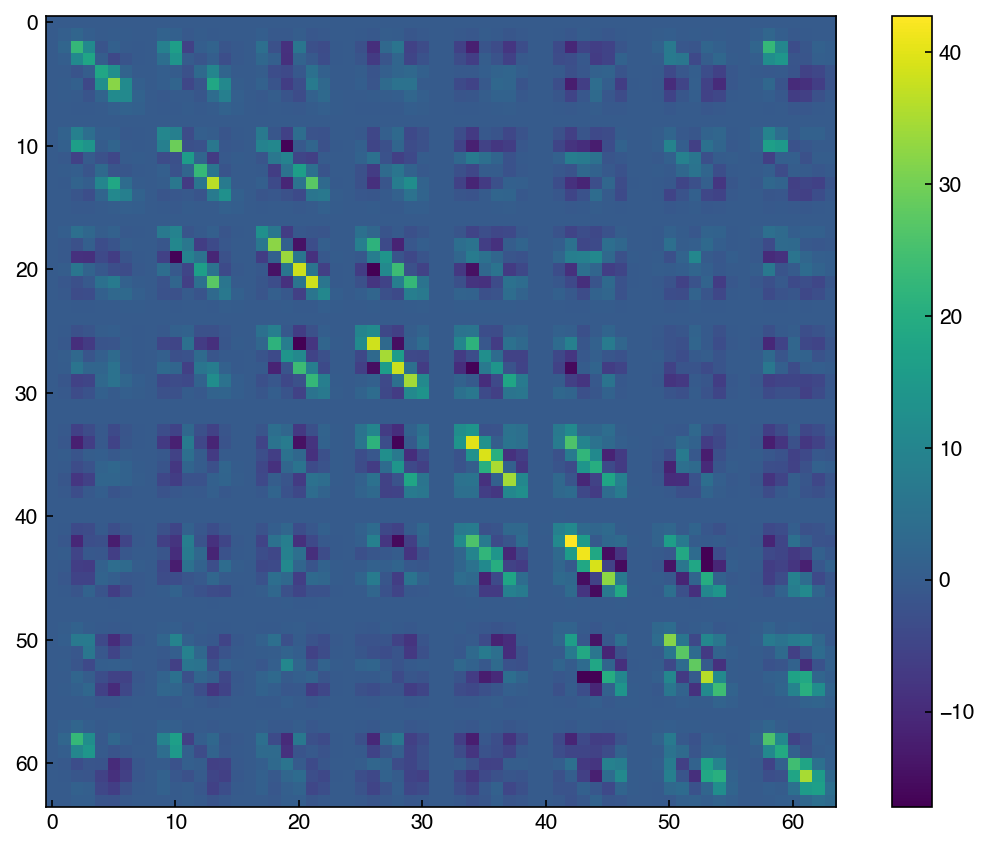

In [5]:
C = np.cov(X_mnist.T)
fig,ax = plt.subplots()
c = ax.imshow(C)
fig.colorbar(c, ax = ax);

### Discussion: How is this different from the correlation matrix? Why are there "blocks" in matrix?
> The covariance matrix takes account of the correlation as well as the units. For the MNIST dataset, the unit is not an issue since all pixels have the same unit, which is a pixel intensity ranging from 0 to 16.

> Blocks mean the correlation to their neighbors, and you can see that the blocks are mostly 8x8 matrix. This indicates that this 64x64 covariance matrix came from 8x8 image.

In [6]:
eig_vals, eig_vecs = np.linalg.eig(C)
eig_vecs = eig_vecs.T #<- note that the eigenvectors are the *columns* by default

These eigenvalues and eigenvectors are the same as the "principal component values" and "principal component vectors". Technically, we need to also sort the vectors by the size of the eigenvalues (since the eigenvalues reperesent the variance in each direction). 

In [7]:
sorted_idxs = np.argsort(eig_vals) #this gives us the list of indices from smallest to largest
sorted_idxs = list(sorted_idxs)
sorted_idxs.reverse() #this goes from largest to smallest
eig_vals = eig_vals[sorted_idxs] #re-sort values
eig_vecs = eig_vecs[sorted_idxs, :] #re-sort vectors

Now The vectors are sorted from most variance (largest eigenvalue) to least. We can actually visualize the principal component vectors as images, similar to how we can view any entry in the MNIST dataset as an image:

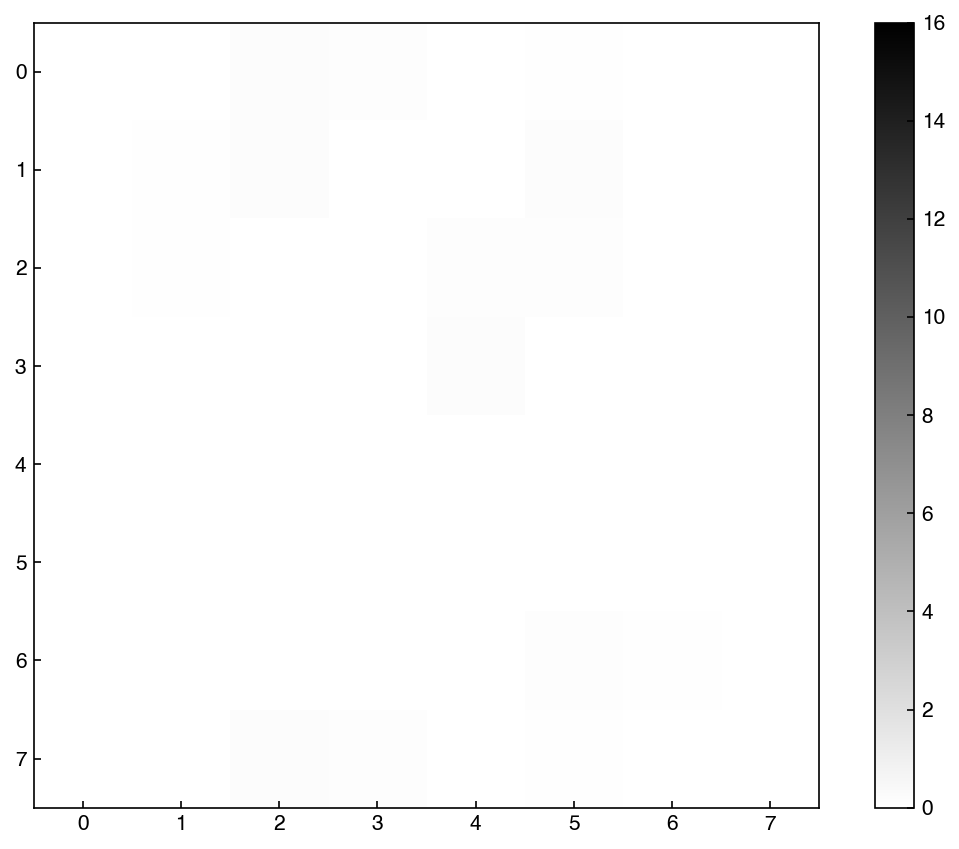

In [8]:
def show_image(digit_data, n, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    img = digit_data[n].reshape(8,8)
    colormap = ax.imshow(img, cmap='binary', vmin=0, vmax=16)
    ax.get_figure().colorbar(colormap, ax=ax)
    
show_image(eig_vecs, 0)

We can see that this is clearly not random, but has some patterns associated with digits. This is the vector along which there is the most variance.

### Exercise: Find the rank of the covariance matrix

Hint: Remember the definition of rank in term of eigenvalues.

In [9]:
print('Rank of the covariance matrix: {}'.format(np.linalg.matrix_rank(C)))
print(eig_vals)

Rank of the covariance matrix: 61
[1.79006930e+02 1.63717747e+02 1.41788439e+02 1.01100375e+02
 6.95131656e+01 5.91085249e+01 5.18845391e+01 4.40151067e+01
 4.03109953e+01 3.70117984e+01 2.85190412e+01 2.73211698e+01
 2.19014881e+01 2.13243565e+01 1.76367222e+01 1.69468639e+01
 1.58513899e+01 1.50044602e+01 1.22344732e+01 1.08868593e+01
 1.06935663e+01 9.58259779e+00 9.22640260e+00 8.69036872e+00
 8.36561190e+00 7.16577961e+00 6.91973881e+00 6.19295508e+00
 5.88499123e+00 5.15586690e+00 4.49129656e+00 4.24687799e+00
 4.04743883e+00 3.94340334e+00 3.70647245e+00 3.53165306e+00
 3.08457409e+00 2.73780002e+00 2.67210896e+00 2.54170563e+00
 2.28298744e+00 1.90724229e+00 1.81716569e+00 1.68996439e+00
 1.40197220e+00 1.29221888e+00 1.15893419e+00 9.31220008e-01
 6.69850594e-01 4.86065217e-01 2.52350432e-01 9.91527944e-02
 6.31307848e-02 6.07377581e-02 3.96662297e-02 1.49505636e-02
 8.47307261e-03 3.62365957e-03 1.27705113e-03 6.61270906e-04
 4.12223305e-04 0.00000000e+00 0.00000000e+00 0.000

Note that so far we have not reduced the dimensionality at all. We simply found an orthonormal set of vectors that are aligned with the data and rotated the data along these new "axes". For dimensional reduction, we can think of PCA from the perspective of an objective function. The objective function for PCA is:

$||\underline{\underline{X}} - \underline{\underline{A}}||_F$

where $||\underline{\underline{M}}||_F = \sum_i \sum_j M_{ij}^2$ is the "Frobenius norm" and $\underline{\underline{A}}$ is a "low rank" approximation of $\underline{\underline{X}}$.

Obviously if this objective function is simply minimized for all the elements of $\underline{\underline{A}}$ it will give us $\underline{\underline{X}}$, which is rather trivial. The key is that we apply a constraint on the rank:

$\min_{\underline{\underline{A}}} ||\underline{\underline{X}} - \underline{\underline{A}}||_F$ subject to $rank(\underline{\underline{A}}) \leq k$

In other words we are looking for the closest rank-$k$ matrix to the original matrix $\underline{\underline{X}}$. 

Note: We will not derive the connection between this minimization problem and the covariance matrix eigenvalues here, but details are available in Hastie & Tibshirani Sec. 14.5.

In practice, we can find the low-rank approximation by only keeping the highest $k$ eigenvalues/vectors:

In [10]:
k = 20
projector = eig_vecs[:k, :].T
print(projector.shape)
print(X_mnist.shape)
X_k = np.dot(X_mnist,projector)
print(X_k.shape)

(64, 20)
(1797, 64)
(1797, 20)


We see that the new dataset has the same number of points (1797) but now only has 20 features. We can assess the quality of the reduced-dimensional dataset by comparing the amount of variance, remembering that the total variance is the sum of the variance along each principal component vector:

In [11]:
print('Retained variance: {}'.format(sum(eig_vals[:k])/sum(eig_vals)))

Retained variance: 0.8943031165985261


We can also create a "scree plot" that shows the amount of retained variance as a function of number of componenets:

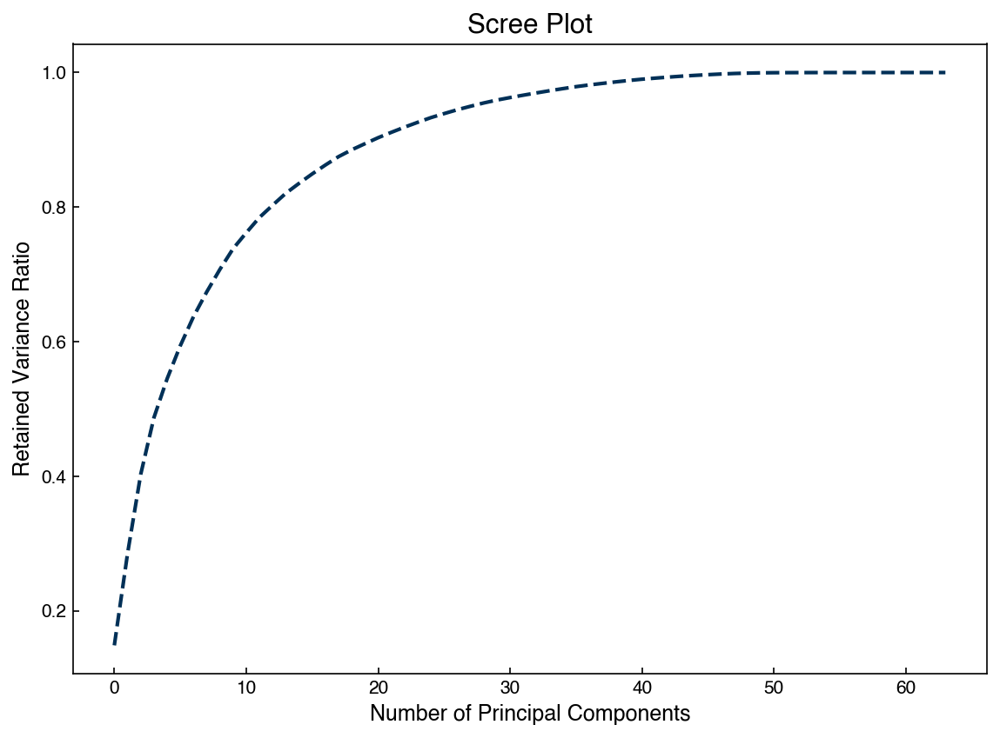

In [12]:
fig, ax = plt.subplots()
N = len(eig_vals)
ax.plot(range(N), np.cumsum(eig_vals)/sum(eig_vals))
ax.set_xlabel('Number of Principal Components')
ax.set_ylabel('Retained Variance Ratio')
ax.set_title('Scree Plot');

We can also assess the "stress" for the reduced dimension matrix as a function of number of dimensions:

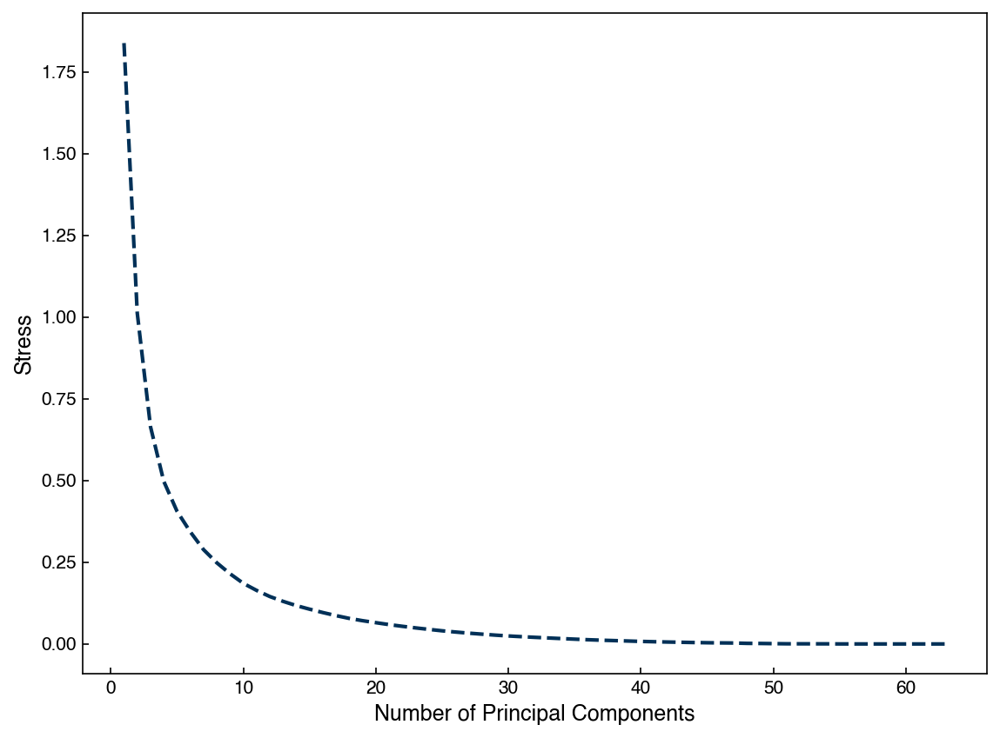

In [13]:
stresses = []
for k in range(1,N):
    projector = eig_vecs[:k, :].T
    X_k = np.dot(X_mnist,projector)
    stresses.append(stress(X_mnist, X_k))

fig, ax = plt.subplots()
ax.plot(range(1,N), stresses)
ax.set_xlabel('Number of Principal Components')
ax.set_ylabel('Stress');

We can also project onto 2 dimensions and visualize the data:

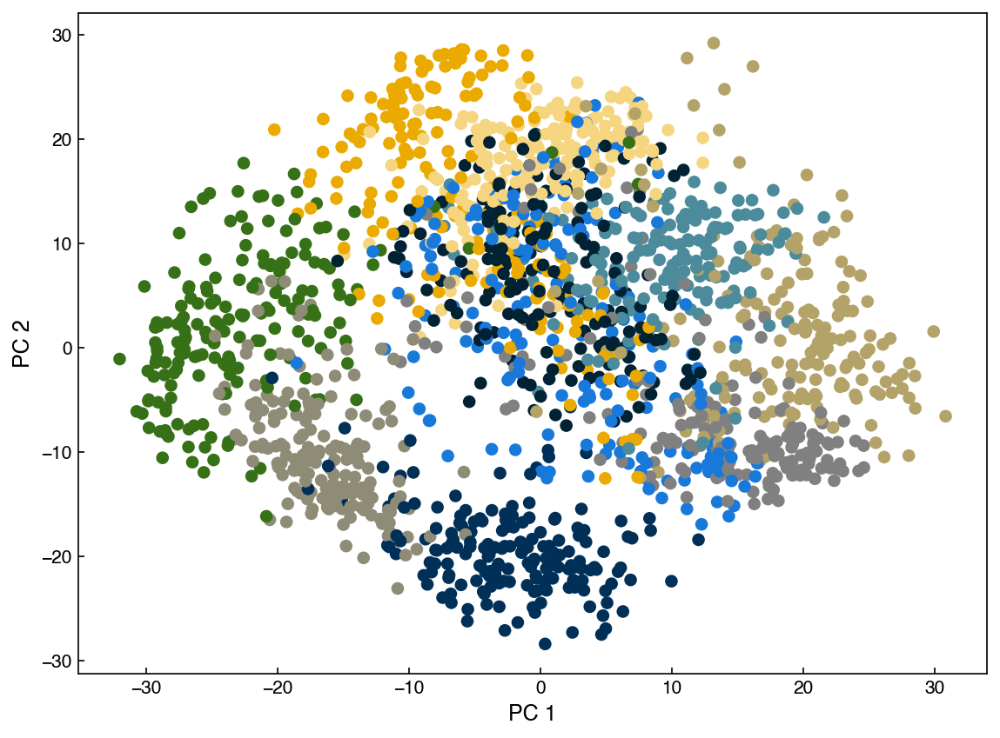

In [14]:
k = 2
projector = eig_vecs[:k, :].T
X_k = np.dot(X_mnist, projector)

fig,ax = plt.subplots()

ax.scatter(X_k[:, 0], X_k[:, 1], c = clrs[y_mnist])
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2');

Each different color in this plot represents a different digit identity. We can add some labels to make it easier to interpret:

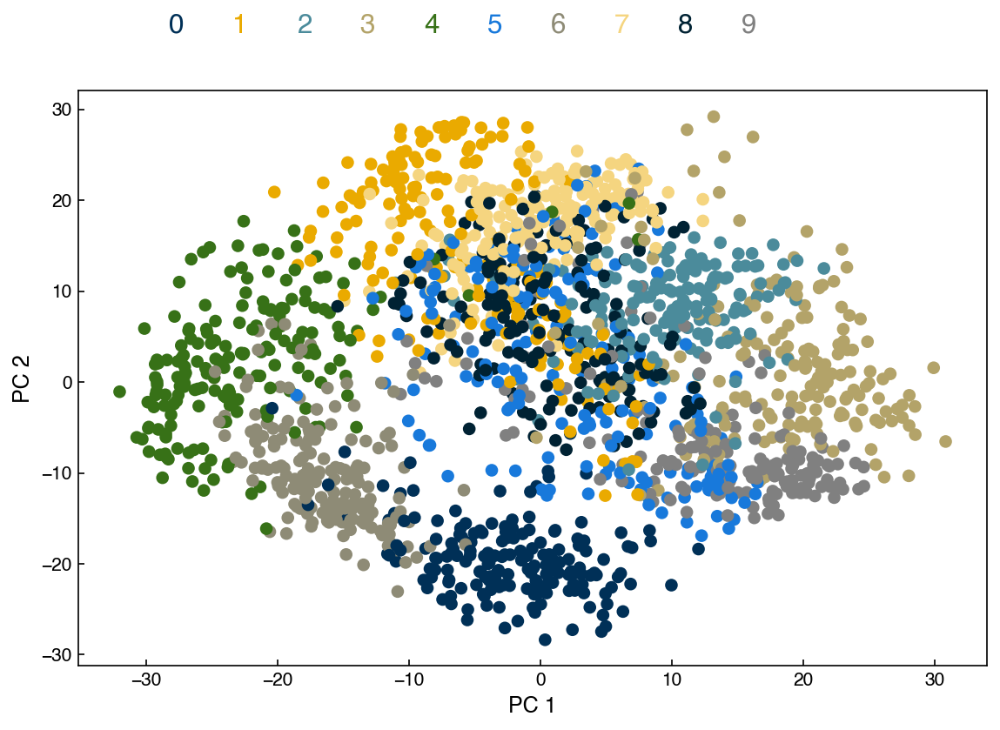

In [15]:
def add_labels(ax, colors = clrs):
    xpos = 0.1
    for label in range(0, 10):
        c = colors[label]
        ax.annotate(str(label), xy = [xpos, 1.1], xycoords = 'axes fraction', color = c, size = 15)
        xpos += 0.07

add_labels(ax)
fig

Remember that PCA is *unsupervised*, so even though we are visualizing the labels here we did not use them to find the principal components. Another interesting feature of PCA is that it is *invertible*. We can select a point in the low-dimensional space and project it back to the high-dimensional space:

In [16]:
X_reconstructed = np.dot(projector, X_k.T).T

print(X_reconstructed.shape)

(1797, 64)


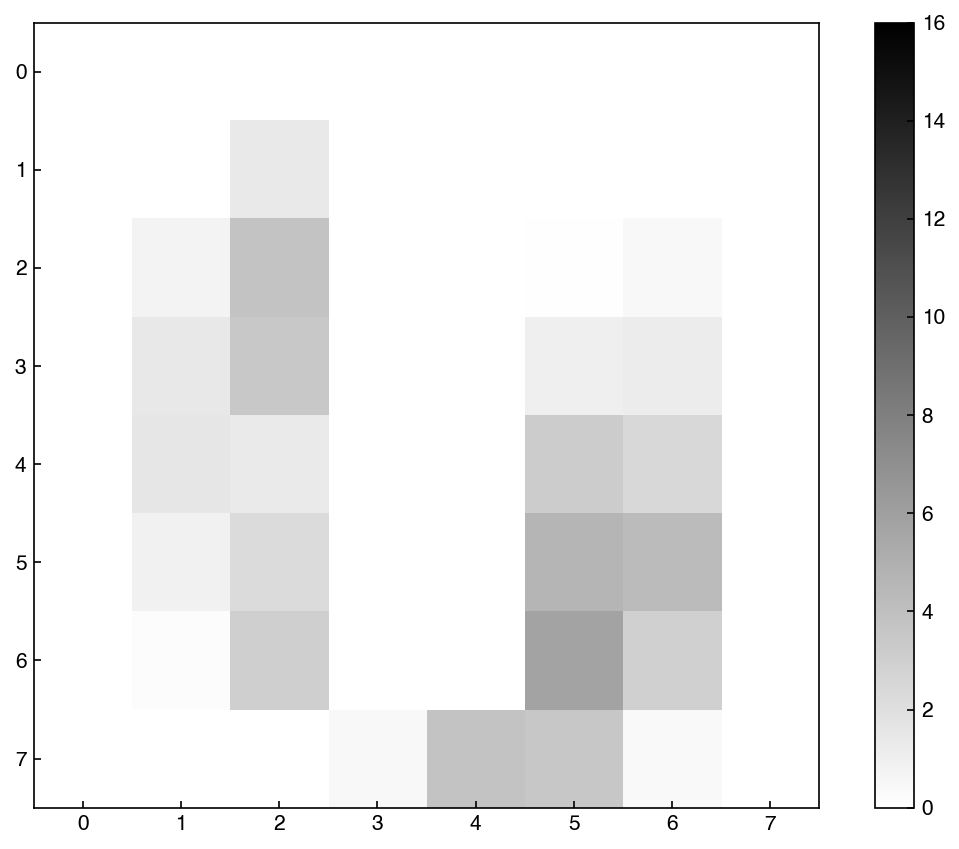

In [17]:
show_image(X_reconstructed, 0)

We can see how this changes as we increase the amount of dimensions:

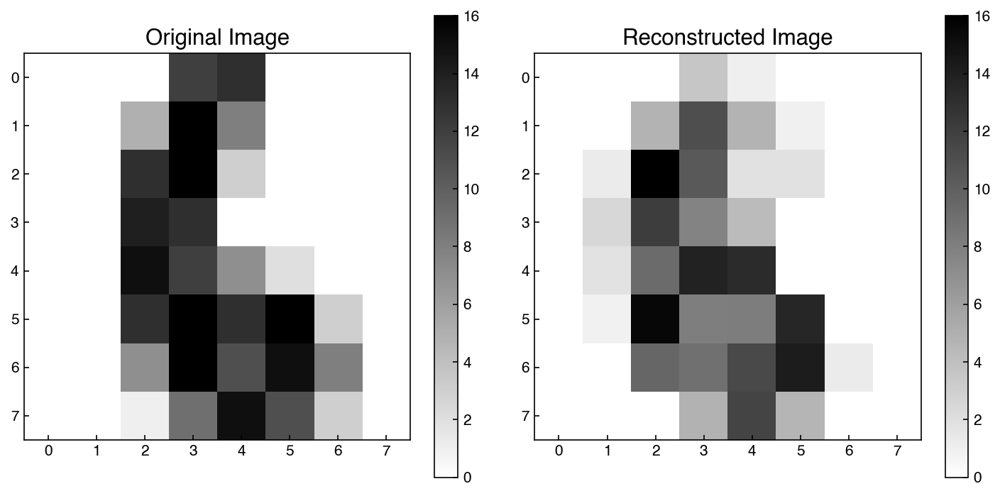

In [18]:
k = 10
projector = eig_vecs[:k, :].T
X_k = np.dot(X_mnist, projector)
X_reconstructed = np.dot(projector, X_k.T).T

fig, axes = plt.subplots(1, 2, figsize = (10, 5))
index = 6
show_image(X_mnist, index, ax = axes[0])
show_image(X_reconstructed, index, ax = axes[1])
axes[0].set_title('Original Image')
axes[1].set_title('Reconstructed Image');

This is an example of how dimensionality reduction could be used for image compression or de-noising. If we only store the low-rank approximation it will require less memory. Similarly, the reconstructed version may actually have less noise, since the noise will typically be random (and therefore it will be dropped in the reconstruction).

Finally, we can come up with new points that aren't even in the original dataset. For example, we can come up with an "average" of a given digit:

(10,)


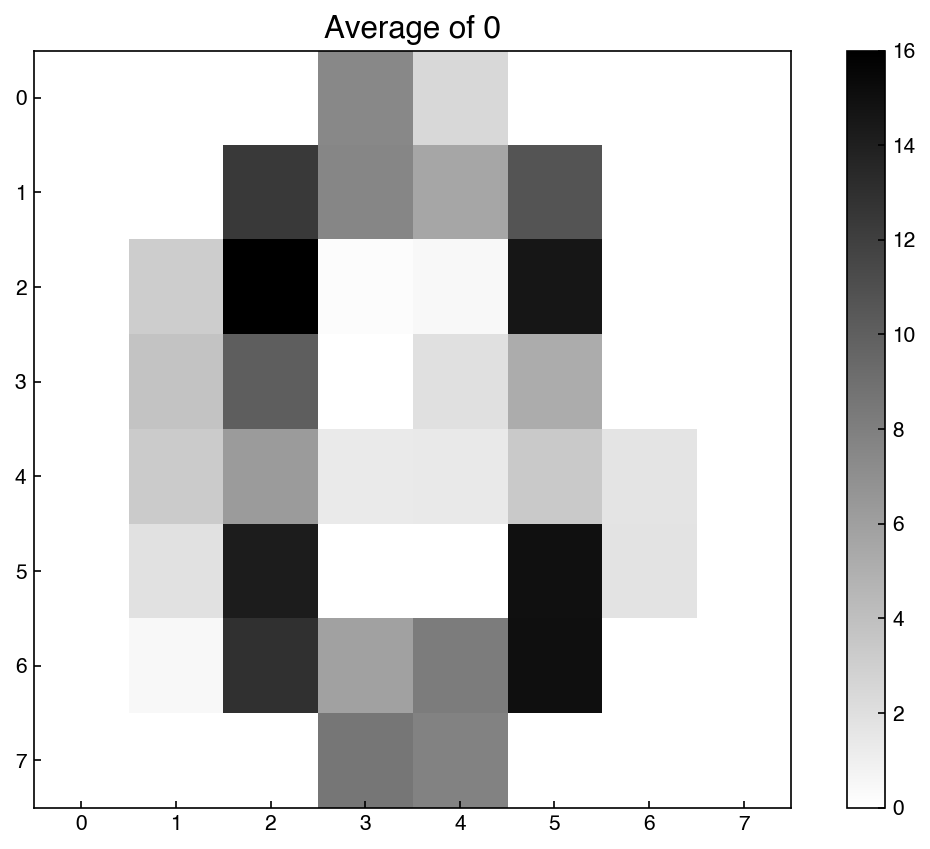

In [19]:
digit_idxs = y_mnist == 0
X_lowD_digit = X_k[digit_idxs].mean(axis = 0)
print(X_lowD_digit.shape)

X_reconstructed = np.dot(projector, X_lowD_digit.T).T
X_reconstructed = X_reconstructed.reshape(1, -1)

fig, ax = plt.subplots()
show_image(X_reconstructed, 0, ax = ax)
ax.set_title('Average of 0');

This is an "average" example of a 0 based on the 10-dimensional representation of the digits.

### Exercise: Find the "average" 10-dimensional vector for an "8"

Use PCA to project the data onto 10 dimensions, then select the points labeled as 8 and take the average. 

In [20]:
digit_idxs = y_mnist == 8
X_lowD_8 = X_k[digit_idxs].mean(axis = 0)
print(X_lowD_digit)

[ -2.28714734 -19.4125737    2.12896496   5.33976559   9.93898522
 -23.36268307  -8.83730922  10.23672289   7.4251487  -33.22891825]


From here on we will rely on the `scikit-learn` PCA implementation to reduce the amount of code needed and speed things up:

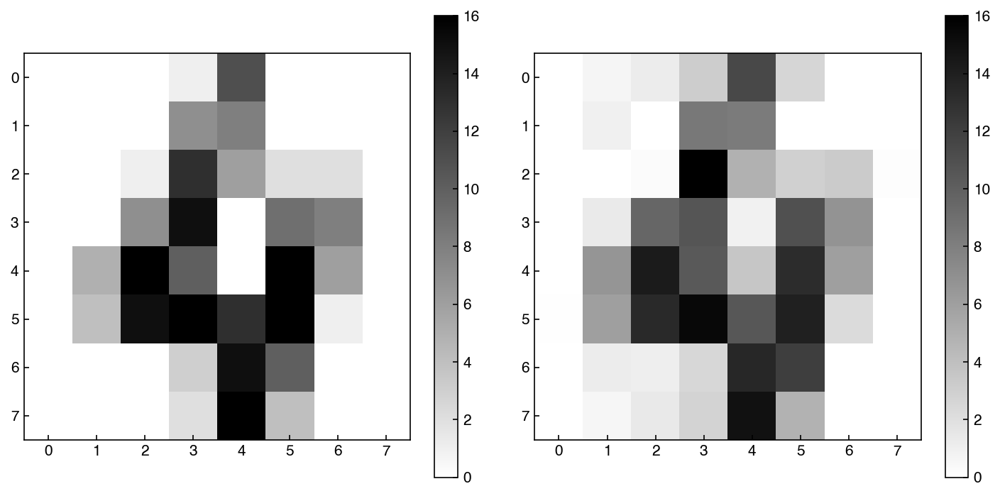

In [21]:
from sklearn.decomposition import PCA

k = 20
pca_model = PCA(n_components = k)
pca_model.fit(X_mnist)
X_k = pca_model.transform(X_mnist)
X_reconstructed = pca_model.inverse_transform(X_k)

fig, axes = plt.subplots(1, 2, figsize = (10, 5))
index = 4
show_image(X_mnist, index, ax = axes[0])
show_image(X_reconstructed, index, ax = axes[1])

We can extract the same outputs from `scikit-learn` model, but they have different names as usual. For example, we can find the explained variance ratio:

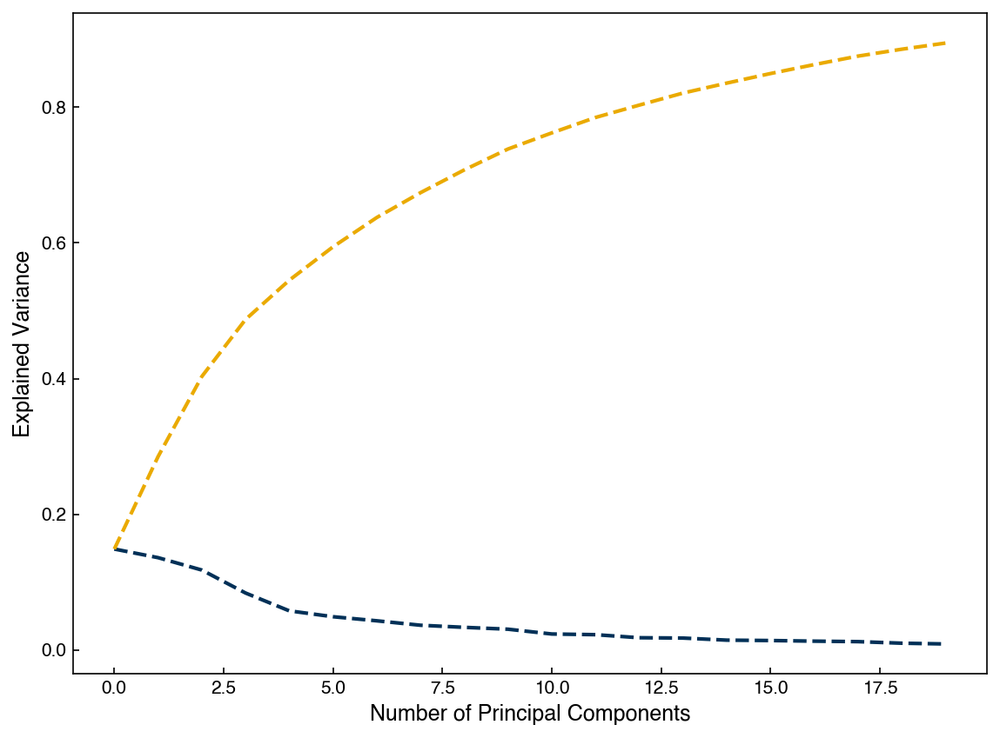

In [22]:
evr = pca_model.explained_variance_ratio_
fig, ax = plt.subplots()
ax.plot(range(len(evr)), evr)
ax.plot(range(len(evr)), np.cumsum(evr))
ax.set_xlabel('Number of Principal Components')
ax.set_ylabel('Explained Variance');

As usual, you can find the other outputs and methods in [the documentation](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html).

In conclusion, PCA is one of the most widely used techniques in dimensional reduction because it is:

* Unsupervised - We did not use the labels to determine the statistics
* Projectable - It is easy to project a new data point into the reduced dimensional space
* Invertible - It is easy to move from the low-dimensional space to the high dimensional space

However, its weakness is that it is linear in the original space. It does not do well with non-linear patterns.

## Kernel PCA

The solution to non-linearity in PCA is a familiar one: using a "kernel" to perform PCA in an even-higher dimensional space that captures non-linearities. The concept here is that rather than using the covariance matrix the eigenvalues of a "kernel matrix" are used:

$K_{ij} = \kappa(\vec{x}_i, \vec{x}_j)$ where $\kappa$ is a kernel function such as the radial basis function:

$\kappa_{rbf}(\vec{x}_i, \vec{x}_j) = \exp(-\gamma ||\vec{x}_i - \vec{x}_j||^2)$

We will not go into the details, but instead show an example of how it works with the `scikit-learn` implementation. We will revisit our "moons" dataset to see how it works:

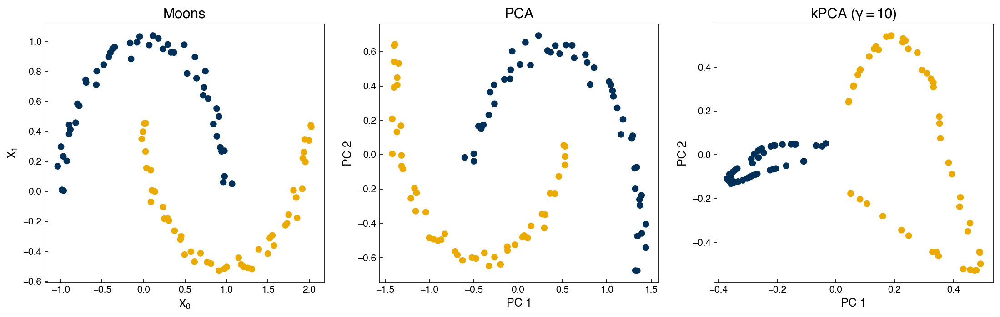

In [23]:
from sklearn.datasets import make_moons
from sklearn.decomposition import KernelPCA, PCA

X_m, y_m = make_moons(n_samples = 100, random_state = 0, noise = 0.04)

k = 2
gamma = 10
lPCA = PCA(n_components = k)
kPCA = KernelPCA(n_components = k, kernel = 'rbf', gamma = gamma, fit_inverse_transform = True)

lPCA.fit(X_m)
X_PCA = lPCA.transform(X_m)

kPCA.fit(X_m)
X_kPCA = kPCA.transform(X_m)

fig,axes = plt.subplots(1, 3, figsize = (15, 5))
axes[0].scatter(X_m[:, 0], X_m[:, 1], c = clrs[y_m])
axes[0].set_title('Moons')
axes[0].set_xlabel('$X_0$')
axes[0].set_ylabel('$X_1$')
axes[1].scatter(X_PCA[:, 0], X_PCA[:, 1], c = clrs[y_m])
axes[1].set_title('PCA')
axes[1].set_xlabel('PC 1')
axes[1].set_ylabel('PC 2')
axes[2].scatter(X_kPCA[:, 0], X_kPCA[:, 1], c = clrs[y_m])
axes[2].set_title('kPCA ($\gamma=${})'.format(gamma))
axes[2].set_xlabel('PC 1')
axes[2].set_ylabel('PC 2');

We can see that while PCA fails to separate the two datasets, kernel PCA is successful! However, we had to choose a hyperparameter ($\gamma$).

Kernel PCA is also invertible:

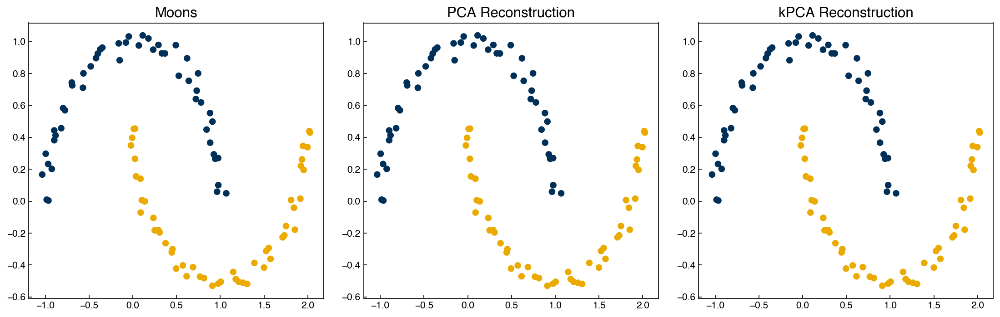

In [24]:
X_PCA_reconstruct = lPCA.inverse_transform(X_PCA)
X_kPCA_reconstruct = kPCA.inverse_transform(X_kPCA)

fig,axes = plt.subplots(1, 3, figsize = (15, 5))

axes[0].scatter(X_m[:, 0], X_m[:, 1], c = clrs[y_m])
axes[0].set_title('Moons')

axes[1].scatter(X_PCA_reconstruct[:, 0], X_PCA_reconstruct[:, 1], c = clrs[y_m])
axes[1].set_title('PCA Reconstruction')

axes[2].scatter(X_kPCA_reconstruct[:, 0], X_kPCA_reconstruct[:, 1], c = clrs[y_m])
axes[2].set_title('kPCA Reconstruction');

### Other PCA variants

PCA is one of the most powerful dimensional reduction techniques and has many other variants. We will not go into the details, but a few worth mentioning are:

* Robust PCA - good for cases where there is sparse data and/or large errors/outliers
* Partial least squares - supervised regression-based PCA that maximizes covariance between input and output
* Linear discriminant analysis - supervised classification-based PCA that maximizes inter-class variance

We will revisit partial least squares and linear discriminant analysis later.

## Other dimensional reduction approaches

There are many other techniques that can be applied for dimensional reduction. Here we will briefly introduce two concepts: manifold learning and autoencoding.

### Manifold learning

Manifold learning approaches utilize distance metrics between points to define their similarity, and then seek to minimize the difference between distance metrics in the high- and low-dimensional spaces. The advantage of distance metrics over variance is that the local structure of data (distances between points) can be more easily exploited. This makes manifold learning techniques much better suited for highly non-linear datasets.

One prototype manifold learning technique is multi-dimensional scaling. The principle is that the "stress" metric which we introduced earlier is directly minimized. The stress is given by:

$S(\vec{x}_{0}, \vec{x}_1, \vec{x}_2, ... \vec{x}_n) =  \left(\frac{\sum_{i=0}^n \sum_{i < j}(d_{ij} - ||x_i - x_j||)^2}{\sum_{i=0}^n \sum_{i < j} d_{ij}^2}\right)^{1/2}$

where $d_{ij}$ is the distance in the high-dimensional space and $\vec{x}$ is the vector in the low-dimensional space. A typical choice is to use the Euclidean distance to compute $d_{ij}$, but there are variants of MDS that use other distance metrics. For example "non-metric" MDS uses distances based on ordering between different points, so that the relative ordering of distances is favored over the numerical value of distances.

The optimization problem is rather challenging, so we will just use the `scikit-learn` implementation to see how MDS works for the hand-written digits:

Stress MDS:  0.3476710001843273
Stress PCA:  0.5405344832395483


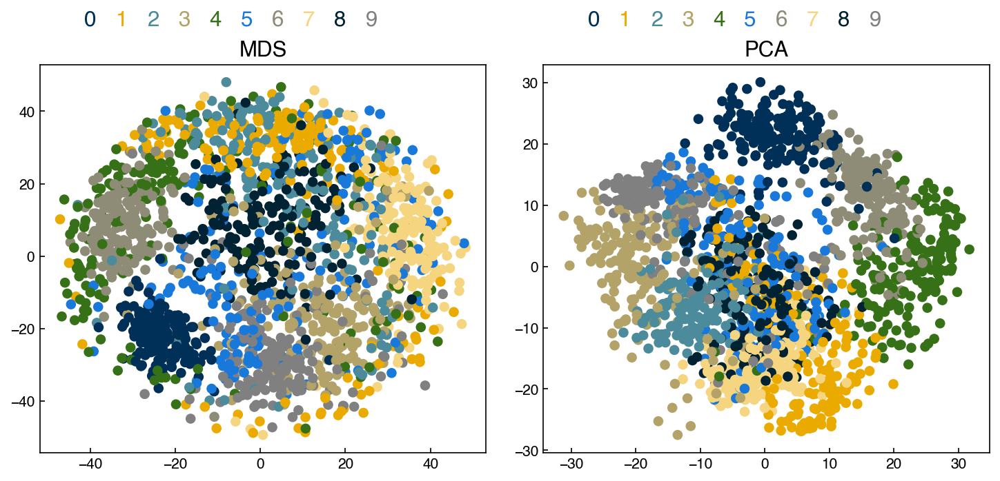

In [25]:
from sklearn.manifold import MDS

k = 2
mds = MDS(n_components = k, n_init = 1, max_iter = 100) #<- note that we need to give some max_iteration and initial guess parameters since this is iterative
X_mds = mds.fit_transform(X_mnist) #<- note that there is no transform method. What does this mean?


pca_model = PCA(n_components = k)
X_k = pca_model.fit_transform(X_mnist)

fig, axes = plt.subplots(1, 2, figsize = (10, 5))
axes[0].scatter(X_mds[:, 0], X_mds[:, 1], c = clrs[y_mnist])
add_labels(axes[0])
axes[0].set_title('MDS')

axes[1].scatter(X_k[:, 0], X_k[:, 1], c = clrs[y_mnist])
add_labels(axes[1])
axes[1].set_title('PCA')

print('Stress MDS: ', stress(X_mds, X_mnist))
print('Stress PCA: ', stress(X_k, X_mnist))

There are clearly some clusters, but the separation is not much better than PCA. Adding more iterations or initial configurations may improve things.

Another popular manifold-based method is tSNE, or t-distribution stochastic neighbor embedding. This uses a probabilistic similarity metric based on the t-distribution, which makes it somewhat better suited to retain both local and global structure. The details of this are well beyond this course, but we can see how it performs:

Stress:  0.7890299639828614


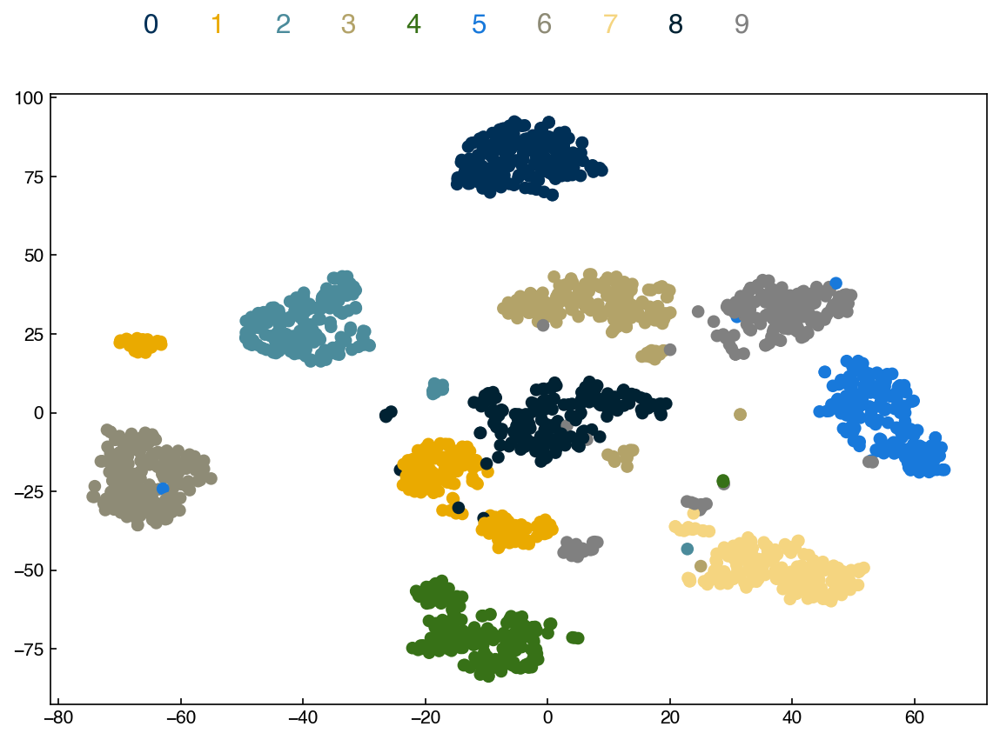

In [26]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, perplexity = 30.0, 
            early_exaggeration = 12.0, 
            learning_rate = 200.0, 
            n_iter = 1000,
            init = 'random',
            method = 'exact')

X_tsne = tsne.fit_transform(X_mnist)

fig, ax = plt.subplots()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c = clrs[y_mnist])
add_labels(ax)
print('Stress: ', stress(X_tsne, X_mnist))

There is slightly better separation than MDS and PCA, but still considerable overlap. There are also many additional hyper-parameters that don't have clear meaning (e.g. "perplexity"), and the outcome will depend on the initial guesses and the algorithms used. While tSNE can be powerful, it also typically requires substantial effort.

Some other common manifold-based techniques include:

* Isomap
* Locally linear embedding (LLE)
* Spectral embedding
* Local tangent space alignment (LTSA)

A comparison:

Manifold techniques can give powerful insight into the high-dimensional structure of data; however, most suffer from several key disadvantages:

* Not projectable - the low dimensional representation only applies to the training points.
* Not invertible - no way to move back to high-dimensional space
* Slow - manifold techniques use distance matrices and hence tend to scale as $N^2$

For these reasons manifold techniques are best for providing insight into the structure of the data, but usually need to be combined with other dimensional reduction approaches for model construction.

### Autoencoding

<img src="images/autoencoder.png">

The final approach we will discuss is "autoencoding", which is the use of neural networks for dimensional reduction. This is a relatively new approach without any implementation in scikit-learn, but it is conceptually different from others so it is included here.

The idea is that you train a neural network with the same data as inputs and outputs, but use an intermediate hidden layer (or layers) with dimensionality smaller than the original data. This forces the data through a "bottleneck" where it is represented in a low-dimensional form. 

This has numerous advantages:

* projectable and invertible - the link between the high/low dimensional representation is defined by the neural net
* fast and scalable - neural networks are computationally efficient
* non-linear and unsupervised - the autoencoder learns the non-linear manifold without needing labels

However, the typical cautions of neural networks apply:

* extremely large training datasets needed
* architecture and hyperparameters need to be tuned/selected
* no intuitive link between low- and high-dimensional representations

This is a field of research on its own, but worth being aware of nonetheless.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Clustering-Overview" data-toc-modified-id="Clustering-Overview-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Clustering Overview</a></span><ul class="toc-item"><li><span><a href="#Problem-statement" data-toc-modified-id="Problem-statement-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Problem statement</a></span></li><li><span><a href="#Types-of-problems/algorithms" data-toc-modified-id="Types-of-problems/algorithms-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Types of problems/algorithms</a></span></li></ul></li><li><span><a href="#Accuracy-and-distance-metrics" data-toc-modified-id="Accuracy-and-distance-metrics-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Accuracy and distance metrics</a></span></li><li><span><a href="#Dataset-Preparation" data-toc-modified-id="Dataset-Preparation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Dataset Preparation</a></span></li><li><span><a href="#Expectation-maximization-models" data-toc-modified-id="Expectation-maximization-models-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Expectation-maximization models</a></span><ul class="toc-item"><li><span><a href="#k-means" data-toc-modified-id="k-means-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>k-means</a></span></li><li><span><a href="#Exercise:-Modify-the-code-above-into-a-function-for-k-means-clustering" data-toc-modified-id="Exercise:-Modify-the-code-above-into-a-function-for-k-means-clustering-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Exercise: Modify the code above into a function for k-means clustering</a></span></li><li><span><a href="#Discussion:-Which-of-these-clusters-might-be-outliers?" data-toc-modified-id="Discussion:-Which-of-these-clusters-might-be-outliers?-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Discussion: Which of these clusters might be outliers?</a></span></li><li><span><a href="#Gaussian-mixture-models" data-toc-modified-id="Gaussian-mixture-models-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Gaussian mixture models</a></span><ul class="toc-item"><li><span><a href="#Expectation-step:" data-toc-modified-id="Expectation-step:-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span>Expectation step:</a></span></li><li><span><a href="#Maximization-step:" data-toc-modified-id="Maximization-step:-4.4.2"><span class="toc-item-num">4.4.2&nbsp;&nbsp;</span>Maximization step:</a></span></li></ul></li><li><span><a href="#Exercise:-Plot-the-silhouette-score-as-a-function-of-number-of-clusters-for-a-GMM-model-on-the-PCA-dataset" data-toc-modified-id="Exercise:-Plot-the-silhouette-score-as-a-function-of-number-of-clusters-for-a-GMM-model-on-the-PCA-dataset-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Exercise: Plot the silhouette score as a function of number of clusters for a GMM model on the PCA dataset</a></span></li></ul></li><li><span><a href="#Density-based-models" data-toc-modified-id="Density-based-models-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Density-based models</a></span><ul class="toc-item"><li><span><a href="#Mean-shift-algorithm" data-toc-modified-id="Mean-shift-algorithm-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Mean shift algorithm</a></span></li><li><span><a href="#Discussion:-What-happens-if-the-initial-guess-is-very-far-away-from-a-cluster?" data-toc-modified-id="Discussion:-What-happens-if-the-initial-guess-is-very-far-away-from-a-cluster?-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Discussion: What happens if the initial guess is very far away from a cluster?</a></span></li><li><span><a href="#Discussion:-How-can-we-modify-the-algorithm-to-find-more-clusters?" data-toc-modified-id="Discussion:-How-can-we-modify-the-algorithm-to-find-more-clusters?-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Discussion: How can we modify the algorithm to find more clusters?</a></span></li><li><span><a href="#Exercise:-Plot-the-silhouette-score-as-a-function-of-bandwidth-for-the-mean-shift-algorithm" data-toc-modified-id="Exercise:-Plot-the-silhouette-score-as-a-function-of-bandwidth-for-the-mean-shift-algorithm-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Exercise: Plot the silhouette score as a function of bandwidth for the mean shift algorithm</a></span></li><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>DBSCAN</a></span></li></ul></li><li><span><a href="#Hierarchical-models" data-toc-modified-id="Hierarchical-models-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Hierarchical models</a></span><ul class="toc-item"><li><span><a href="#Dendrograms" data-toc-modified-id="Dendrograms-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Dendrograms</a></span></li><li><span><a href="#Agglomerative-hierarchical-clustering" data-toc-modified-id="Agglomerative-hierarchical-clustering-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Agglomerative hierarchical clustering</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

In [2]:
import numpy as np
import pandas as pd

clrs = np.array(['#003057', '#EAAA00', '#4B8B9B', '#B3A369', '#377117', '#1879DB', '#8E8B76', '#F5D580', '#002233', '#808080'])

# Clustering

Another common strategy for exploring datasets is to find "clusters" of similar datapoints. This is an unsupervised approach that can help identify patterns in low or high dimensions. This lecture will cover basic considerations and concepts in clustering data, and introduce a few basic classes of algorithms along with examples.

## Clustering Overview

### Problem statement

Clustering algorithms seek to identify data points that are similar to each other based on a set of descriptive features.

Clustering algorithms are **unsupervised** since they do not include output labels. The goal is to extract insight about the dataset based on its inherent structure, rather than to build a model that predicts an output. 

Some common uses for clustering include:

* data compression
* group/class assignment
* searching high-dimensional data
* feature identification
* learning probability distributions
* outlier detection

We will discuss some of these applications, but the same algorithms can be applied in many different ways to solve different problems that we may not discuss.



### Types of problems/algorithms

There are a few key types of clustering algorithms:

**Expectation-maximization** algorthims iteratively compute "expected" clusters and then "maximize" the parameters of the cluster to optimize the expectations. This is somewhat similar to an iterative version of a generalized linear classification algorithm: "classes" are assigned, then boundaries are found to optimize a cost function based on these classes. After this optimization the new class boundaries are used to assign classes again, and the optimization is repeated with new "class" labels.

**Density-based** algorithms utilize local information about data points to identify regions where the data has similar density. Regions where there is substantially lower density of data form boundaries between these clusters. This is somewhat similar to k-nearest neighbors where classes are defined by local environments.

**Hierarchical** algorithms map out the full network of connectivity within a dataset, then use a variable distance cutoff to assign clusters. These algorithms can be understood visually through a dendrogram, and have relatively few hyperparameters but they are more computationally demanding.

A few considerations when selecting a clustering algorithm:

* Some algorithms require defining the number of clusters explicitly (e.g. most expectation-maximization algorithms) while others find this implicitly based on choice of hyperparameters (e.g. density-based or hierarchical)

* Some algorithms allow **mixed membership** where points can belong to multiple clusters based on probabilities.

* Some algorithms can identify/ignore outliers/noise (e.g. density-based), while others attempt to assign clusters to all points (e.g. expectation-maximization and hierarchical).

## Accuracy and distance metrics

Computing the accuracy of unsupervised models is difficult because there is no "right answer". However, it is possible to compute some quantitative metrics based on the concept of a cluster.

* **Silhouette score** is defined for *each point* and is related to two distances:
    - $a$ is the average distance between a point and all other points in its cluster
    - $b$ is the average distance between a point and the points in the next nearest cluster
    - $S = \frac{b-a}{max(a,b)}$ is the silhoutte score
    - $S = -1$ implies totally incorrect, $S=1$ implies totally correct
    - Works best for dense, well-separated clusters
    - Does not work well for density-based clusters (e.g. DBSCAN)
    
The silhouette score can help identify individual points that are not well-clustered, or an average/max silhouette score can be used to evaluate the quality of the entire clustering model. Other metrics can be used to evaluate the overall model:

* **Variance ratio criterion** or "Calinski-Harabasz score" is related to the "within class" variance (similar to intra-class variance for classificaiton) and the "between class" variance (similar to the interclass variance for classification). The mathematical definition is available [here](https://www.tandfonline.com/doi/abs/10.1080/03610927408827101) but is beyond the scope of this course.
    - Variance ratio will be higher for dense and well-separated clusters
    - Not bounded so it can be difficult to know what is "good" and what is "bad"
    - Does not work well for density-based clusters (e.g. DBSCAN)
    
These approaches can be utilized to identify hyperparameters such as the number of clusters in the case where there is no *a priori* expectation about the number of clusters.

* **Information Criteria** The concept of "information criteria" can also be computed for some clustering models where there is an underlying probability distribution. Instead of using the error between the model and the predictions, as we did for supervised models, the "log-likelihood" that the data is described by the underlying model can be computed. The details are beyond the scope of this course, but we will use built-in functions to compute information criteria for some clustering models. This is a great way of assessing the quality of a model, but it is only possible for a limited class of clustering models.

* **Classification Metrics** Another common technique is to use clustering for classification problems. In this case the error metrics from classification can be applied (e.g. confusion matrices, precision, recall, etc.). The comparison of clustering and classification can provide insight into how well the classes are captured by proximity in the feature space. The downside is that this is only possible if labels are known, and is not truly an unsupervised evaluation of the data.

Finally, it is worth noting that essentially all clustering algorithms rely on some form of **distance metric**. The way that distance is defined can have substantial impact on how clustering analyses perform. Some common choices to compute the distance between two points $i$ and $j$:

* Euclidean distance ($L_2$ norm): $D_{ij} = \sqrt{sum((\vec{x}_i - \vec{x}_j)^2)}$
* Manhattan distance ($L_1$ norm): $D_{ij} = sum(abs(\vec{x}_i - \vec{x}_j))$
* Chebyshev distance ($L_\infty$ norm): $D_{ij} = max(abs(\vec{x}_i - \vec{x}_j))$
* Minkowsky distance ($L_P$ norm): $D_{ij} = (sum((\vec{x}_i - \vec{x}_j)^P)^{1/P}$

It is also possible to define a weighted distance metric that can implicitly standardize the data, or weight nearby points much higher than far away points. An example is the Mahalanobis distance:

* Mahalanobis distance: $D_{ij} = (\vec{x}_i - \vec{\mu})^T \underline{\underline{C}}^{-1} (\vec{x}_j - \vec{\mu})$
    - $\mu$ is the mean vector
    - $\underline{\underline{C}}$ is the covariance matrix
    
   
* Kernel distance: $D_{ij} = (\vec{x}_i)^T \underline{\underline{K}} (\vec{x}_j)$
    - $\underline{\underline{K}}$ is a kernel-based weight matrix

For simplicity we will typically default to Euclidean distance in most examples; however, changing distance metrics can substantially improve performance in real problems so it is worthwhile to experiment. This is usually as simple as changing a keyword for `scikit-learn` models, or writing a short function to compute the necessary distance.

It is also useful to consider the **cophenetic correlation coefficient** when dealing with different distance metrics or "linkages" in hierarchical representations of high-dimensional data. This can be considered as a comparison between distance metrics and the Euclidean distance. This will be discussed more later.

## Dataset Preparation

In this lecture we will work with the Dow chemical data:

In [3]:
df = pd.read_excel('data/impurity_dataset-training.xlsx')

def is_real_and_finite(x):
    if not np.isreal(x):
        return False
    elif not np.isfinite(x):
        return False
    else:
        return True

all_data = df[df.columns[1:]].values #drop the first column (date)
numeric_map = df[df.columns[1:]].applymap(is_real_and_finite)
real_rows = numeric_map.all(axis=1).copy().values #True if all values in a row are real numbers
X_dow = np.array(all_data[real_rows,:-5], dtype='float') #drop the last 5 cols that are not inputs
y_dow = np.array(all_data[real_rows,-3], dtype='float')
y_dow = y_dow.reshape(-1,1)
print(X_dow.shape, y_dow.shape)

(10297, 40) (10297, 1)


We know that the features have different units, so we can standardize them to give them comparable scales, and we will take every 5th data point to speed things up:

In [4]:
X = (X_dow - X_dow.mean(axis = 0)) / X_dow.std(axis = 0)
X = X[::5] # take every 5th datapoint
print(X.shape)

(2060, 40)


Next we will apply a few different dimensionality reduction algorithms so that we can see how different clustering algorithms perform on different low-dimensional representations. Note that clustering algorithms generally work the same in high-dimensions, but it is much more difficult to get intuition if we can't visualize the results.

This is a common strategy in exploratory data analysis: apply dimensional reduction to get some intuition about the data in low dimensions, then try to see if the same intuition holds in the full high-dimensional space.

In [5]:
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import Isomap, TSNE

n_components = 2

pca = PCA(n_components = n_components)
%time X_pca = pca.fit_transform(X)

kpca = KernelPCA(n_components = n_components, kernel = 'rbf', gamma = 0.1)
%time X_kpca = kpca.fit_transform(X)

tsne = TSNE(n_components = n_components)
%time X_tsne = tsne.fit_transform(X)

CPU times: user 20.4 ms, sys: 3.04 ms, total: 23.4 ms
Wall time: 15.1 ms
CPU times: user 470 ms, sys: 42.2 ms, total: 512 ms
Wall time: 283 ms
CPU times: user 53.4 s, sys: 3.27 s, total: 56.7 s
Wall time: 20.5 s


We can plot the different results:

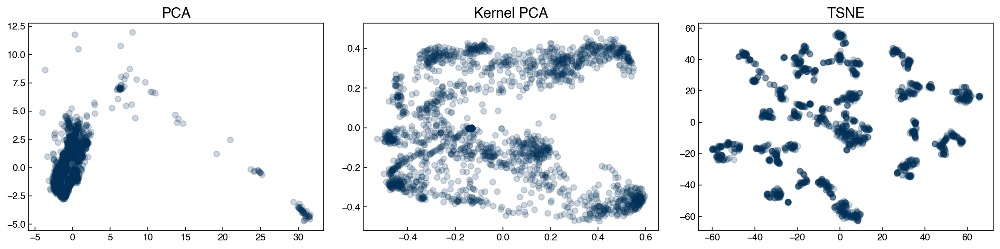

In [6]:
fig, axes = plt.subplots(1, 3, figsize = (15, 4))
data = [X_pca, X_kpca, X_tsne]
labels = ['PCA', 'Kernel PCA', 'TSNE']
for X_i, label, ax in zip(data, labels, axes):
    ax.scatter(X_i[:, 0], X_i[:, 1], alpha = 0.2)
    ax.set_title(label)
    
plt.tight_layout()

We can see that the structure of the low-dimensional representations depends on the technique we use. We will use these datasets as examples for various types of clustering models to see how we might end up with different "clusters" of chemical process parameters depending on the dimensional reduction and clustering technique we use.

In a real scenario, we would want to go back to the original data and process parameters to see if these clusters align with our intuition as engineers. For example, clusters might represent different steady-states or set-points for the process.

## Expectation-maximization models

### k-means

The k-means algorithm is the simplest and most intuitive clustering algorithm. It performs remarkably well under a number of assumptions:

* Number of clusters are known
* Clusters are roughly spherical
* Clusters are separated by linear boundaries

Even if these assumptions are violated, it often works anyway, especially in high dimensions (the "blessing" of dimensionality).

The k-means algorithm works using the principal of **expectation-maximization**. This is an iterative type of algorithm that contains two basic steps:

* Expectation: Assign points based on some "expectation" metric.
* Maximization: Revise expectations based on maximizing a fitness metric.

In the case of k-means we:

* Expect that points close to the center of a cluster belong to that cluster
* Maximize the proximity of points to the center of a cluster by moving the center

This process is iterated until convergence.

We will create a simple "toy" implementation of k-means, and see how it works for the Dow dataset.

In [7]:
def dist(pt1, pt2):
    # Euclidean distance between two points
    # Note that this can also be performed with np.linalg.norm(pt1-pt2)
    return np.sqrt(sum([(xi - yi)**2 for xi, yi in zip(pt1, pt2)]))

def expected_assignment(pt, cluster_centers):
    # Expectation: find the closest points to each cluster center
    dists = [dist(pt, ci) for ci in cluster_centers] #<- find distance to each center
    min_index = dists.index(min(dists)) #<- find the index (cluster) with the minimum dist
    return min_index

def new_centers(cluster_points, centers):
    # Maximization: maximize the proximity of centers to points in a cluster
    centers = list(centers)
    for i, ci in enumerate(cluster_points):
        if ci != []:
            centers[i] = np.mean(ci, axis = 0)
    return centers

Now we need an "initial guess" of cluster centers and we can apply the algorithm to a toy dataset:

(2060, 2)


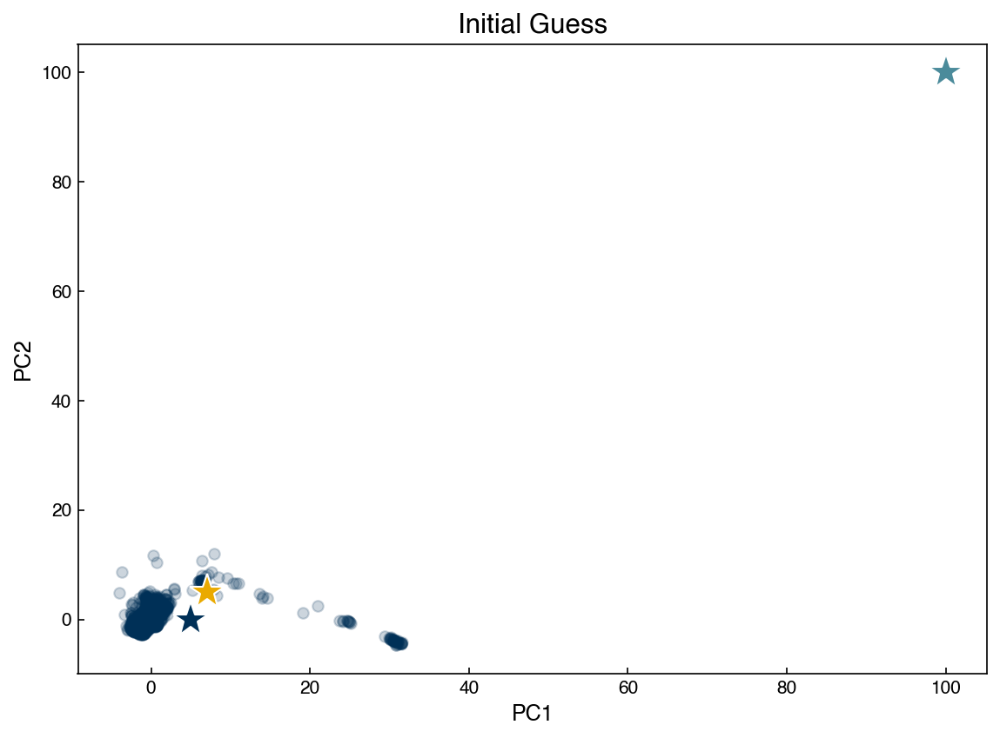

In [8]:
X = X_pca
print(X.shape)

#cluster_centers = ([-0.5,0], [0.5,0])
cluster_centers = ([5, 0], [7, 5], [100, 100])
fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], alpha = 0.2)
for i, ci in enumerate(cluster_centers):
    ax.plot(ci[0], ci[1], marker = '*', markersize = '20', color=clrs[i], mec = 'w')
    
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('Initial Guess');

Run the cell below repeatedly to see how the algorithm converges. Re-run the cell above to re-start the algorithm.

[-0.88397179 -0.09374578]
[17.88903744  1.89714391]
[100, 100]


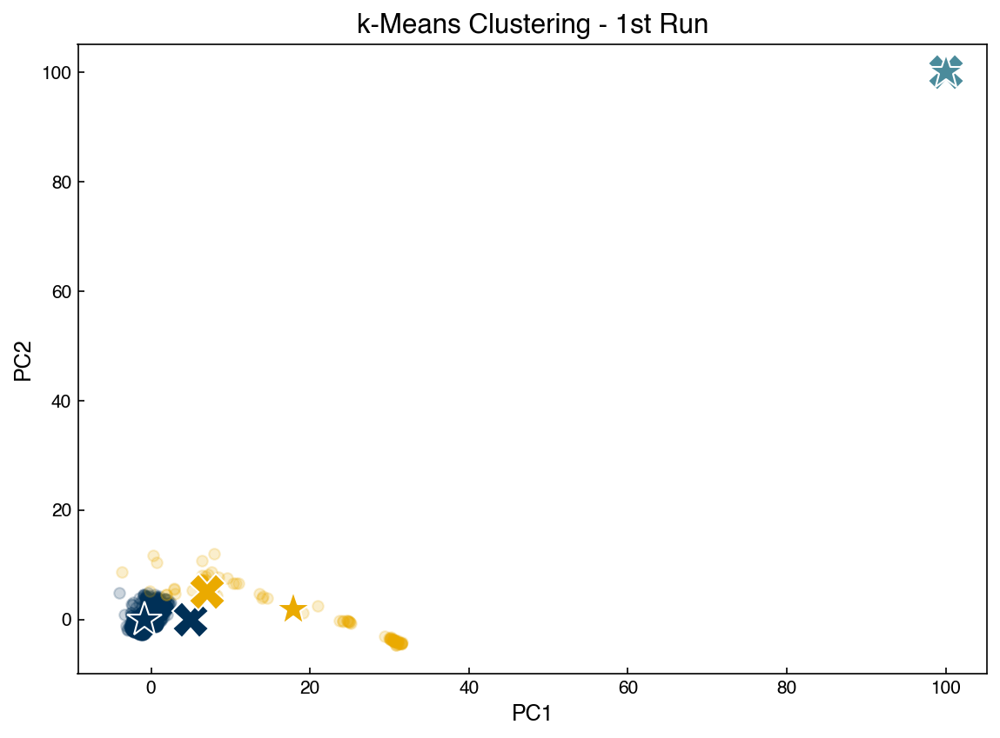

In [9]:
fig, ax = plt.subplots()

old_centers = cluster_centers

# Which cluster do we "expect" each point to belong to?
clusters = [[], [], [], []]
for pt in X:
    cluster_idx = expected_assignment(pt, cluster_centers)
    clusters[cluster_idx].append(pt)
    
# What centers best represent these new assignments?
cluster_centers = new_centers(clusters, cluster_centers)

# Plot new assignments
for i, ci in enumerate(clusters):
    for pt in ci:
        ax.plot(pt[0], pt[1], marker = 'o', color = clrs[i], alpha = 0.2)

# Plot old centers
for i, ci in enumerate(old_centers):
    ax.plot(ci[0], ci[1], marker = 'X', markersize = '20', color = clrs[i], markeredgecolor = 'w')

# Plot new centers
for i, ci in enumerate(cluster_centers):
    print(ci)
    ax.plot(ci[0], ci[1], marker = '*', markersize = '20', color = clrs[i], mec = 'w')
    
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('k-Means Clustering - 1st Run');

[-0.77233592  0.03861822]
[25.74453066 -1.28727407]
[100, 100]


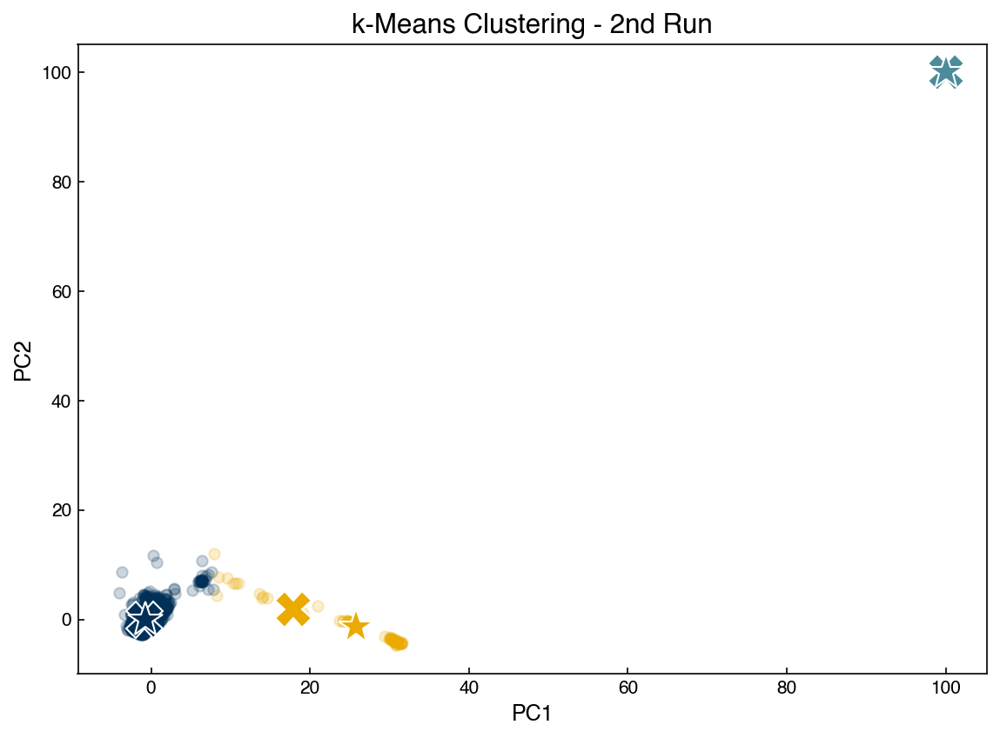

In [10]:
fig, ax = plt.subplots()

old_centers = cluster_centers
    
clusters = [[], [], [], []]
for pt in X:
    cluster_idx = expected_assignment(pt, cluster_centers)
    clusters[cluster_idx].append(pt)
    
cluster_centers = new_centers(clusters, cluster_centers)

for i, ci in enumerate(clusters):
    for pt in ci:
        ax.plot(pt[0], pt[1], marker = 'o', color = clrs[i], alpha = 0.2)
        
for i, ci in enumerate(old_centers):
    ax.plot(ci[0], ci[1], marker = 'X', markersize = '20', color = clrs[i], mec = 'w')
    
for i, ci in enumerate(cluster_centers):
    print(ci)
    ax.plot(ci[0], ci[1], marker = '*', markersize = '20', color = clrs[i], mec = 'w')
    
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('k-Means Clustering - 2nd Run');

[-0.73658236  0.06425897]
[27.89284524 -2.43335379]
[100, 100]


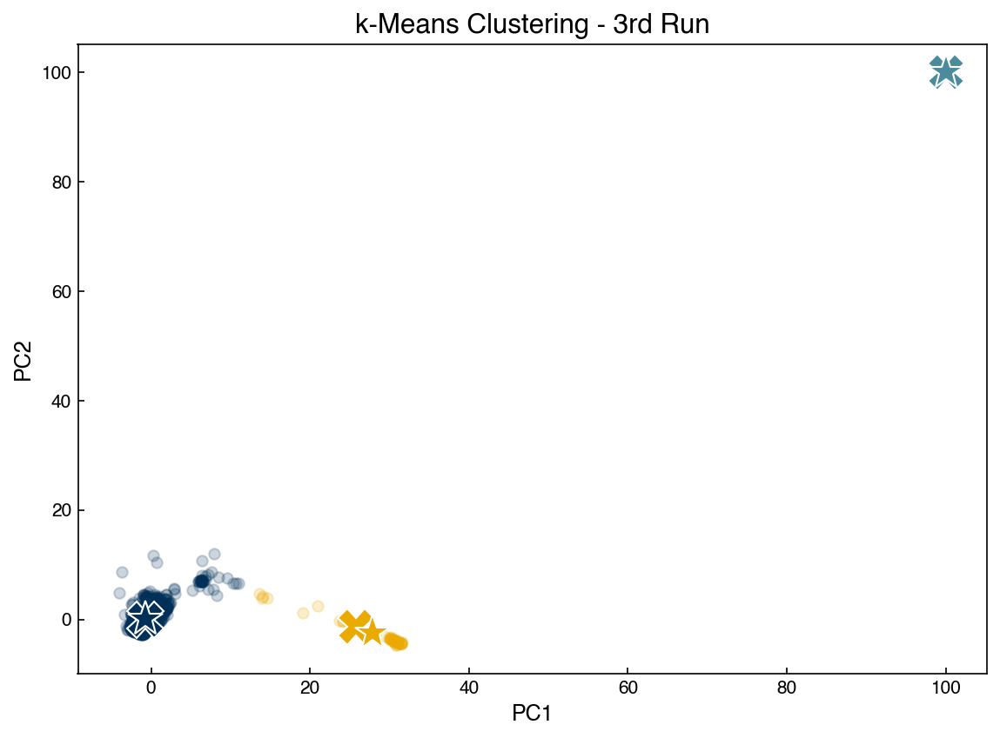

In [11]:
fig, ax = plt.subplots()

old_centers = cluster_centers
    
clusters = [[], [], [], []]
for pt in X:
    cluster_idx = expected_assignment(pt, cluster_centers)
    clusters[cluster_idx].append(pt)
    
cluster_centers = new_centers(clusters, cluster_centers)

for i, ci in enumerate(clusters):
    for pt in ci:
        ax.plot(pt[0], pt[1], marker = 'o', color = clrs[i], alpha = 0.2)
        
for i, ci in enumerate(old_centers):
    ax.plot(ci[0], ci[1], marker = 'X', markersize = '20', color = clrs[i], mec = 'w')
    
for i, ci in enumerate(cluster_centers):
    print(ci)
    ax.plot(ci[0], ci[1], marker = '*', markersize = '20', color = clrs[i], mec = 'w')
    
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('k-Means Clustering - 3rd Run');

### Exercise: Modify the code above into a function for k-means clustering

The function should take the dataset and the initial guesses as arguments. You will need to implement a stopping criterion that is based on the change in the cluster centers between iterations.

In [12]:
def kmeans(X, centers, tol = 0.1):
    old_centers = list(centers)
    
    clusters = []
    for i in range(len(old_centers)):
        clusters.append([])
    
    # assign clusters to points in X
    for pt in X:
        cluster_idx = expected_assignment(pt, cluster_centers)
        clusters[cluster_idx].append(pt)
    
    # get the new cluster centers
    cluster_centers = new_centers(clusters, cluster_centers)
    
    # tol = ?
    # how we can apply a stopping criterion?

In practice it is more efficient to utilize the `scikit-learn` implementation of `KMeans`:

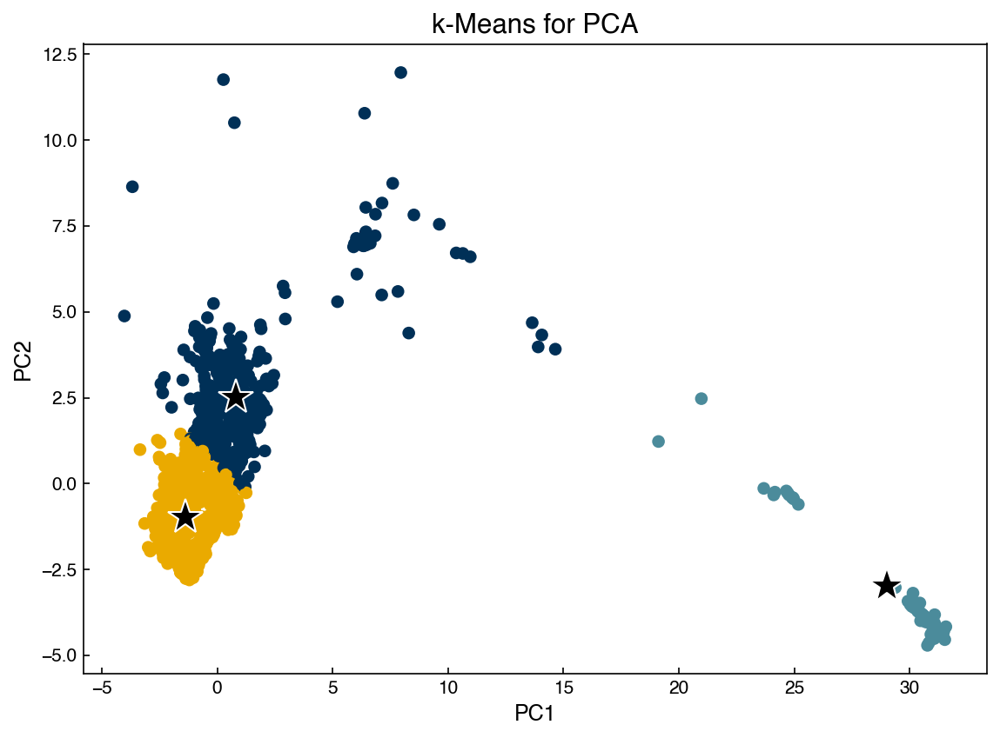

In [13]:
from sklearn.cluster import KMeans

n_clusters = 3
random_state = 20
X = X_pca #scikit-learn is much more efficient, so we can run it on the whole datset

model = KMeans(n_clusters = n_clusters)#, random_state=random_state)
model.fit(X)
y_predict = model.predict(X)
centers = model.cluster_centers_

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], c = clrs[y_predict])
for center in centers:
    x_i = center[0]
    y_i = center[1]
    ax.plot(x_i, y_i, marker = '*', color = 'k', mec = 'w', markersize = 20)
    
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('k-Means for PCA');

We can apply the same algorithm to other dimensional reduction techniques:

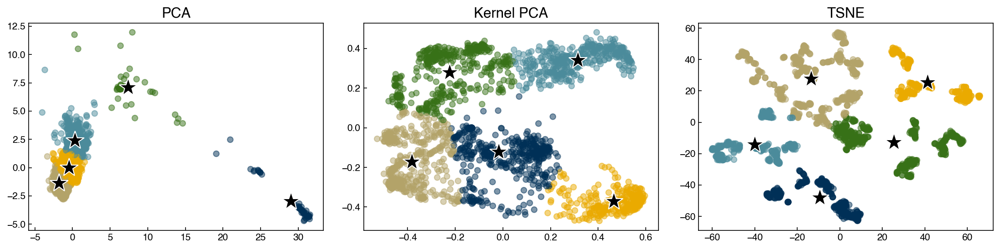

In [14]:
data = [X_pca, X_kpca, X_tsne]
labels = ['PCA', 'Kernel PCA', 'TSNE']
fig, axes = plt.subplots(1, 3, figsize = (15,4))

n_clusters = 5
random_state = 0

for X_i, label, ax in zip(data, labels, axes):
    model = KMeans(n_clusters = n_clusters, random_state = random_state)
    model.fit(X_i)
    y_predict = model.predict(X_i)
    centers = model.cluster_centers_
    ax.scatter(X_i[:, 0], X_i[:, 1], c = clrs[y_predict], alpha = 0.5)
    for center in centers:
        x_i = center[0]
        y_i = center[1]
        ax.plot(x_i, y_i, marker = '*', color = 'k', mec = 'w', markersize = 20)
        ax.set_title(label)

### Discussion: Which of these clusters might be outliers?

> The navy-colored cluster on the PCA plot could be an outlier. It has different patterns as compared to other clusters, but we cannot ensure whether they are actual outliers. To check this, it is good to go back and look the original data. Moreover, some other outliers can be identified from Kernel PCA and TSNE if you increase `n_clusters` to a bigger number.

### Gaussian mixture models

Gaussian mixture models, or GMM's, are another clustering approach based on expectation maximization. The approach is to model each cluster as a Gaussian distribution, and to model the entire dataset as a mixture of Gaussians. Mathematically:

$ P(\vec{x}) = \sum_k \phi_k \mathcal{N}(\vec{x}, \vec{\mu}, \vec{\sigma})$

where $\mathcal{N}$ is the normal distribution:

* one dimension: $N(x, \mu, \sigma) = \frac{1}{\sqrt{2 \pi \sigma^2}} \exp\left( \frac{-(x-\mu)^2}{2 \sigma ^2} \right)$

* multi-dimensional: $N(\vec{x}, \vec{\mu}, \underline{\underline{\Sigma}}) = \frac{1}{(2 \pi |\underline{\underline{\Sigma}}|)} \exp \left( \frac{1}{2} (\vec{x} - \vec{\mu})^T \underline{\underline{\Sigma}}^{-1}  (\vec{x} - \vec{\mu}) \right)$

where $\underline{\underline{\Sigma}}$ is the covariance matrix.

#### Expectation step:

We can calculate the expected probability that a point $i$ is in a cluster $k$ with the following formula for a 1D Gaussian:

$\gamma_{ik} = \frac{\phi_k \mathcal{N}(\vec{x}_i, \vec{\mu}_k, \vec{\sigma}_k)}{\sum_j \phi_j \mathcal{N}(\vec{x}_i, \vec{\mu}_j, \vec{\sigma}_j)}$

#### Maximization step:

The parameters of the distributions can then be updated by calculating the maximum likelihood estimators for $\phi$, $\mu$, and $\sigma$, similar to the way these parameters would be estimated for a single distribution:

* $\phi_k = \sum_{i=1}^N \frac{\gamma_{ik}}{N}$
* $\mu_k = \frac{\sum_{i=1}^N \gamma_{ik} x_i}{\sum_{i=1}^N \gamma_{ik}} $
* $\sigma_k = \frac{\sum_{i=1}^N \gamma_{ik} (x_i - \mu_k)^2}{\sum_{i=1}^N \gamma_{ik}} $

These parameters are derived by maximizing $P(\vec{x})$ with respect to each parameter. The formulas for multi-dimensional Gaussians are derived in the same way but are more complex.

<img src="images/GMM.gif" width="500">

Gaussian mixture models are much more flexible than k-means models because they have different variances and covariances between clusters. Let's see how GMM's perform for some of the earlier datasets:

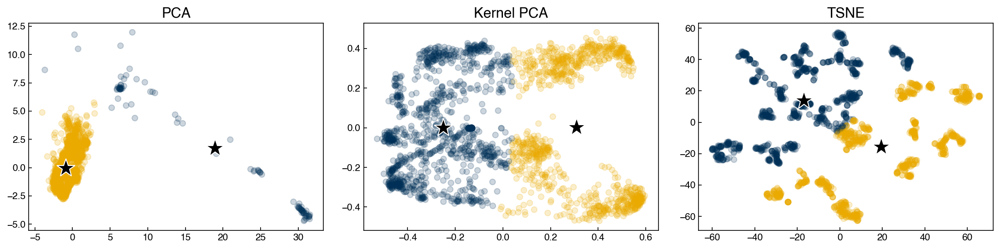

In [15]:
from sklearn.mixture import GaussianMixture

n_clusters = 2
random_state = 0
covariance_type = 'full' #full, tied, spherical

fig, axes = plt.subplots(1, 3, figsize = (15, 4))

for X_i, label, ax in zip(data, labels, axes):
    model = GaussianMixture(n_components = n_clusters, random_state = random_state, covariance_type = covariance_type)
    model.fit(X_i)
    y_predict = model.predict(X_i)
    centers = model.means_
    ax.scatter(X_i[:, 0], X_i[:, 1], c = clrs[y_predict], alpha=0.2)
    for center in centers:
        x_i = center[0]
        y_i = center[1]
        ax.plot(x_i, y_i, marker = '*', color = 'k', mec = 'w', markersize = 20)
        ax.set_title(label)

Note that we set the covariance type to `full`. This means that all entries in the covariance matrix are optimized during the "maximization" step. Selecting "tied" means that only the diagonal elements of the covariance matrix will be non-zero, and selecting "spherical" means that only diagonal elements will be non-zero and they will all be equal. Using `full` provides the most parameters to optimize, but also takes the longest and is most sensitive to initial guesses. Using `spherical` is very similar to k-means.

GMM's have the same weakness as k-means since we need to know the number of clusters beforehand. One way to be more quantitative is to assess a metric such as the Silhouette score as a function of number of clusters.

In [16]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

X_i = X_pca
n_clusters = 10

model = GaussianMixture(n_components = n_clusters, random_state = random_state, covariance_type = covariance_type)
model.fit(X_i)
y_predict = model.predict(X_i)

silhouette = silhouette_score(X_i, y_predict)
c_h_score = calinski_harabasz_score(X_i, y_predict)

print(silhouette)
print(c_h_score)

0.3889340481198901
5375.873303272862


### Exercise: Plot the silhouette score as a function of number of clusters for a GMM model on the PCA dataset

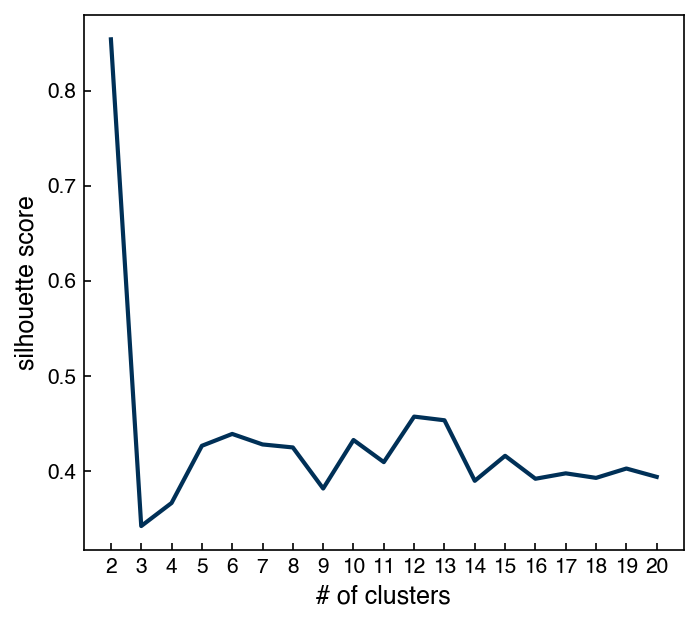

In [17]:
n_clusters_list = np.arange(2, 21, 1)

silhouette_list = []
for n in n_clusters_list:
    m = GaussianMixture(n_components = n)
    m.fit(X_i)
    predict = m.predict(X_i)
    
    silhouette = silhouette_score(X_i, predict)
    silhouette_list.append(silhouette)
    
fig, ax = plt.subplots(figsize = (5, 4.5), dpi = 150)
ax.plot(n_clusters_list, silhouette_list, '-')
ax.set_xlabel('# of clusters')
ax.set_ylabel('silhouette score')
ax.set_xticks(n_clusters_list);

One additional difference between GMM's and k-means is that GMM's support "mixed membership". GMM's assign points to clusters by selecting the cluster that a point has the highest probability of belonging to. However, we can also check the probabilities for all clusters:

In [18]:
probabilities = model.predict_proba(X_i)
clusters = model.predict(X_i)
print("Probabilities shape: {}".format(probabilities.shape))
print("Clusters shape: {}".format(clusters.shape))
print((probabilities[0, :], clusters[0]))

Probabilities shape: (2060, 10)
Clusters shape: (2060,)
(array([0.00000000e+00, 1.59901044e-01, 1.85204790e-05, 8.73882805e-82,
       0.00000000e+00, 7.90943391e-08, 0.00000000e+00, 8.35967386e-01,
       2.87052747e-32, 4.11297046e-03]), 7)


We can see that the predicted cluster is the one with the highest probability:

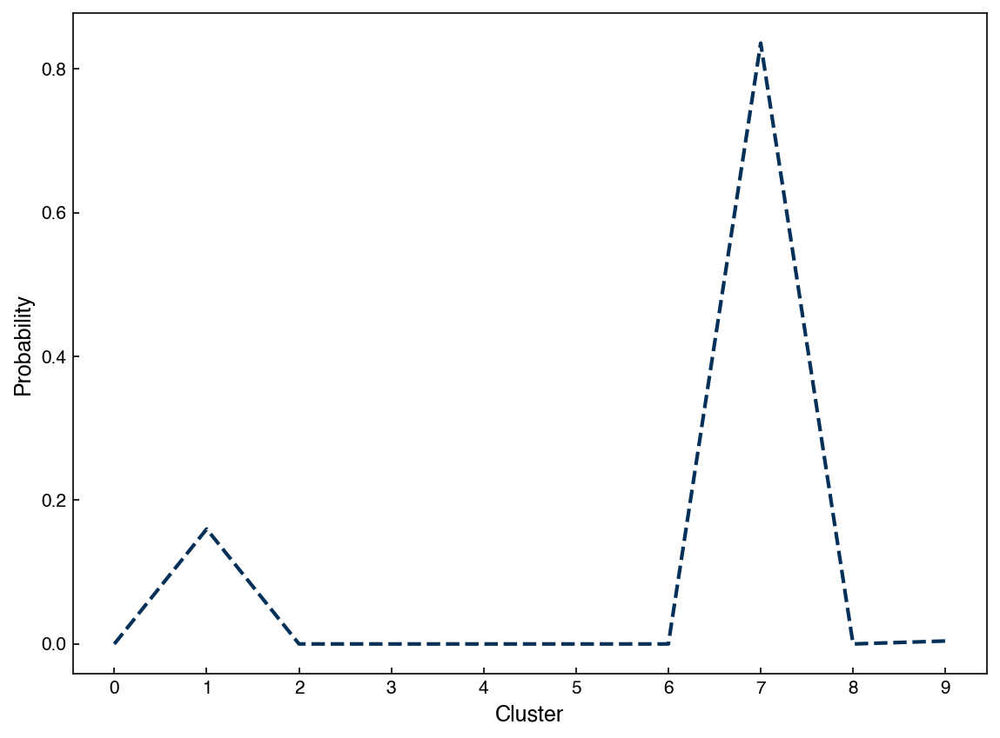

In [19]:
fig, ax = plt.subplots()

point_idx = 0
ax.plot(range(0, n_clusters), probabilities[point_idx, :])
#ax.plot([clusters[point_idx], clusters[point_idx]], [0, 1])
ax.set_xlabel('Cluster')
ax.set_ylabel('Probability')
ax.set_xticks(range(10));

However, there is also a non-zero probability that the point is in other clusters (cluster number 7 in this case). We can use this to figure out which points are well-clustered and which ones are not:

(660, 2)


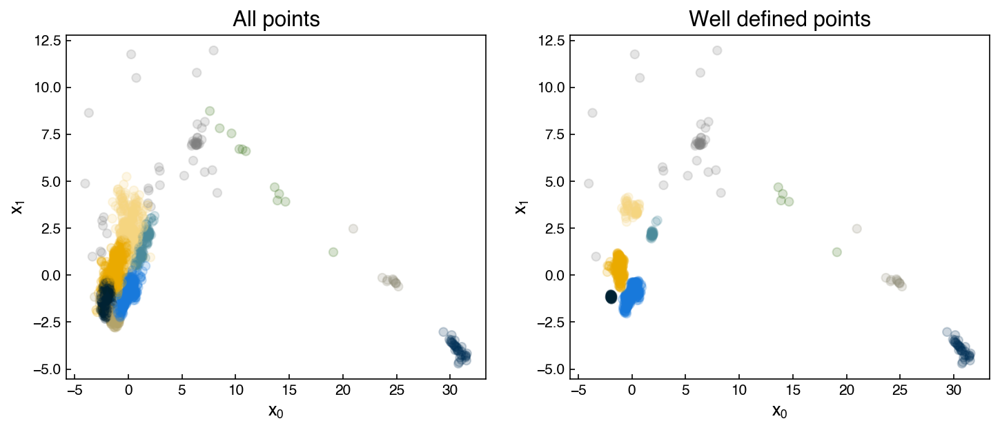

In [20]:
well_defined = []
for point in X_i:
    point = point.reshape(1, -1)
    probs = model.predict_proba(point)
    if probs.max() > 0.95:
        well_defined.append(point.ravel())

X_welldefined = np.array(well_defined)
print(X_welldefined.shape)
y_welldefined = model.predict(X_welldefined)

fig, axes = plt.subplots(1, 2, figsize = (10, 4.5))

axes[0].scatter(X_i[:, 0], X_i[:, 1], c = clrs[y_predict], alpha = 0.2)
axes[0].set_title('All points')
axes[1].scatter(X_welldefined[:,0], X_welldefined[:,1], c = clrs[y_welldefined], alpha = 0.2)
axes[1].set_title('Well defined points')

for ax in axes:
    ax.set_xlabel('$x_0$')
    ax.set_ylabel('$x_1$')

Of course, the silhoutte scores should be much higher for these "well defined" clusters:

In [21]:
silhouette = silhouette_score(X_i, y_predict)
silhouette_welldefined = silhouette_score(X_welldefined, y_welldefined)
print("Silhouette score for all points: {}".format(silhouette))
print("Silhouette score for well-defined points: {}".format(silhouette_welldefined))

Silhouette score for all points: 0.3889340481198901
Silhouette score for well-defined points: 0.6344883005388762


Another advantage of GMM's is that they have some built-in statistical measures. For example, we can compute the Bayesian information critera for the model:

In [22]:
print(model.bic(X_i))

12428.380003864966


We will cover more details of the BIC and other advanced features of GMM's when we discuss generative models.

## Density-based models

Density-based clustering algorithms consider local density of points and utilize this information to group points into clusters.

### Mean shift algorithm

The simplest density-based algorithm is the "mean shift" algorithm. This is similar to k-means in that we seek the centroid of each cluster. The difference is that in mean shift the number of clusters does not need to be specified. Instead a "window" is specified, and at each iteration the centroids are updated to centroid of all points in each window. Let's see how this works for a single point:

In [23]:
def get_distance(x1, x2):
    # we will use the numpy 2-norm to calculate Euclidean distance:
    return np.linalg.norm(x1-x2, 2) #<- the 2 is optional here since 2 is the default.

def get_nearby_points(x, x_list, r):
    # r is the radius
    dist_pairs = []
    for i,xi in enumerate(x_list):
        dist = get_distance(x, xi)
        dist_pairs.append([dist, i, xi]) #<- gives us the distance for each point
    in_window = [pt[-1] for pt in dist_pairs if pt[0] <= r]
    return in_window

def get_new_centroid(old_centroid, x_list, r):
    in_range = get_nearby_points(old_centroid, x_list, r)
    if len(in_range) == 0:
        new_centroid = old_centroid
    else:
        new_centroid = np.array(in_range).mean(axis = 0)
    return new_centroid

Note the similarity to the kNN functions for prior lectures. It is a good idea to "abstract out" the distance function so that we could try other distance metrics easily.

Let's apply this to a single point in a dataset:

In [24]:
guess = [5, 0] #<- set an initial guess

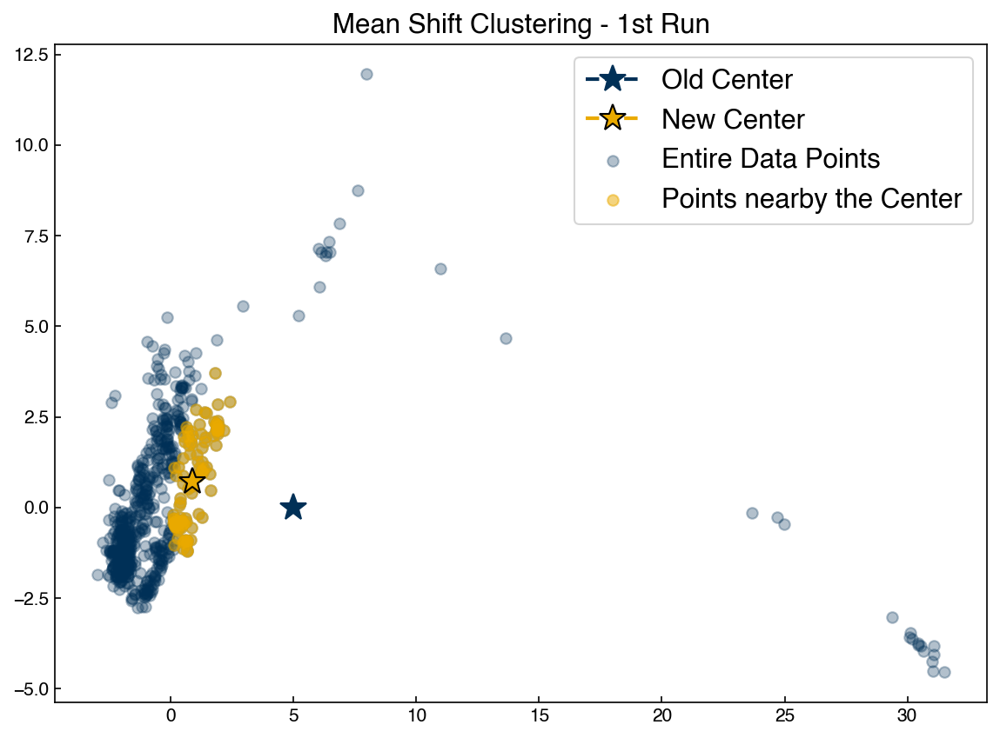

In [25]:
X = X_pca[::3] #take every third point to speed things up
r = 5

nearby = get_nearby_points(guess, X, r)
nearby = np.array(nearby)
new = get_new_centroid(guess, X, r)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(nearby[:, 0], nearby[:, 1], color = clrs[1], alpha = 0.5)
ax.plot(guess[0], guess[1], marker = '*', color = clrs[0], markersize = 15)
ax.plot(new[0], new[1], marker='*', color = clrs[1], markersize = 15, mec = 'k')

ax.set_title('Mean Shift Clustering - 1st Run')
ax.legend(['Old Center', 'New Center', 'Entire Data Points', 'Points nearby the Center'])

guess = new

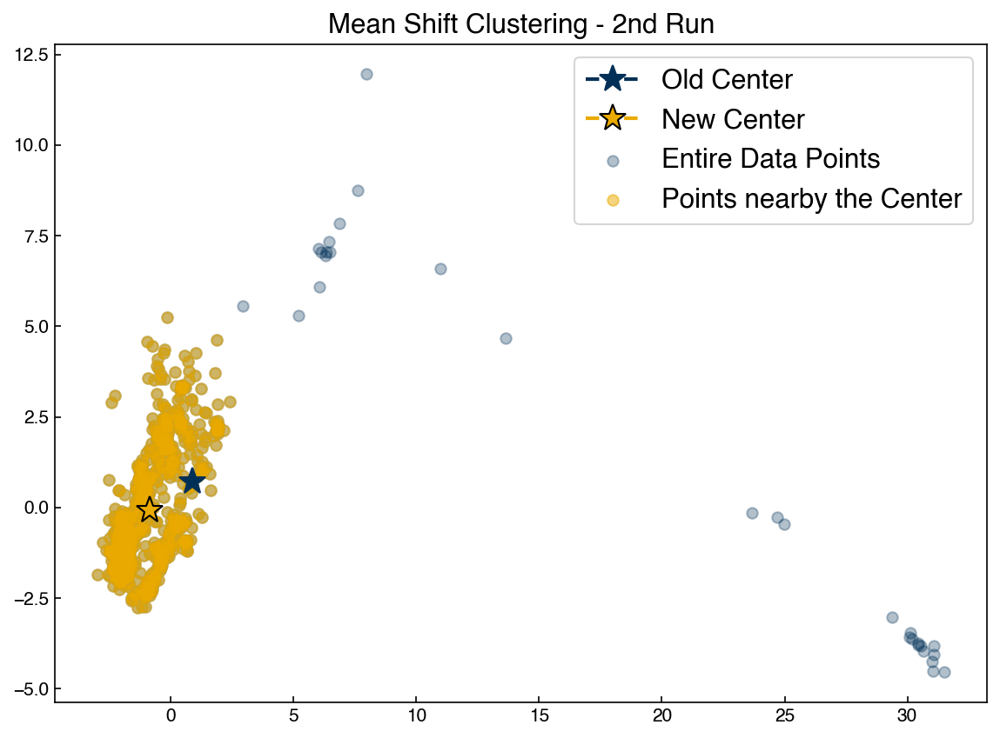

In [26]:
nearby = get_nearby_points(guess, X, r)
nearby = np.array(nearby)
new = get_new_centroid(guess, X, r)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(nearby[:, 0], nearby[:, 1], color = clrs[1], alpha = 0.5)
ax.plot(guess[0], guess[1], marker = '*', color = clrs[0], markersize = 15)
ax.plot(new[0], new[1], marker='*', color = clrs[1], markersize = 15, mec = 'k')

ax.set_title('Mean Shift Clustering - 2nd Run')
ax.legend(['Old Center', 'New Center', 'Entire Data Points', 'Points nearby the Center'])

guess = new

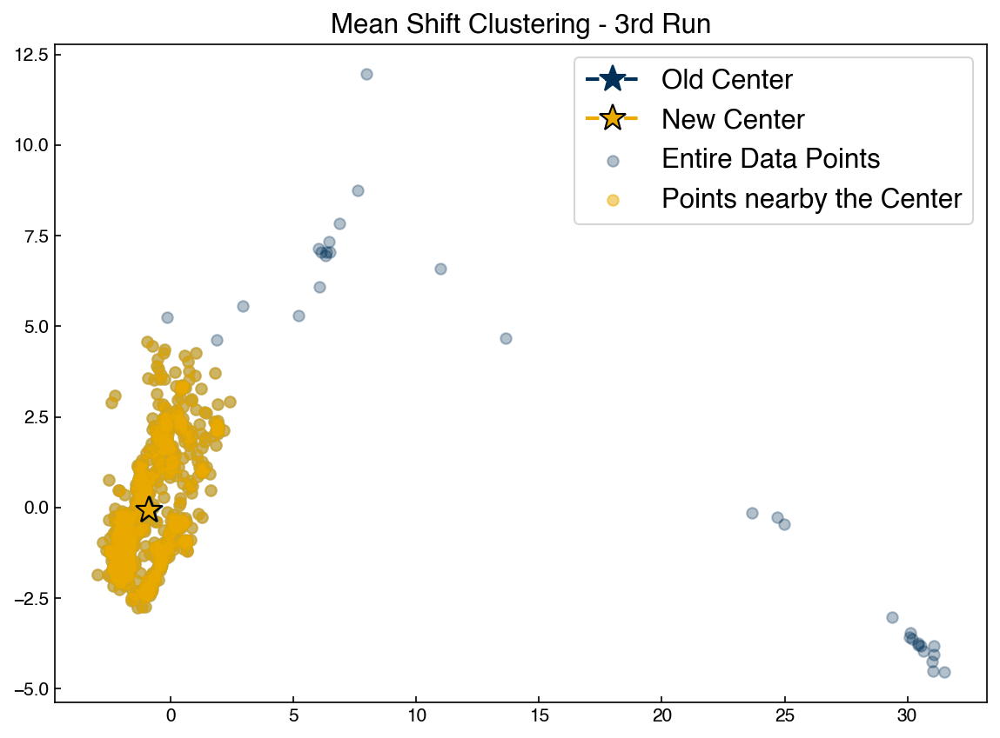

In [27]:
nearby = get_nearby_points(guess, X, r)
nearby = np.array(nearby)
new = get_new_centroid(guess, X, r)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(nearby[:, 0], nearby[:, 1], color = clrs[1], alpha = 0.5)
ax.plot(guess[0], guess[1], marker = '*', color = clrs[0], markersize = 15)
ax.plot(new[0], new[1], marker='*', color = clrs[1], markersize = 15, mec = 'k')

ax.set_title('Mean Shift Clustering - 3rd Run')
ax.legend(['Old Center', 'New Center', 'Entire Data Points', 'Points nearby the Center'])

guess = new

Re-run the block above to watch the point converge. You can play with the initial guess to see how it changes things.

### Discussion: What happens if the initial guess is very far away from a cluster?

> There will be no points within the radius (or `bandwidth`) and this algorithm is not going to work. Change the initial guess to [10, 0] and rerun the algorithm. You will notice that the `nearby` list is empty.

We see that the mean shift algorithm causes an initial guess for a centroid to move toward a point of higher density. However, it isn't clear exactly how to get initial guesses. If we choose random points then some will have no points around them and not move. It also isn't clear how to decide how many initial guess points we should use.

The solution to this is to use each point of the dataset as an initial guess!

In [28]:
centroids = X

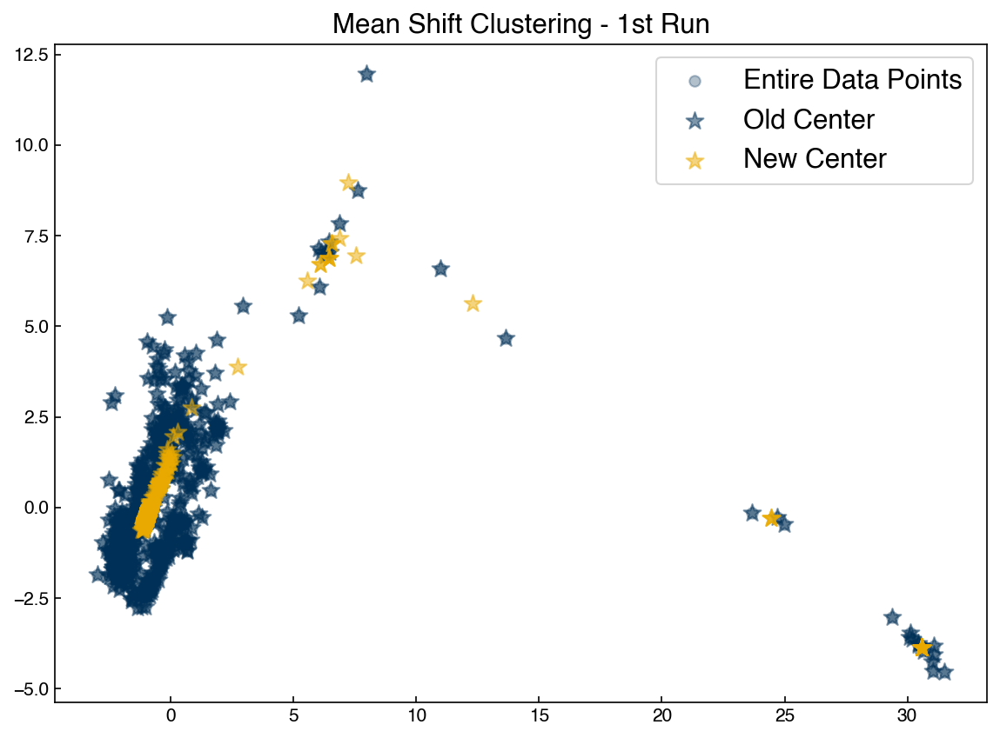

In [29]:
def mean_shift_iteration(x_list, r):
    centroids = []
    for centroid in x_list:
        new = get_new_centroid(centroid, x_list, r)
        centroids.append(new)
    return centroids

new_centroids = mean_shift_iteration(centroids, r)

news = np.array(new_centroids)
olds = np.array(centroids)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(olds[:, 0], olds[:, 1], color = clrs[0], marker = '*', alpha = 0.5, s = 100)
ax.scatter(news[:, 0], news[:, 1], color = clrs[1], marker = '*', alpha = 0.5, s = 100)

ax.set_title('Mean Shift Clustering - 1st Run')
ax.legend(['Entire Data Points', 'Old Center', 'New Center'])

centroids = new_centroids

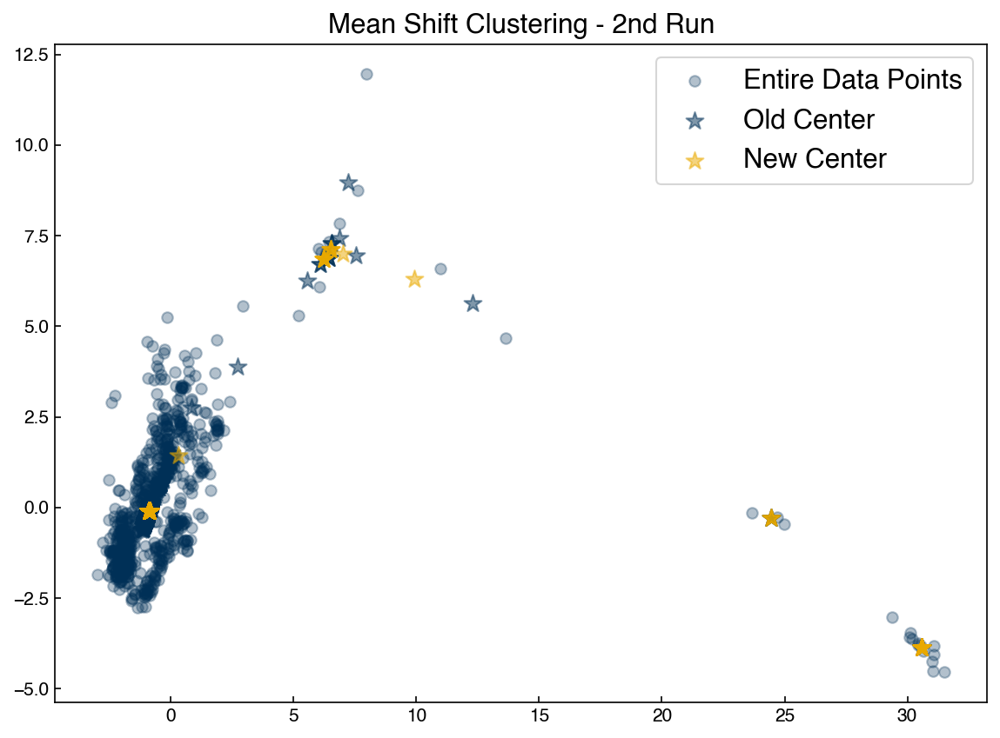

In [30]:
new_centroids = mean_shift_iteration(centroids, r)

news = np.array(new_centroids)
olds = np.array(centroids)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(olds[:, 0], olds[:, 1], color = clrs[0], marker = '*', alpha = 0.5, s = 100)
ax.scatter(news[:, 0], news[:, 1], color = clrs[1], marker = '*', alpha = 0.5, s = 100)

ax.set_title('Mean Shift Clustering - 2nd Run')
ax.legend(['Entire Data Points', 'Old Center', 'New Center'])

centroids = new_centroids

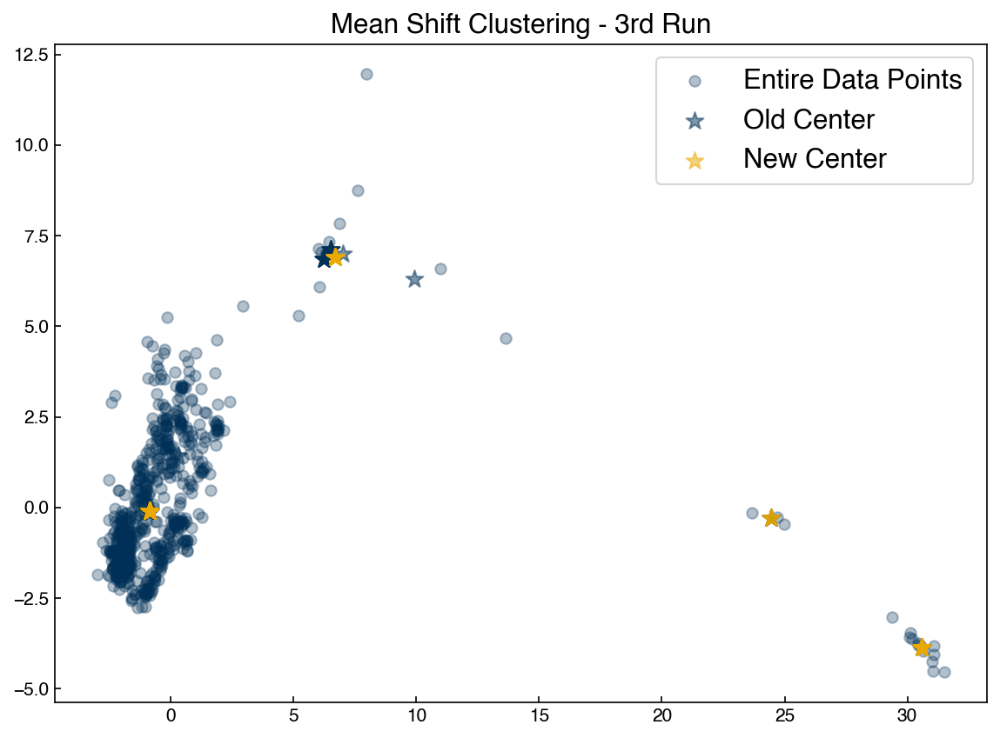

In [31]:
new_centroids = mean_shift_iteration(centroids, r)

news = np.array(new_centroids)
olds = np.array(centroids)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], color = clrs[0], alpha = 0.3)
ax.scatter(olds[:, 0], olds[:, 1], color = clrs[0], marker = '*', alpha = 0.5, s = 100)
ax.scatter(news[:, 0], news[:, 1], color = clrs[1], marker = '*', alpha = 0.5, s = 100)

ax.set_title('Mean Shift Clustering - 3rd Run')
ax.legend(['Entire Data Points', 'Old Center', 'New Center'])

centroids = new_centroids

To complete the algorithm we just need to iterate until the new centrods are the same as the old centroids, and assign points to the nearest centroid:

Working: delta = 137.41
Working: delta = 65.42
Working: delta = 4.03
CPU times: user 13.6 s, sys: 83 ms, total: 13.7 s
Wall time: 13.7 s


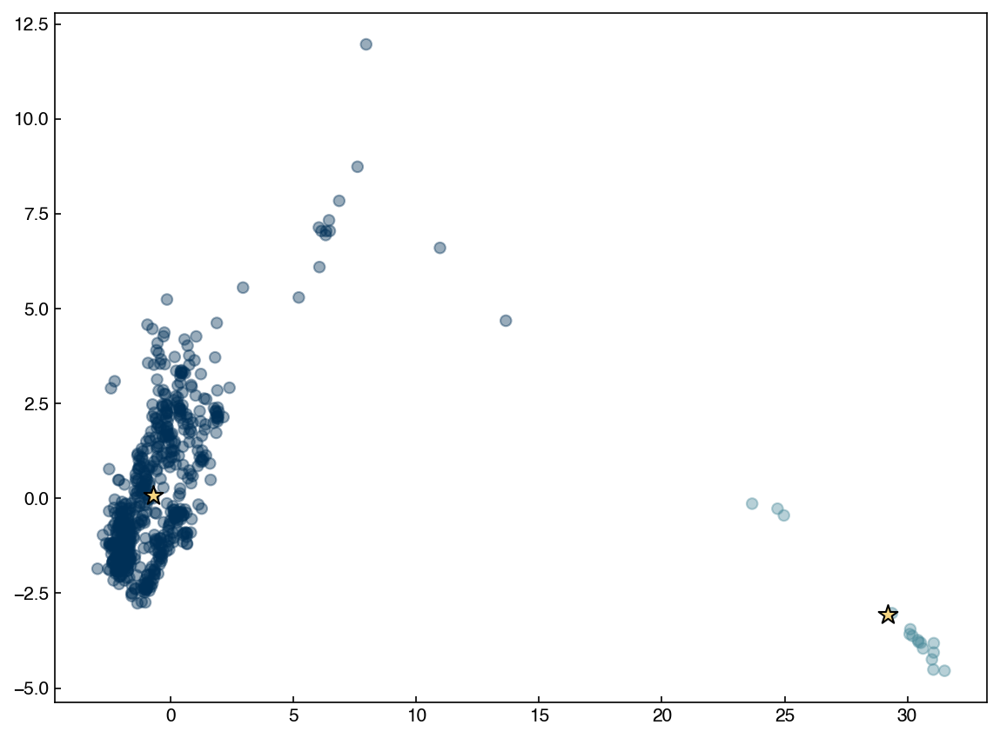

In [32]:
def mean_shift_clustering(x_list, r, tolerance = 0.01):
    # tolerance will define when new and old centroids are the same.
    old_centroids = np.array(x_list)
    new_centroids = np.zeros(x_list.shape)
    delta = np.linalg.norm(old_centroids - new_centroids)
    while delta >= tolerance:
        print('Working: delta = {:.2f}'.format(delta))
        new_centroids = mean_shift_iteration(old_centroids, r)
        delta = np.linalg.norm(old_centroids - new_centroids)
        old_centroids = np.array(new_centroids)
        
    unique_centroids = []
    for centroid in new_centroids:
        unique = True
        for uc in unique_centroids:
            if np.linalg.norm(uc - centroid) <= tolerance:
                unique = False
        if unique == True:
            unique_centroids.append(centroid)
            
    labels = []
    for pt in x_list:
        min_dist = 1e99
        for j, centroid in enumerate(unique_centroids):
            if get_distance(pt,centroid) < min_dist:
                label = j
                min_dist = get_distance(pt,centroid)
        labels.append(label)
            
    return labels, np.array(unique_centroids)

r = 15
%time labels, centroids = mean_shift_clustering(X, r)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], c = clrs[np.array(labels) * 2], alpha = 0.4)
ax.scatter(centroids[:, 0], centroids[:, 1], marker = '*', s = 120, color = clrs[7], edgecolors = 'k');

### Discussion: How can we modify the algorithm to find more clusters?

> In mean shift algorithm, the number of clusters is implicitly defined by the radius of window. To find more clusters, the radius should be smaller so that we get more clusters with smaller sizes.

Let's compare our mean shift algorithm to the one from `scikit-learn`

CPU times: user 10.7 s, sys: 185 ms, total: 10.9 s
Wall time: 11 s


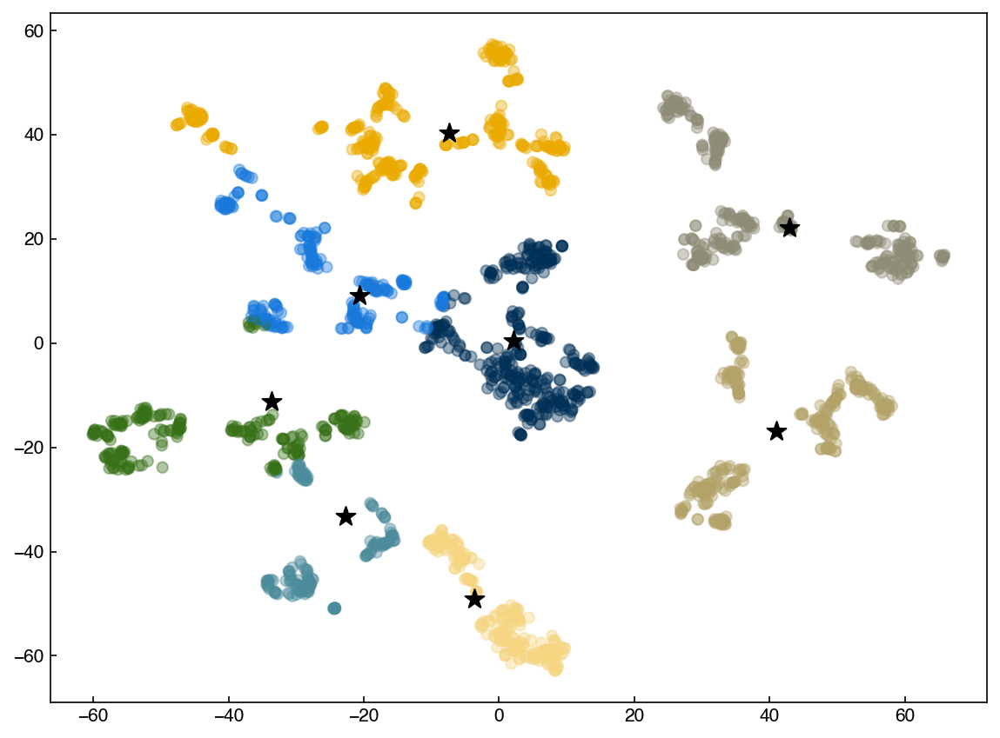

In [33]:
from sklearn.cluster import MeanShift

model = MeanShift(bandwidth = 21)
%time model.fit(X_tsne)
labels = model.labels_
centroids = model.cluster_centers_

fig, ax = plt.subplots()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c = clrs[labels], alpha = 0.4)
ax.scatter(centroids[:, 0], centroids[:, 1], marker = '*', s = 120, color = 'k');

We see that the results are the same, but `scikit-learn` is much faster. One note is that `scikit-learn` uses some slightly different techniques to speed things up, so `bandwidth` is not the same as `radius`. However, the results are generally similar and the concept is the same.

### Exercise: Plot the silhouette score as a function of bandwidth for the mean shift algorithm

Use the `scikit-learn` implementation and vary the bandwidth in the range [0.1, 1, 5, 10, 20]. Use the PCA decomposition of the Dow dataset.

### DBSCAN

The DBSCAN algorithm also uses a local sliding window similar to mean shift, but instead of defining clusters by centroids it defines the cluster by whether or not a point falls within the sliding window. We will not go through the algorithm in detail, but the general steps are:

1) Start with a random point and find its neigbhors within distance $r$.

2) If there are a sufficient number of neigbhors (defined by a minimum points argument) then the clustering process starts. If not then the point is labeled as noise and a new point is selected until the clustering process starts.

3) The neighbors within a distance $r$ are added to the cluster.

4) The nearest neighbor is selected as the next point, and the same process is repeated until all points within distance $r$ of any point within a cluster are defined as being part of that cluster.

5) Once a cluster has finished, a new point is selected and a new cluster is started. The process is repeated until all points have been assigned to a cluster or labeled as noise.

The key hyperparameters are:
- **r**: the radius to include in a cluster
- **min_samples**: the minimum number of samples within a radius of $\epsilon$ such that a point is not considered noise.
    
The following animation illustrates how the DBSCAN algorithm works:

<img src="images/DBSCAN.gif" width="500">

The main advantage of DBSCAN is that it can find clusters defined by highly non-linear boundaries, unlike k-means, mean shift, or even GMM's. Let's see how the `scikit-learn` implementation works:

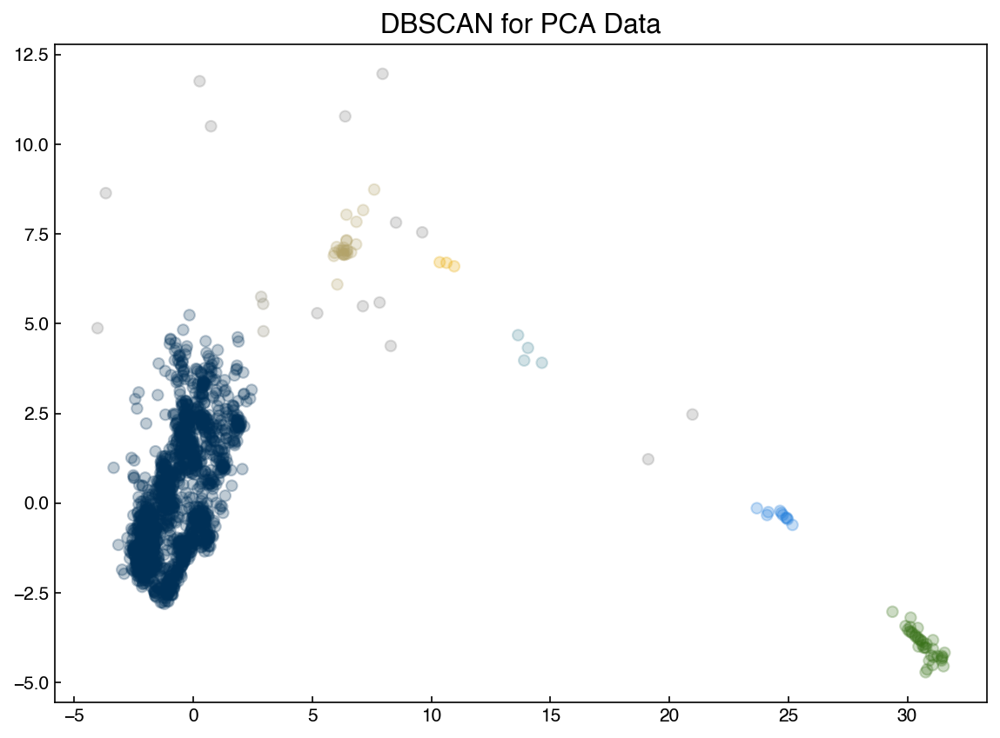

In [34]:
from sklearn.cluster import DBSCAN

X = X_pca

model = DBSCAN(eps = 1, min_samples = 3)
y_predict = model.fit_predict(X)

fig, ax = plt.subplots()
ax.scatter(X[:, 0], X[:, 1], c = clrs[y_predict], alpha=0.25)
ax.set_title('DBSCAN for PCA Data');

Note that the clustering can be very sensitive to the hyperparameters! These hyperparameters will be related to the density of points, so you may be able to get a good guess based on intuition about the data or by looking at the data. However, some tuning is nearly always necessary.

It is also not possible to predict the cluster of a new point with DBSCAN, which can be a major weakness. One potential solution is to use the DBSCAN output as "classes" and train a classification model, though this adds complexity and the classification model may not be accurate.

## Hierarchical models

The final type of clustering we will discuss are "hierarchical" models. These models construct linkages between different points and use distance cutoffs to assign clusters. Examining the hierarchy of points is a useful way to get insight into the structure of a high-dimensional dataset without dimensional reduction. The downside is that it can be rather slow, since the algorithms scale as $N^3$. However, for the relatively small sizes of datasets typically encountered in engineering it is usually feasible to construct these hierarchies.

### Dendrograms

A "dendrogram" is a graphical representation of the distances between different points in some high-dimensional space. One intuitive but qualitative example of a dendrogram are the [species trees](https://www.instituteofcaninebiology.org/how-to-read-a-dendrogram.html) commonly used in biology:

<img src="images/bio_dendrogram.png" width="500">

We can see that it is possible to create different "clusters" of species based on different defining characteristics. By choosing more or less specific "cutoffs" we could create a few large clusters or many small clusters. The idea is similar for data sets. Let's see how it looks for some of our examples.

In [35]:
from scipy.cluster.hierarchy import linkage, dendrogram

X = X_pca

Z = linkage(X, method='single')

Lets take a closer look at the "linkage" output:

In [36]:
print('X shape: {}'.format(X.shape))
print('Z shape: {}'.format(Z.shape))
print('Z[0]:', Z[0])

X shape: (2060, 2)
Z shape: (2059, 4)
Z[0]: [6.77000000e+02 6.91000000e+02 9.83256746e-04 2.00000000e+00]


The "linkage" output has 4 members. Each entry corresponds to the formation of a new cluster from smaller clusters, hence there are (n-1) entries (since the first entry involves 2 points, and each iteration adds one more point).

* the first two entries are the index of the two points/clusters that are being combined (point 677 and 691)
* the third entry is the distance between these clusters (0.00098)
* the fourth entry is the total number of points in the new cluster (2 in this case)

Note that we passed a "method" argument into the linkage. This describes the method that is used to calculate the distance between two clusters that have multiple points. There are more details available [here](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage), but a very qualitative descripton of some of the options:

* `single`: take the minimum distance between any two points in the two clusters
* `complete`: take the maximum distance between any two points in the two clusters
* `average`: use an average of distances between points in the two clusters
* `weighted`: weight distances differently between the agglomerated cluster and one being added
* `centriod`: use the distance between cluster centroids
* `ward`: use the distance that minimizes the variance between the clusters

So, which one should we choose? This is where we can use the "cophenetic coefficient", which measures the ratio of the distance in "linkage" space to the distance in the high-dimensional space.

In [37]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

Dij = pdist(X, metric = 'euclidean')
for method in ['single', 'complete', 'average', 'weighted', 'centroid', 'ward']:
    Z = linkage(X, method = method)
    C, coph_dists = cophenet(Z, Dij)
    print('cophenetic coefficient of {}: {}'.format(method, C))

cophenetic coefficient of single: 0.9549424125877355
cophenetic coefficient of complete: 0.9332039766375549
cophenetic coefficient of average: 0.9781265675460892
cophenetic coefficient of weighted: 0.9568082912812889
cophenetic coefficient of centroid: 0.9786287346144893
cophenetic coefficient of ward: 0.8212908347506772


The `dendrogram` function is a visual representation of this "linkage" structure. The "color threshold" tells the dendrogram a distance (y-axis value) below which to identify separate branches of the dendrogram as different colors.

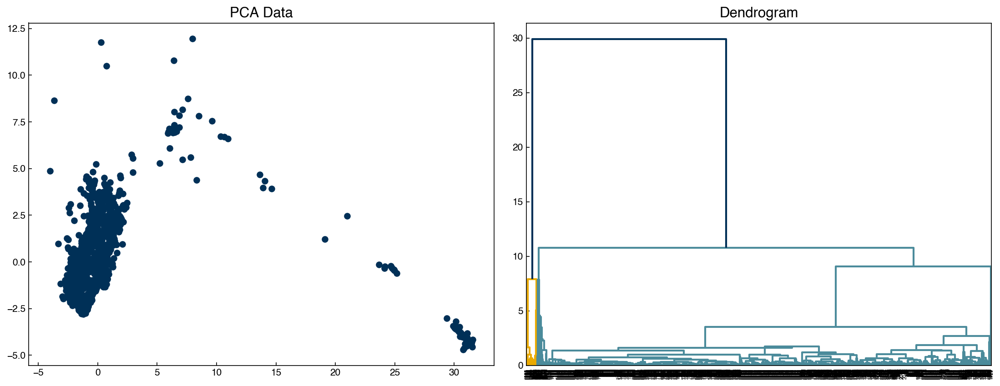

In [38]:
fig, axes = plt.subplots(1, 2, figsize = (15, 6))
Z = linkage(X, method = 'centroid')
dendrogram(Z, color_threshold = 20, ax = axes[1])
axes[0].scatter(X[:, 0], X[:, 1])
axes[0].set_title('PCA Data')
axes[1].set_title('Dendrogram');

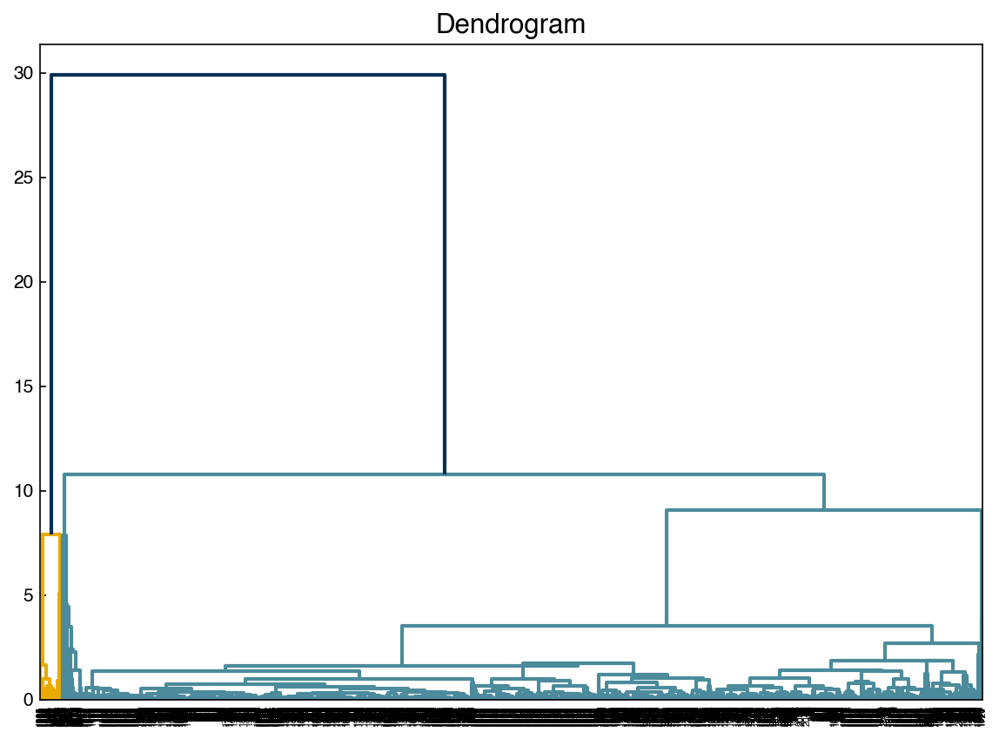

In [39]:
fig, ax = plt.subplots()
dendrogram(Z, color_threshold = 20, ax = ax)
ax.set_title('Dendrogram');

Sometimes it is easier to not show every single datapoint, and truncate the dendrogram:

[7.58000000e+02 1.93700000e+03 6.38691346e-03 2.00000000e+00]


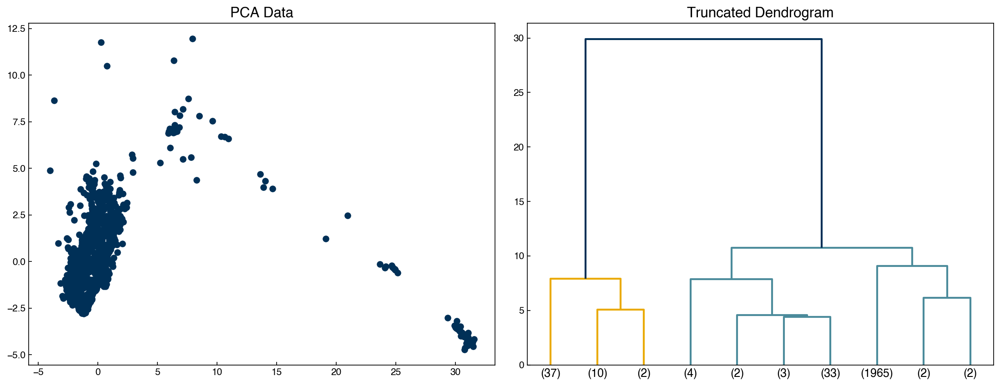

In [40]:
fig, axes = plt.subplots(1, 2, figsize = (15, 6))
dendrogram(Z, color_threshold = 20, truncate_mode = 'lastp', p = 10, ax = axes[1])
axes[0].scatter(X[:, 0], X[:, 1])
axes[0].set_title('PCA Data')
axes[1].set_title('Truncated Dendrogram');
print(Z[37])

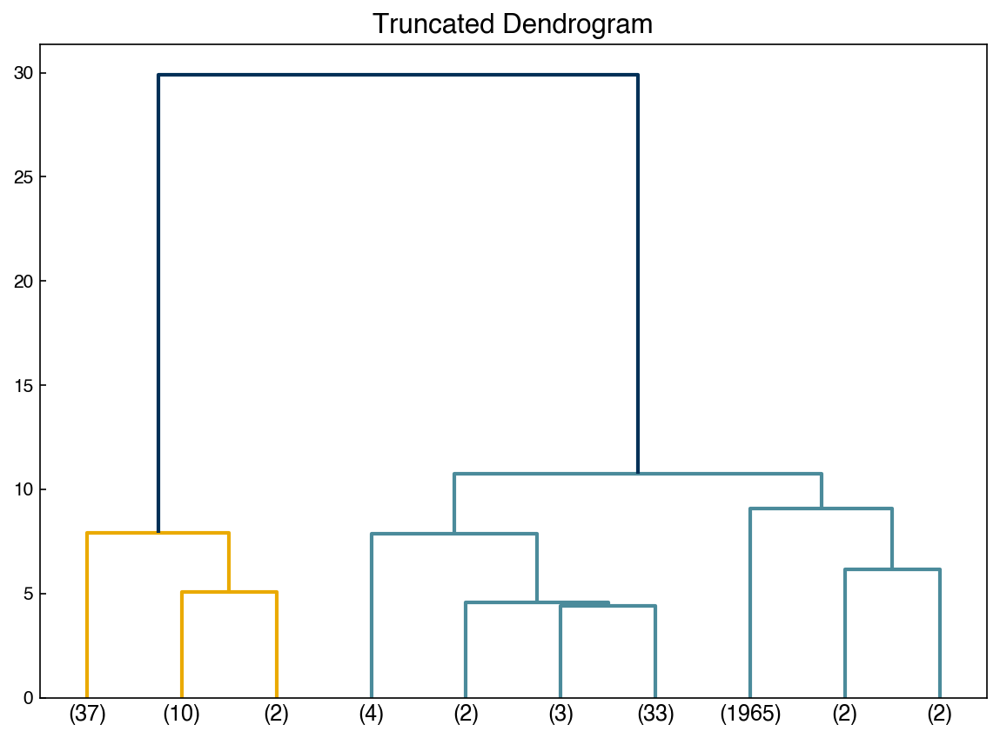

In [41]:
fig, ax = plt.subplots()
dendrogram(Z, color_threshold = 20, truncate_mode = 'lastp', p = 10, ax = ax)
ax.set_title('Truncated Dendrogram');

### Agglomerative hierarchical clustering

Agglomerative clustering is easy to understand once the "linkage" structure makes sense. The number of clusters can be defined either explicitly (move up the tree until there are 'k' clusters) or implicitly (provide a linkage distance that defines separate clusters).

The following animations illustrates this nicely:

<img src="images/agglomerative.gif" width="700">

The mechanics of doing this can be a little tricky, but luckily there are built-in functions to help:

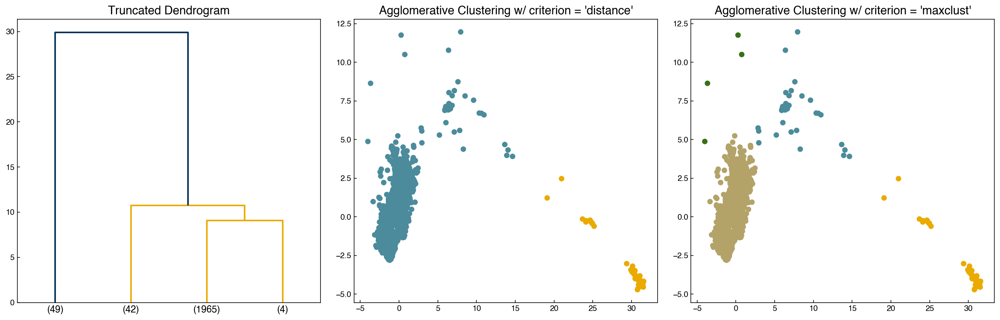

In [42]:
from scipy.cluster.hierarchy import fcluster

max_d = 20
k = 4

clusters_dist = fcluster(Z, max_d, criterion = 'distance')
clusters_k = fcluster(Z, k, criterion = 'maxclust')

fig, axes = plt.subplots(1, 3, figsize = (18, 6))
dendrogram(Z, color_threshold = max_d, truncate_mode = 'lastp', p = k, ax = axes[0])
axes[1].scatter(X[:, 0], X[:, 1], c = clrs[clusters_dist])
axes[2].scatter(X[:, 0], X[:, 1], c = clrs[clusters_k])

axes[0].set_title('Truncated Dendrogram')
axes[1].set_title("Agglomerative Clustering w/ criterion = 'distance'")
axes[2].set_title("Agglomerative Clustering w/ criterion = 'maxclust'");

There are options for determining the cutoffs automatically, but none of them are great! The most common is the inconsistency method, which monitors for "jumps" in the distance:

* $I = \frac{h-avg}{std}$
    - $h$: merge height of cluster (length in y-directon on dendrogram)
    - $avg$: average height of last $d$ merges
    - $std$: standard deviation of last $d$ merges
    
If $I >= t$ where t is a specified threshold then this will be used as the cutoff. Let's see how it performs:

Number of clusters: 5


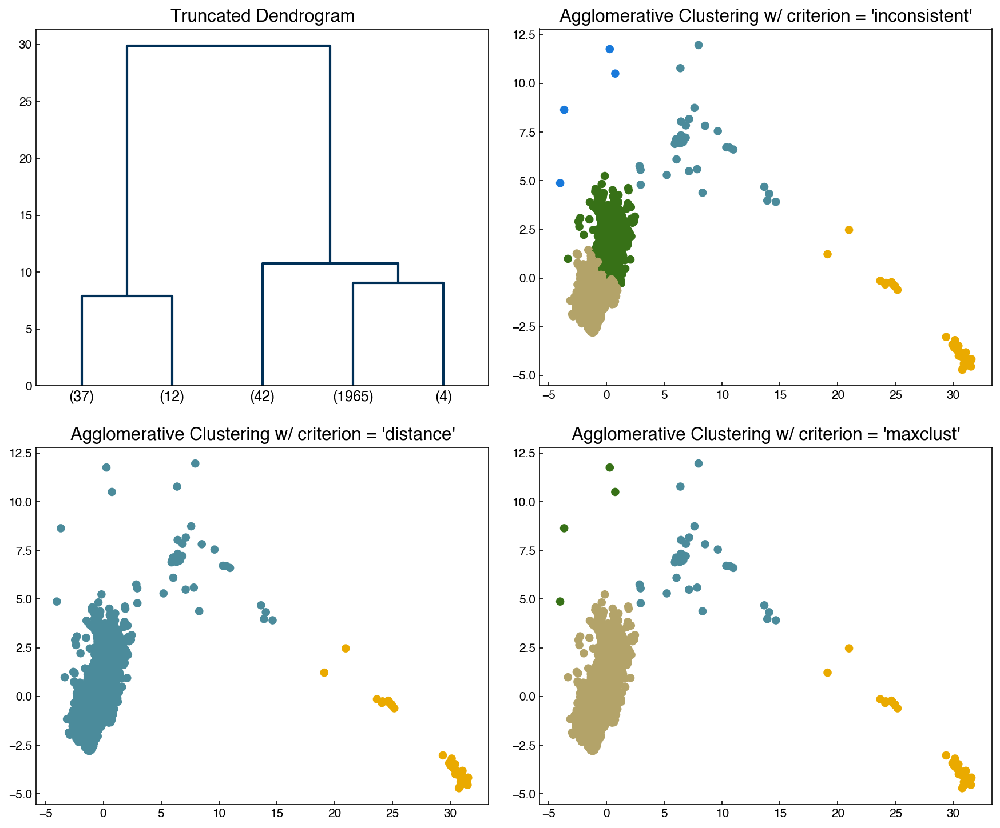

In [43]:
I_cutoff = 9
clusters_I = fcluster(Z, I_cutoff, criterion = 'inconsistent', depth = 10)
n_clusters = max(clusters_I)

fig, axes = plt.subplots(2, 2, figsize = (12, 10))
axes = axes.ravel()
dendrogram(Z, color_threshold = 3, truncate_mode = 'lastp', p = int(n_clusters), ax = axes[0])
axes[1].scatter(X[:, 0], X[:, 1], c = clrs[clusters_I])
axes[2].scatter(X[:, 0], X[:, 1], c = clrs[clusters_dist])
axes[3].scatter(X[:, 0], X[:, 1], c = clrs[clusters_k])

axes[0].set_title('Truncated Dendrogram')
axes[1].set_title("Agglomerative Clustering w/ criterion = 'inconsistent'");
axes[2].set_title("Agglomerative Clustering w/ criterion = 'distance'")
axes[3].set_title("Agglomerative Clustering w/ criterion = 'maxclust'")

print('Number of clusters:', n_clusters)

In practice it is typically best to use some visualization strategy in conjunction with manual and/or automatic strategies to determine a cutoff that makes intuitive sense.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Generative-Model-Overview" data-toc-modified-id="Generative-Model-Overview-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Generative Model Overview</a></span></li><li><span><a href="#Normal-Distribution" data-toc-modified-id="Normal-Distribution-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Normal Distribution</a></span></li><li><span><a href="#Gaussian-Mixture-Models" data-toc-modified-id="Gaussian-Mixture-Models-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Gaussian Mixture Models</a></span><ul class="toc-item"><li><span><a href="#Bayesian-Information-Criterion" data-toc-modified-id="Bayesian-Information-Criterion-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Bayesian Information Criterion</a></span></li></ul></li><li><span><a href="#Generative-Models-in-High-Dimensions" data-toc-modified-id="Generative-Models-in-High-Dimensions-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Generative Models in High Dimensions</a></span><ul class="toc-item"><li><span><a href="#Exercise:-Create-a-GMM-that-can-generate-new-examples-of-the-digit-6" data-toc-modified-id="Exercise:-Create-a-GMM-that-can-generate-new-examples-of-the-digit-6-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Exercise: Create a GMM that can generate new examples of the digit 6</a></span></li></ul></li><li><span><a href="#Kernel-Density-Estimation" data-toc-modified-id="Kernel-Density-Estimation-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Kernel Density Estimation</a></span><ul class="toc-item"><li><span><a href="#KDE-vs.-Histograms" data-toc-modified-id="KDE-vs.-Histograms-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>KDE vs. Histograms</a></span></li><li><span><a href="#KDE-in-high-dimensions" data-toc-modified-id="KDE-in-high-dimensions-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>KDE in high dimensions</a></span></li></ul></li></ul></div>

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('../settings/plot_style.mplstyle')

In [2]:
import numpy as np
import pandas as pd

clrs = np.array(['#003057', '#EAAA00', '#4B8B9B', '#B3A369', '#377117', '#1879DB', '#8E8B76', '#F5D580', '#002233', '#808080'])

# Generative Models

Generative models describe the probability distribution of the underlying data. They can be used to explore datasets in many different ways, and are **unsupervised** since they do not require labels for the output data.

## Generative Model Overview

Generative models provide an estimate of the probability of finding data at a particular point in feature space. Written mathematically:

$P(data|features)$

These models can then be used to generate synthetic data that mimics the input data by sampling the probability distribution.

Some uses of generative models:

* augment sparse/imbalanced datasets
* refine supervised models
* visualize data distributions

## Normal Distribution

The 1-dimensional normal distribution is the simplest case of a generative model. We have worked with the Gaussian distribution a lot, but here we will import a different implementation from the `scipy.stats` package:

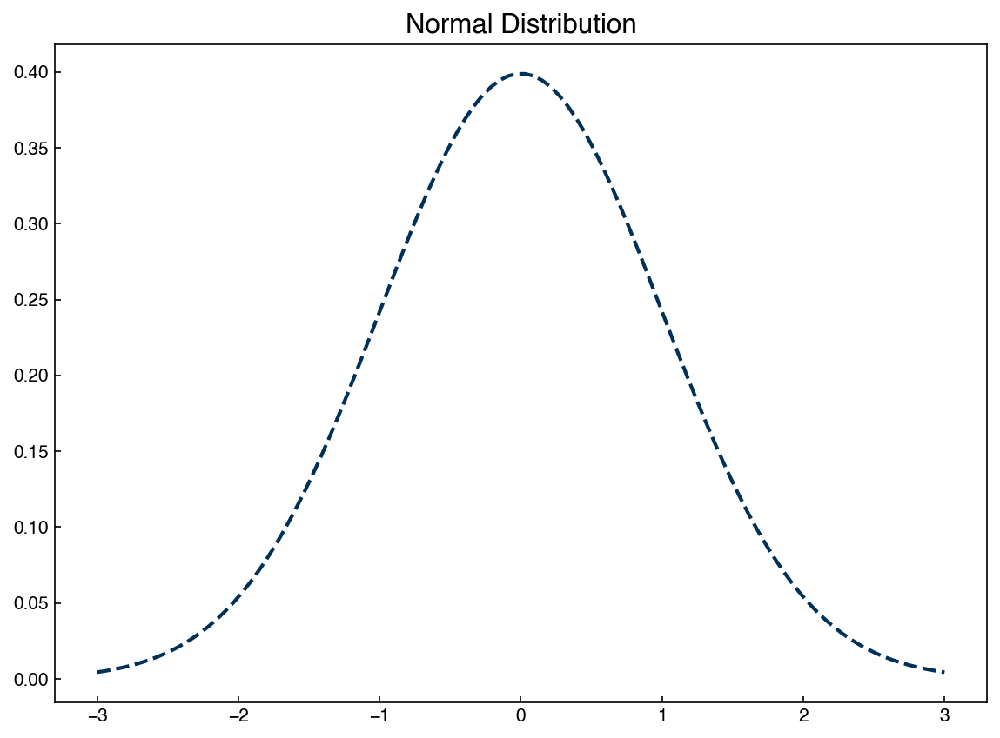

In [3]:
import pandas as pd
from scipy.stats import norm

mu = 0
variance = 1
sigma = np.sqrt(variance)
x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)
gauss = norm.pdf(x, mu, sigma)
fig, ax = plt.subplots()
ax.plot(x, gauss)
ax.set_title('Normal Distribution');

We are now extracting the `pdf`, or "probability density function" from the `norm` package rather than writing it out explicitly. However, this is exactly the same Gaussian distribution we have seen many times.

We can now use the `norm` function to generate new samples from this distribution:

(100000,)


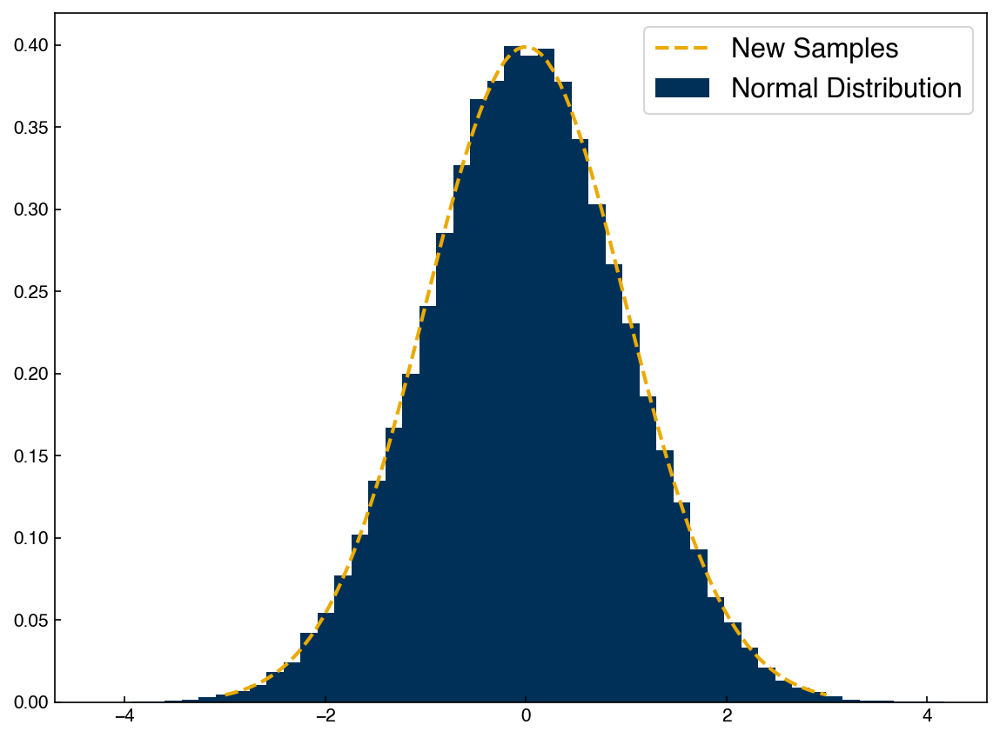

In [4]:
X_new = norm.rvs(mu, sigma, size = 100000)
print(X_new.shape)
fig, ax = plt.subplots()
ax.hist(X_new, density = True, bins = 50)
ax.plot(x, norm.pdf(x, mu, sigma))
ax.legend(['New Samples', 'Normal Distribution']);

This is a "generative" model because we can generate new data points once we know the parameters of the distribution. In practice, we will see that generative models are almost always composed of combinations of different Gaussian distributions, so the same basic machinery (sampling a normal distribution) can be used even for more complex models.

Let's take a look at the Dow dataset and see if we can create a generative model for one of the features.

In [5]:
df = pd.read_excel('data/impurity_dataset-training.xlsx')

def is_real_and_finite(x):
    if not np.isreal(x):
        return False
    elif not np.isfinite(x):
        return False
    else:
        return True

all_data = df[df.columns[1:]].values #drop the first column (date)
numeric_map = df[df.columns[1:]].applymap(is_real_and_finite)
real_rows = numeric_map.all(axis = 1).copy().values #True if all values in a row are real numbers
X_dow = np.array(all_data[real_rows, :-5], dtype = 'float') #drop the last 5 cols that are not inputs
y_dow = np.array(all_data[real_rows, -3], dtype = 'float')
y_dow = y_dow.reshape(-1, 1)
print(X_dow.shape, y_dow.shape)

(10297, 40) (10297, 1)


We can select one of the features and check the histogram:

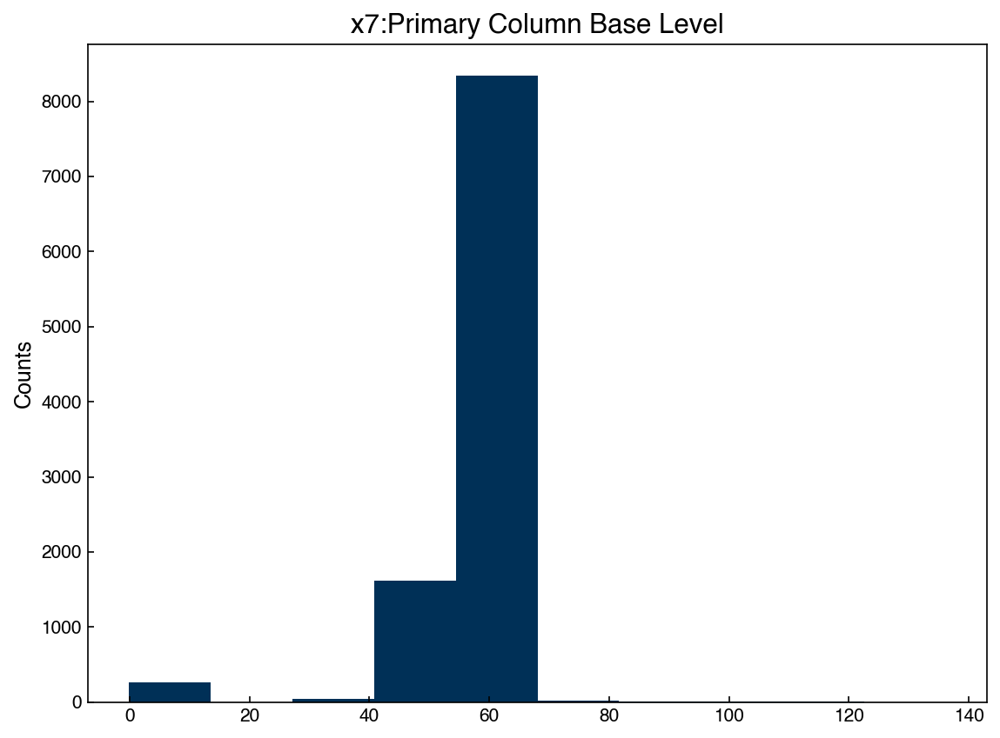

In [6]:
feature = 6
x_1d = X_dow[:, feature]

fig, ax = plt.subplots()
ax.hist(x_1d)
ax.set_title('{}'.format(df.columns[7]))
ax.set_ylabel('Counts');

Now we can easily create a generative model by assuming this data is Gaussian. We just need to compute the mean and standard deviation, then we can create new synthetic data points and compare:

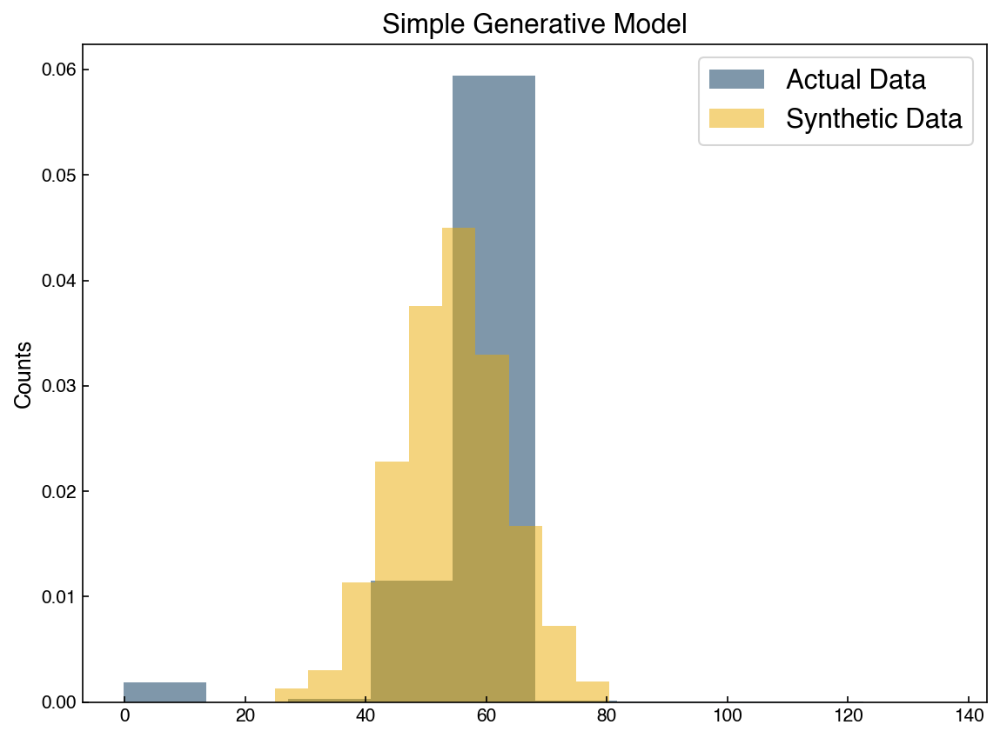

In [7]:
mu = x_1d.mean()
std = x_1d.std()

x_synthetic = norm.rvs(mu, std, size = 1000)

fig, ax = plt.subplots()
ax.hist(x_1d,density = True, alpha = 0.5)
ax.hist(x_synthetic,density = True, alpha = 0.5)
ax.set_title('Simple Generative Model')
ax.set_ylabel('Counts')
ax.legend(['Actual Data', 'Synthetic Data']);

We can see that the distributions are similar, but don't exactly match. This is because the original data was not really normally distributed. This is also only a single feature, but the actual dataset has 40 features, so we really aren't generating a new datapoint.

## Gaussian Mixture Models

We can move beyond 1-dimensional normal distributions using GMM's. Let's take a look at the distribution of 2 features at once:

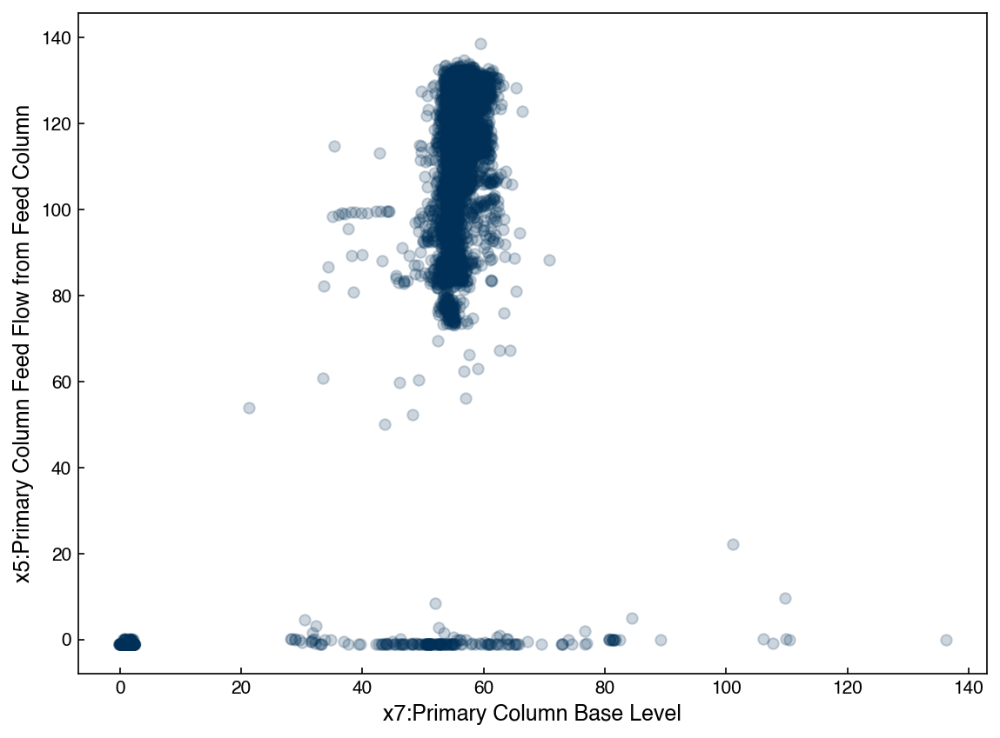

In [8]:
feature_A = 6
feature_B = 4
X_2d = X_dow[:, [feature_A, feature_B]]

fig,ax = plt.subplots()
ax.scatter(X_2d[:, 0], X_2d[:, 1], alpha = 0.2)

ax.set_xlabel('{}'.format(df.columns[7]))
ax.set_ylabel('{}'.format(df.columns[5]));

We can see that this is very far from being a Gaussian distribution. However, we can still model it with a GMM.

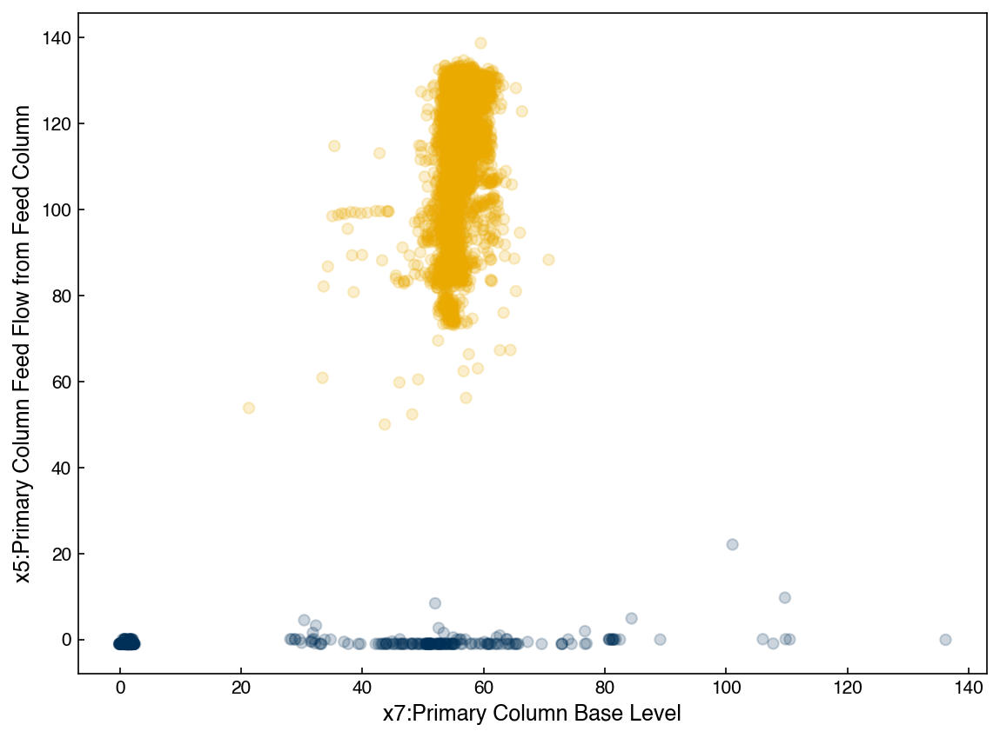

In [9]:
from sklearn.mixture import GaussianMixture

N_clusters = 2
gmm = GaussianMixture(n_components = N_clusters, covariance_type = 'full', random_state = 0)
gmm.fit(X_2d)
y_2d = gmm.predict(X_2d)

fig,ax = plt.subplots()
ax.scatter(X_2d[:, 0], X_2d[:, 1], alpha = 0.2, c = clrs[y_2d])

ax.set_xlabel('{}'.format(df.columns[7]))
ax.set_ylabel('{}'.format(df.columns[5]));

We can see that the model has now identified 2 different clusters. However, we can also think of this as one single probability distribution. To visualize this we will use some helper functions modified from the [Python Data Science Handbook](https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb). You do *not* need to understand how these work, just realize they allow us to plot the GMM distribution in 2d.

In [10]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax = None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, angle, **kwargs))
        
def plot_gmm(gmm, X, label = True, ax = None):
    if ax is None:
        fig, ax = plt.subplots()
        
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c = clrs[labels], s = 40, zorder=0)
    else:
        ax.scatter(X[:, 0], X[:, 1], s = 40, zorder = 0)
    ax.axis('equal')
    
    w_factor = 0.5
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, ax = ax, alpha = w_factor)
    return ax

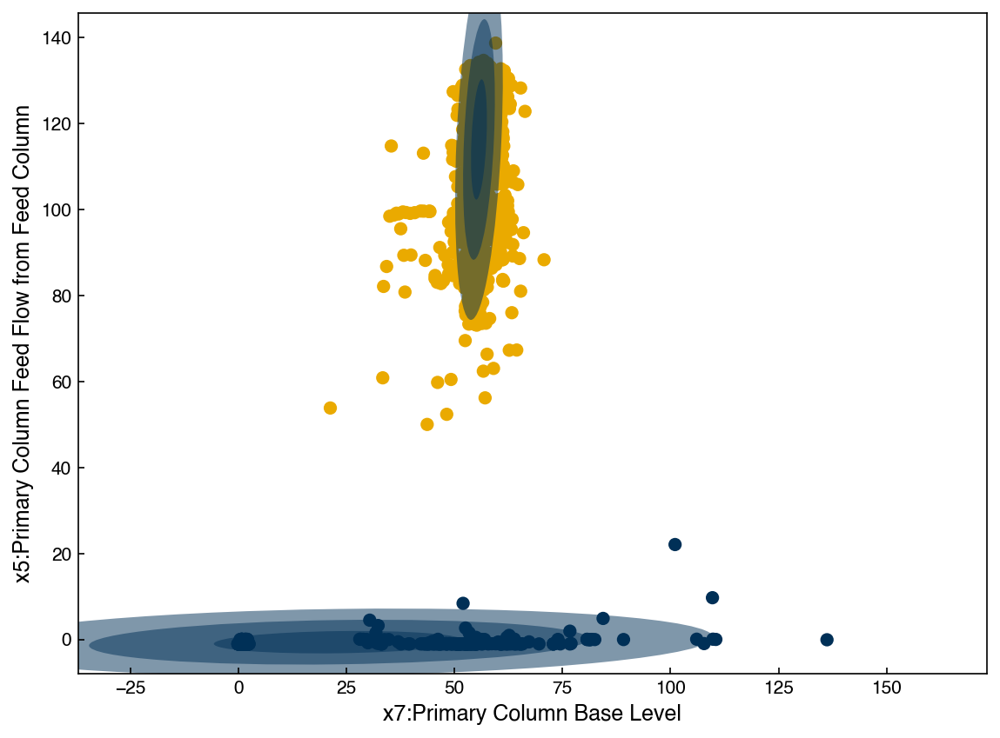

In [11]:
ax = plot_gmm(gmm, X_2d)
ax.set_xlabel('{}'.format(df.columns[7]))
ax.set_ylabel('{}'.format(df.columns[5]));

We see that with 2 Gaussians the distribution does not seem to match the data well. However, if we keep increasing the number of Gaussians the agreement will get much better: 

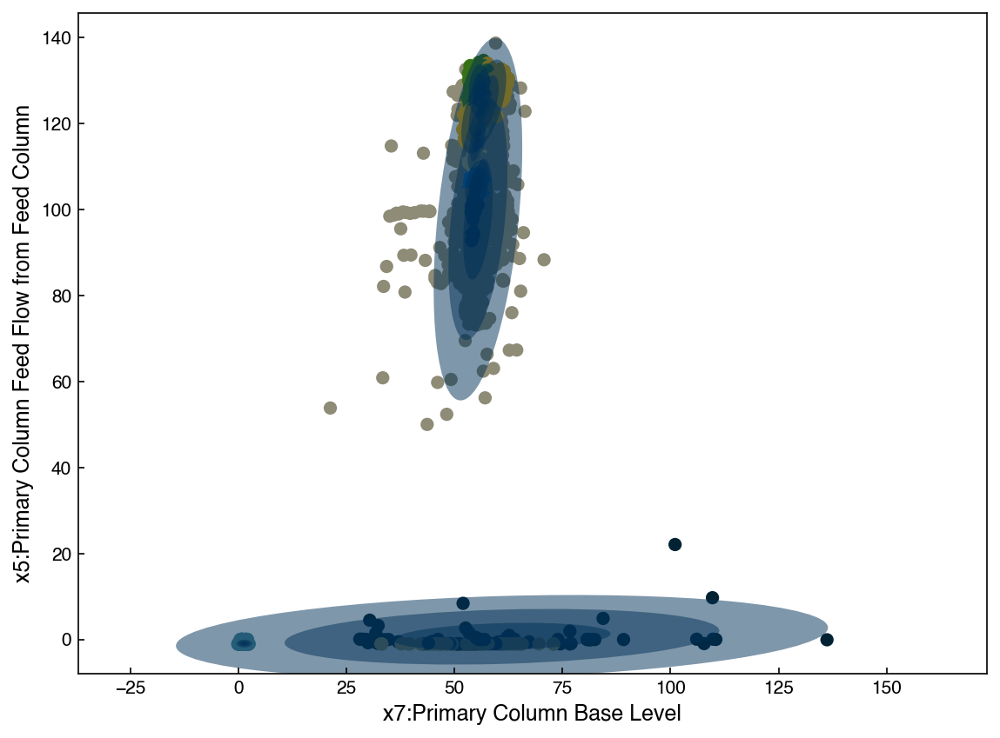

In [12]:
N_clusters = 9
gmm = GaussianMixture(n_components = N_clusters, covariance_type = 'full', random_state = 0)

ax = plot_gmm(gmm, X_2d)

ax.set_xlabel('{}'.format(df.columns[7]))
ax.set_ylabel('{}'.format(df.columns[5]));

The GMM model has a built-in feature that makes it easy to draw new samples. Let's create a synthetic dataset and compare it:

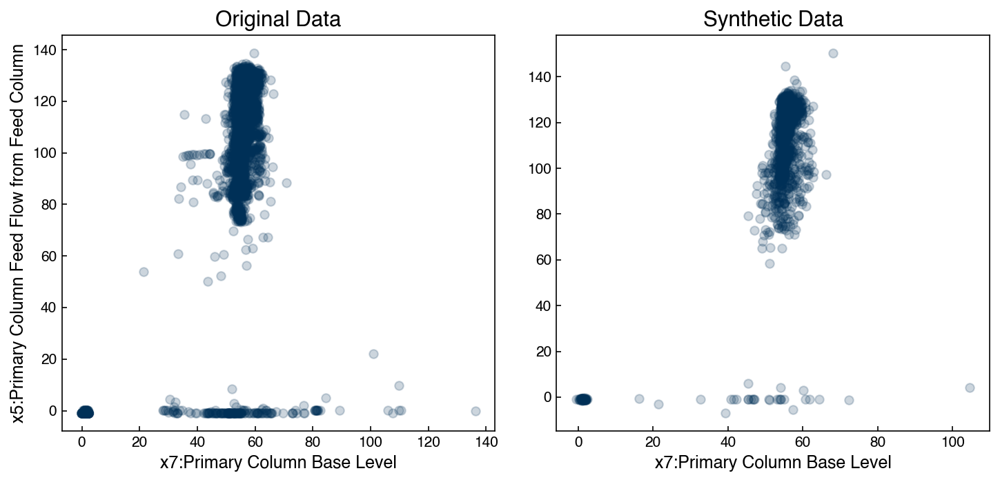

In [13]:
X_new, y_new = gmm.sample(2000)

fig, axes = plt.subplots(1, 2, figsize = (10, 5))
axes[0].scatter(X_2d[:, 0], X_2d[:, 1], alpha = 0.2)
axes[0].set_title('Original Data')
axes[1].scatter(X_new[:, 0], X_new[:, 1], alpha = 0.2)
axes[1].set_title('Synthetic Data')

axes[0].set_xlabel('{}'.format(df.columns[7]))
axes[0].set_ylabel('{}'.format(df.columns[5]))

axes[1].set_xlabel('{}'.format(df.columns[7]));

They still aren't perfect, but the main features are clearly present. However, we could keep adding more Gaussians, and it isn't clear how many are too many.

### Bayesian Information Criterion

To determine the right number of Gaussians we can revisit the concept of the Bayesian Information Criterion. The formula is a little complex for GMM's, but fortunately it is built in. We can evaulate the BIC as a function of the number of clusters. 

In this case the formula for the BIC is:

The Bayesian information criterion (BIC) is defined as:

$BIC = \ln{(n)}*k - 2*\ln{(\hat{L})}$

where $(\hat{L})$ is the probability that the data drawn from the GMM comes from the same distribution as the underlying data. This is complex to calculate, and luckily it is already implemented in the `bic` method.

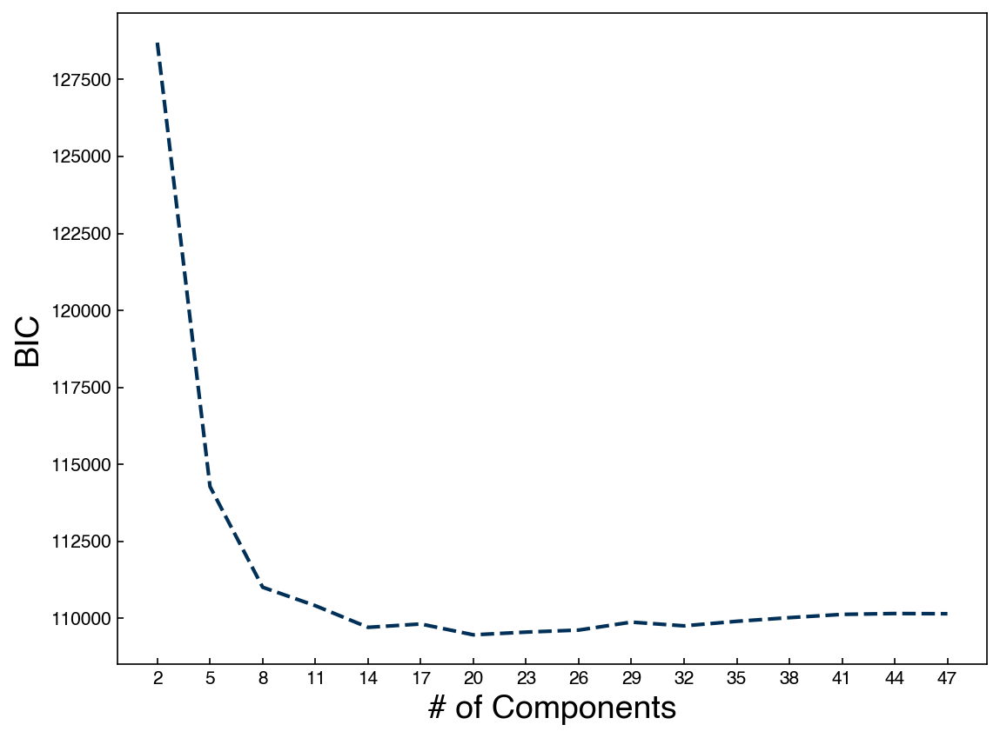

In [14]:
n_components = np.arange(2, 50)[::3]

BICs = []
for n in n_components:
    gmm_n =  GaussianMixture(n, covariance_type = 'full').fit(X_2d)
    bic = gmm_n.bic(X_2d)
    BICs.append(bic)
    
fig, ax = plt.subplots()
ax.plot(n_components, BICs)
ax.set_xlabel('# of Components', size = 18);
ax.set_ylabel('BIC', size = 18)
ax.set_xticks(n_components);

We see that the BIC is minimum around 20 components, so our 20-cluster model is the best approximation we can get with GMMs.

## Generative Models in High Dimensions

One issue with GMM's is that they do not scale well with the number of dimensions. This is particularly true if the full covariance matrix is optimized, since the covariance matrix has a number of parameters that scales with ~$\frac{1}{2}N_d^2$ where $N_d$ is the number of dimensions. Sometimes the "blessing of dimensionality" also helps, since data looks more like Gaussians as the number of dimensions increases, but this is not something we can count on.

One strategy to deal with this is to combine a GMM model with an invertible dimensionality reduction approach. For this example we will return to the MNIST dataset:

In [15]:
from sklearn.datasets import load_digits

digits = load_digits()
print("Digits data shape: {}".format(digits.data.shape))
print("Digits output shape: {}".format(digits.target.shape))
X_mnist = np.array(digits.data)
y_mnist = np.array(digits.target)

Digits data shape: (1797, 64)
Digits output shape: (1797,)


As before, we will use the `show_image` function:

In [16]:
def show_image(digit_data, n, ax = None):
    if ax is None:
        fig, ax = plt.subplots()
    img = digit_data[n].reshape(8, 8)
    ax.imshow(img, cmap = 'binary')    

First, let's try to find the optimal GMM for the high-dimensional space:

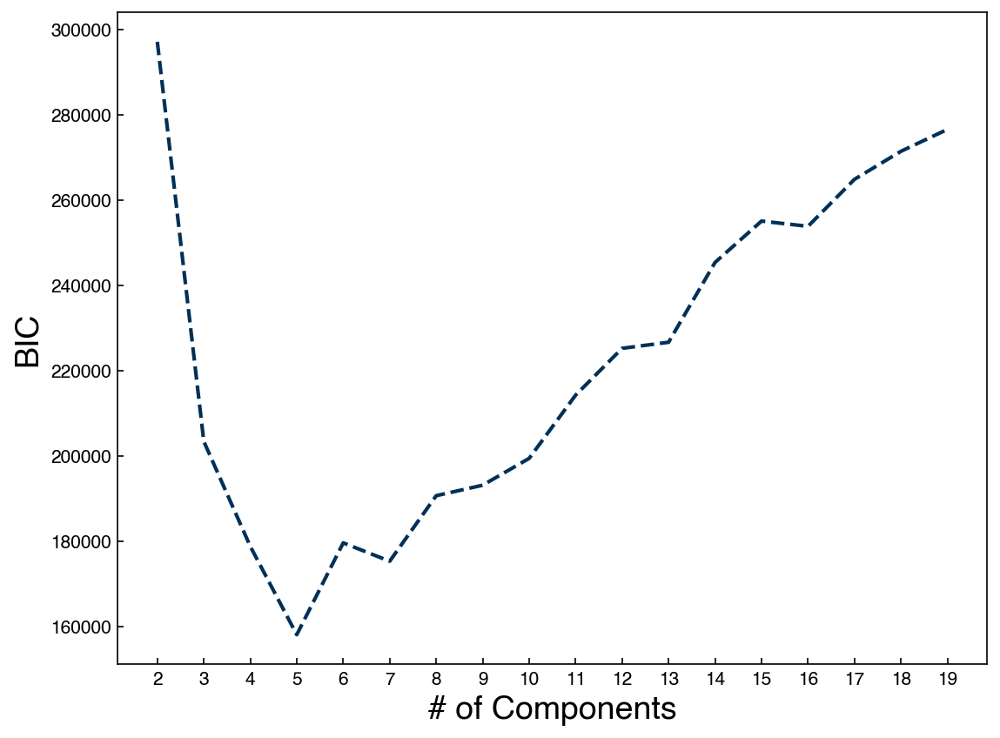

In [17]:
n_components = np.arange(2, 20)

BICs = []
models = []
for n in n_components:
    gmm_n =  GaussianMixture(n, covariance_type = 'full').fit(X_mnist)
    bic = gmm_n.bic(X_mnist)
    BICs.append(bic)
    models.append(gmm_n)
    
        
fig, ax = plt.subplots()
ax.plot(n_components, BICs)
ax.set_xlabel('# of Components', size = 18);
ax.set_ylabel('BIC', size = 18)
ax.set_xticks(n_components);

We see that the optimal seems to be below 10. This is a bit surprising, since we know there are 10 digits in the dataset. Let's try to create some new digits with the best model:

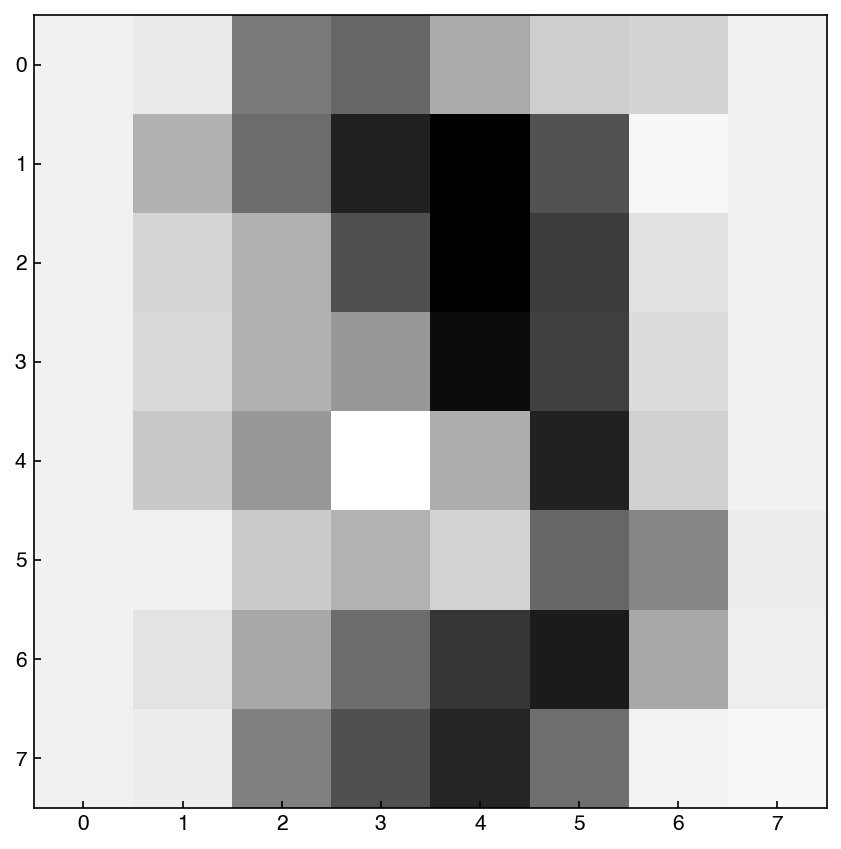

In [18]:
gmm_best = models[3]
example = gmm_best.sample()
show_image(example, 0)

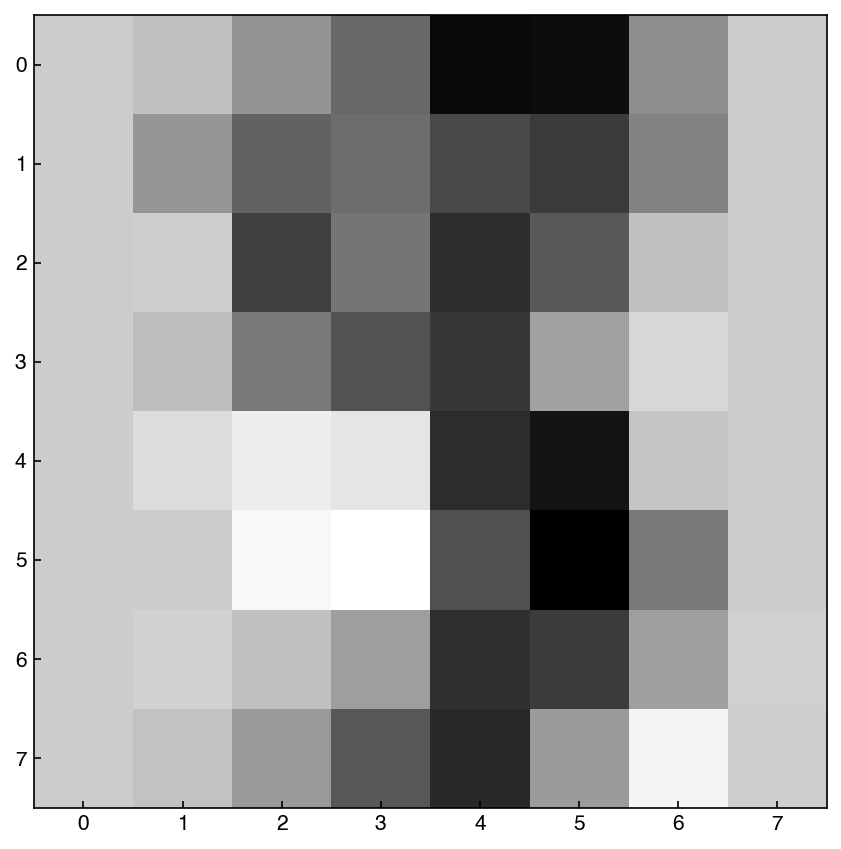

In [19]:
example = gmm_best.sample()
show_image(example, 0)

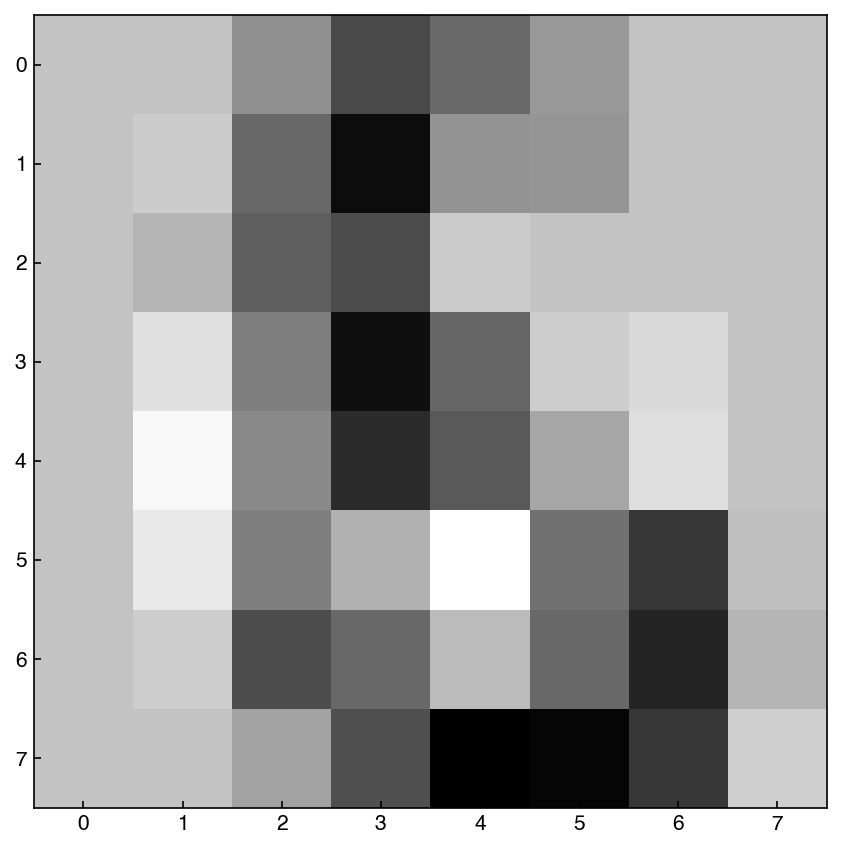

In [20]:
example = gmm_best.sample()
show_image(example, 0)

The output of these blocks will change every time, but we see that there is some resemblance to digits. We can reduce the number of parameters by using `spherical` or `tied` Gaussian distributions instead:

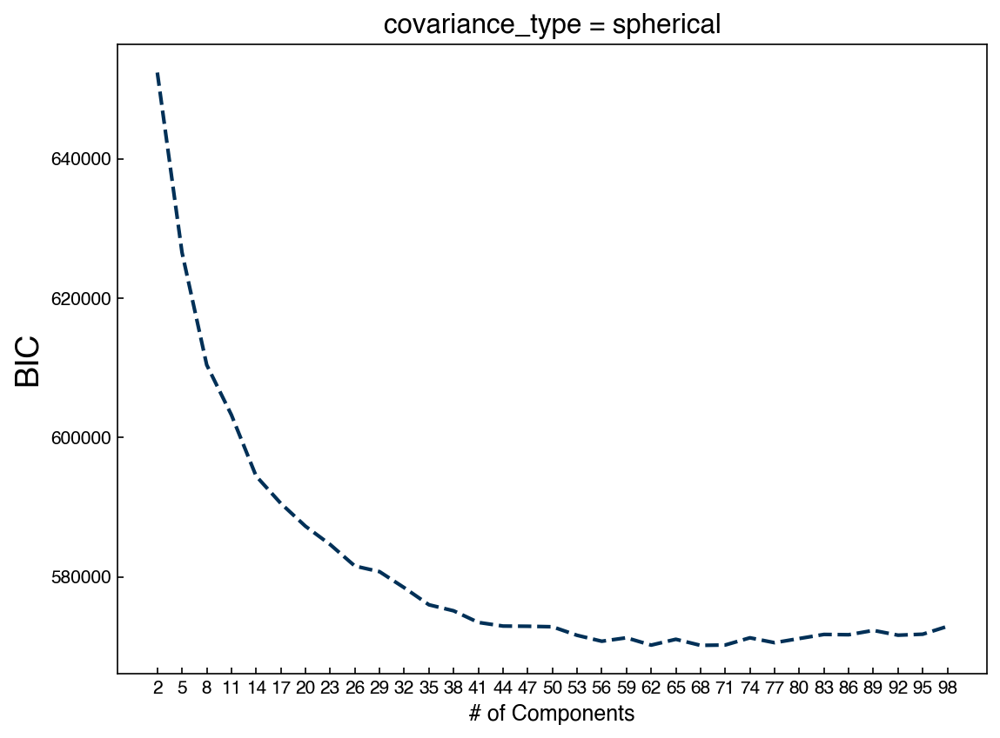

In [21]:
n_components = np.arange(2, 100)[::3]

BICs = []
models = []
for n in n_components:
    gmm_n =  GaussianMixture(n, covariance_type = 'spherical').fit(X_mnist)
    bic = gmm_n.bic(X_mnist)
    BICs.append(bic)
    models.append(gmm_n)
    
        
fig, ax = plt.subplots()
ax.plot(n_components, BICs)
ax.set_xlabel('# of Components', size = 12);
ax.set_ylabel('BIC', size = 18)
ax.set_xticks(n_components)
ax.set_title('covariance_type = spherical');

We see that we now need many more Gaussians. This makes sense, because each one has far fewer parameters. Let's look at some example digits:

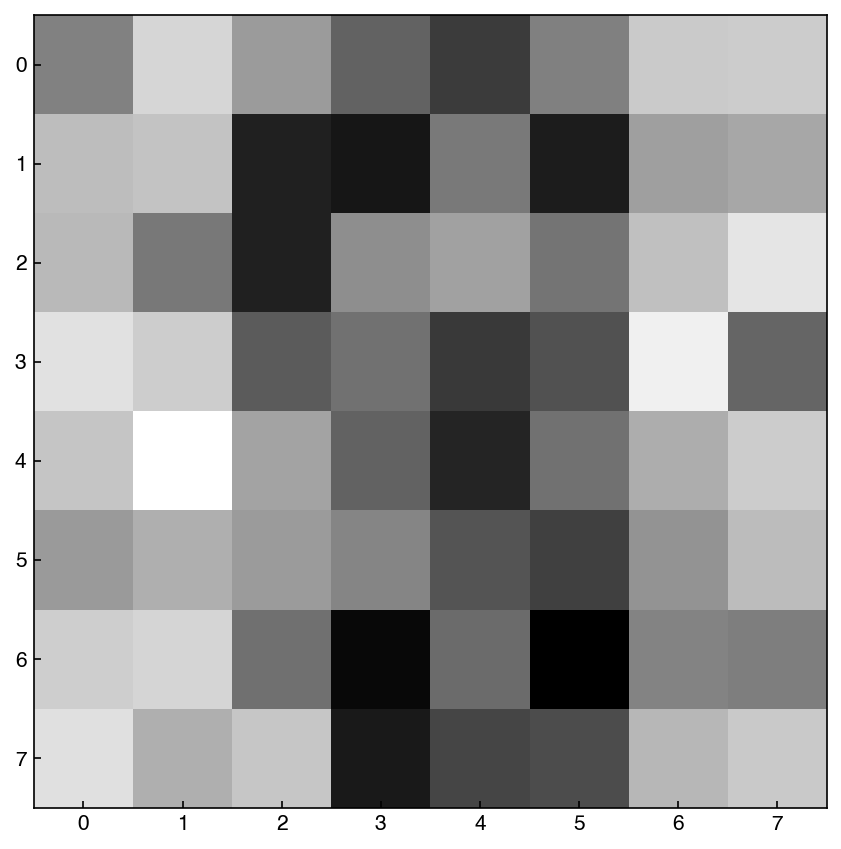

In [22]:
min_idx = BICs.index(min(BICs))
gmm_best = models[min_idx]
example = gmm_best.sample()
show_image(example, 0)

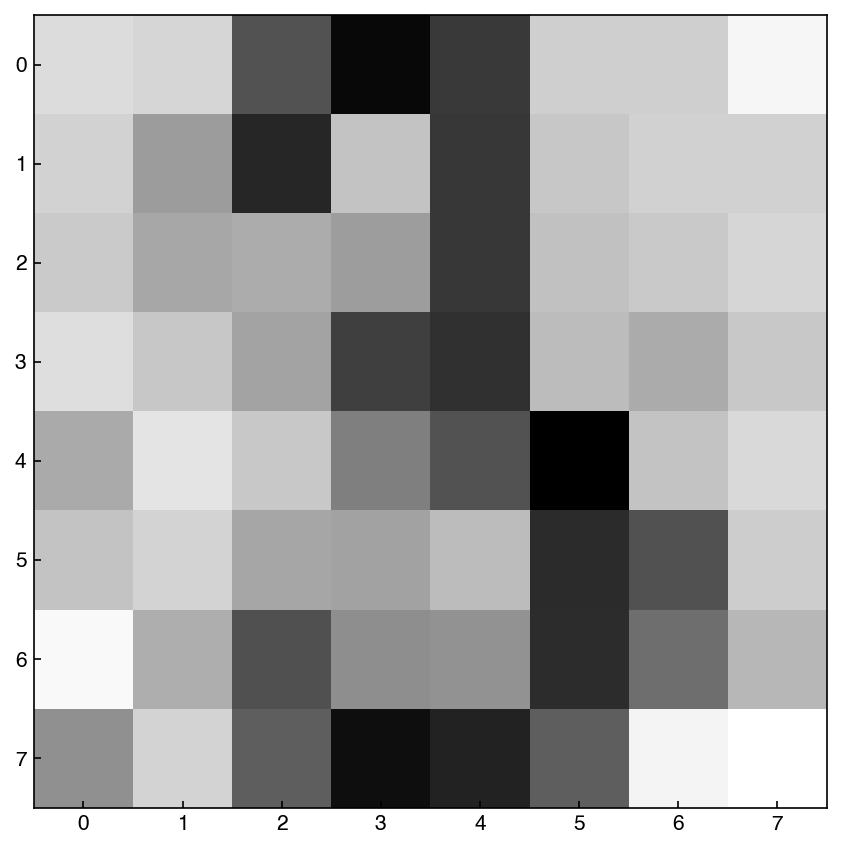

In [23]:
example = gmm_best.sample()
show_image(example, 0)

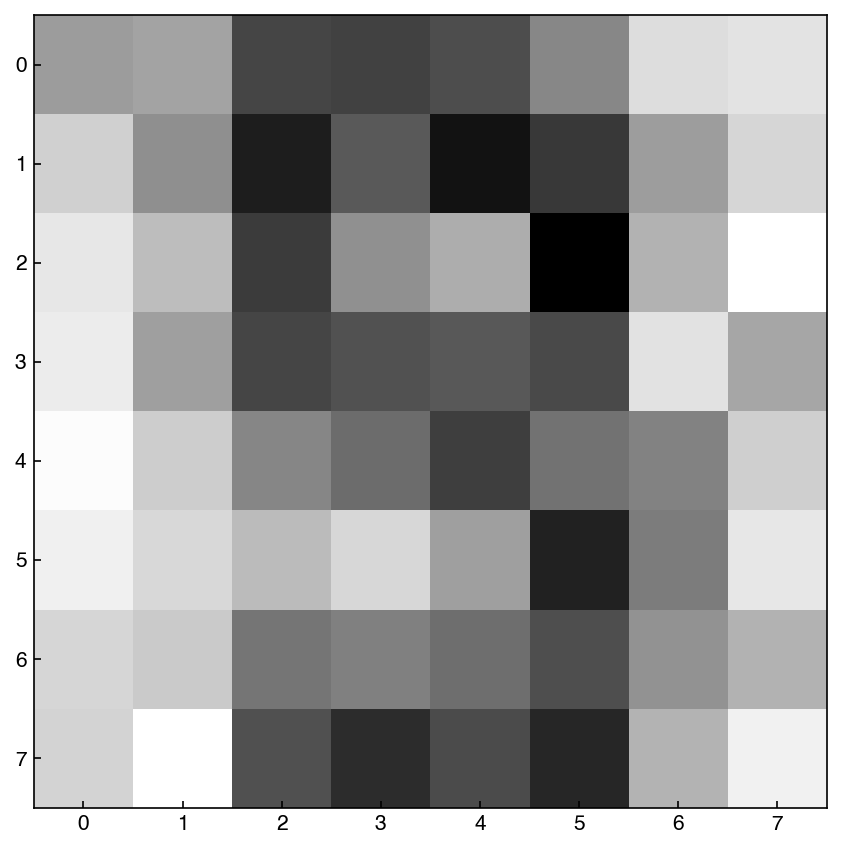

In [24]:
example = gmm_best.sample()
show_image(example, 0)

In general, these look worse! We could have predicted this by comparing the BIC's between the two approaches. Finally, let's combine the GMM with PCA:

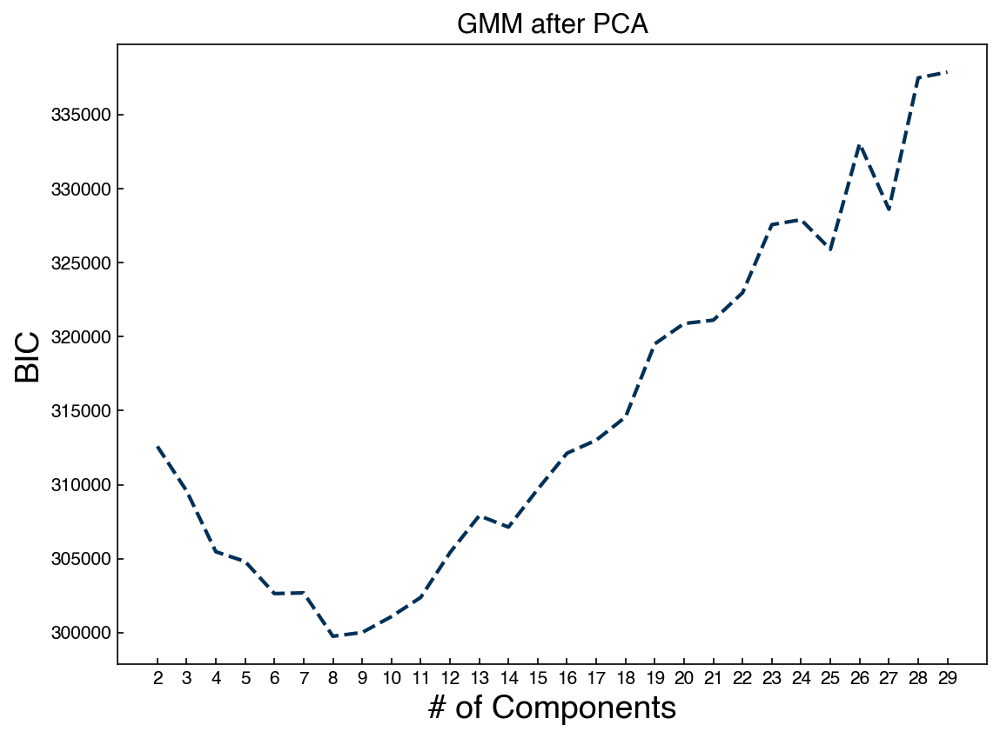

In [25]:
from sklearn.decomposition import PCA

k = 30
pca_model = PCA(n_components = k)
pca_model.fit(X_mnist)
X_k = pca_model.transform(X_mnist)

n_GMM = np.arange(2, 30)

BICs = []
models = []
for n in n_GMM:
    gmm_n =  GaussianMixture(n, covariance_type = 'full').fit(X_k)
    bic = gmm_n.bic(X_k)
    BICs.append(bic)
    models.append(gmm_n)
    
            
fig, ax = plt.subplots()
ax.plot(n_GMM, BICs)
ax.set_xlabel('# of Components', size = 18);
ax.set_ylabel('BIC', size = 18)
ax.set_xticks(n_GMM)
ax.set_title('GMM after PCA');

Now we can draw from the low-dimensional distribution and use the inverse transform to go back to the high-dimensional space:

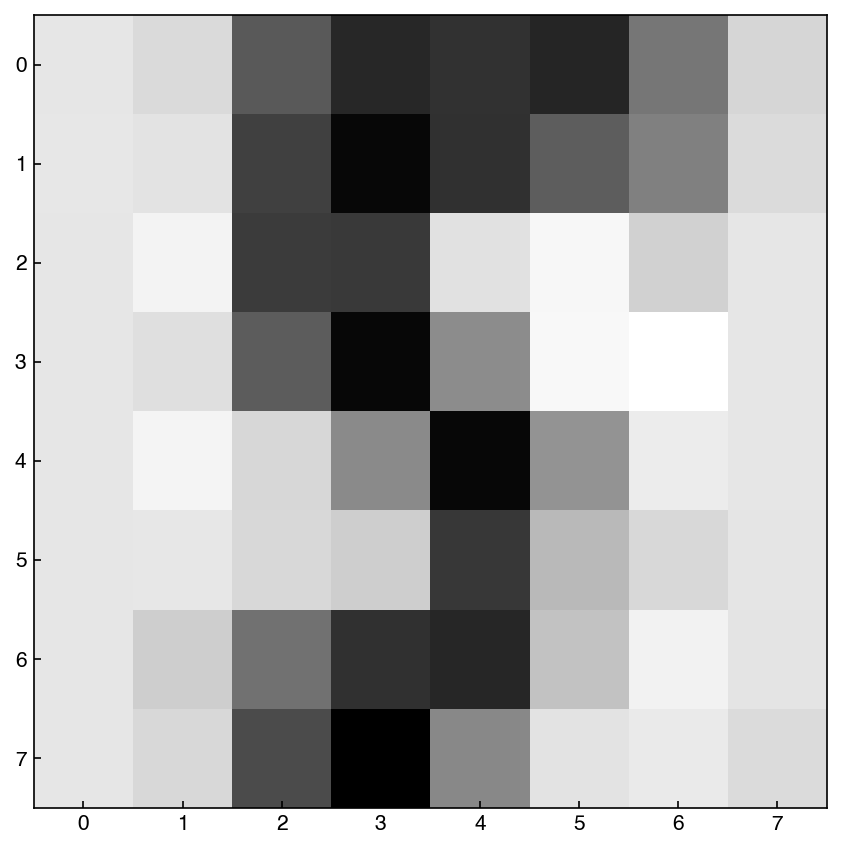

In [26]:
min_idx = BICs.index(min(BICs))
gmm_best = models[min_idx]
example_lowD, out = gmm_best.sample()

example_lowD = example_lowD.reshape(1, -1)
example = pca_model.inverse_transform(example_lowD)
show_image(example, 0)

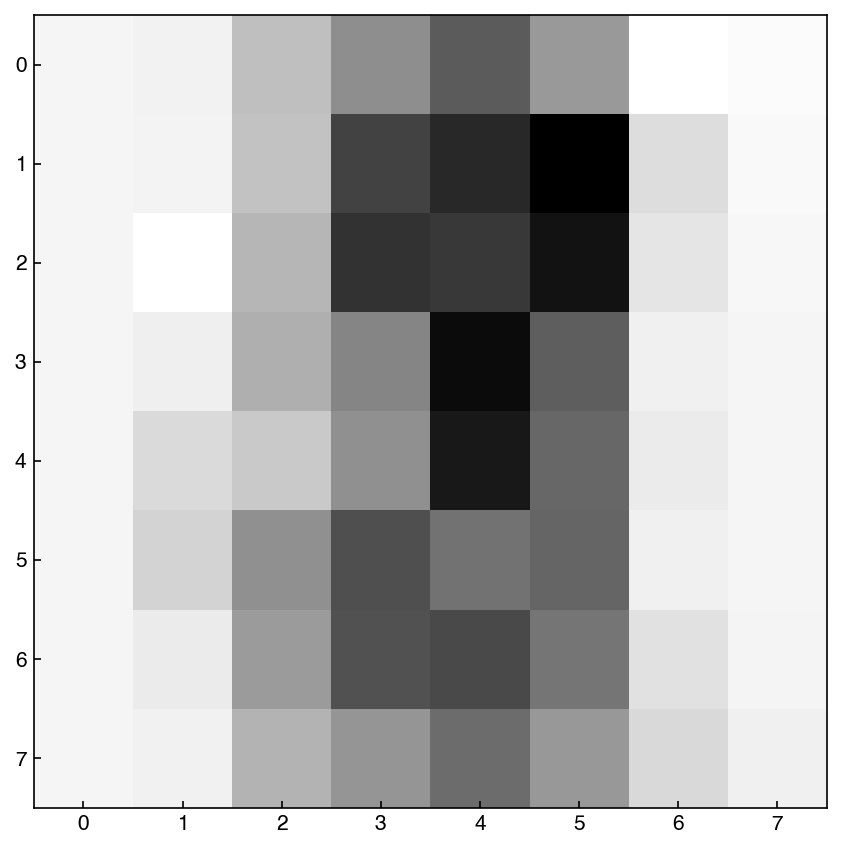

In [27]:
example_lowD, out = gmm_best.sample()

example_lowD = example_lowD.reshape(1, -1)
example = pca_model.inverse_transform(example_lowD)
show_image(example, 0)

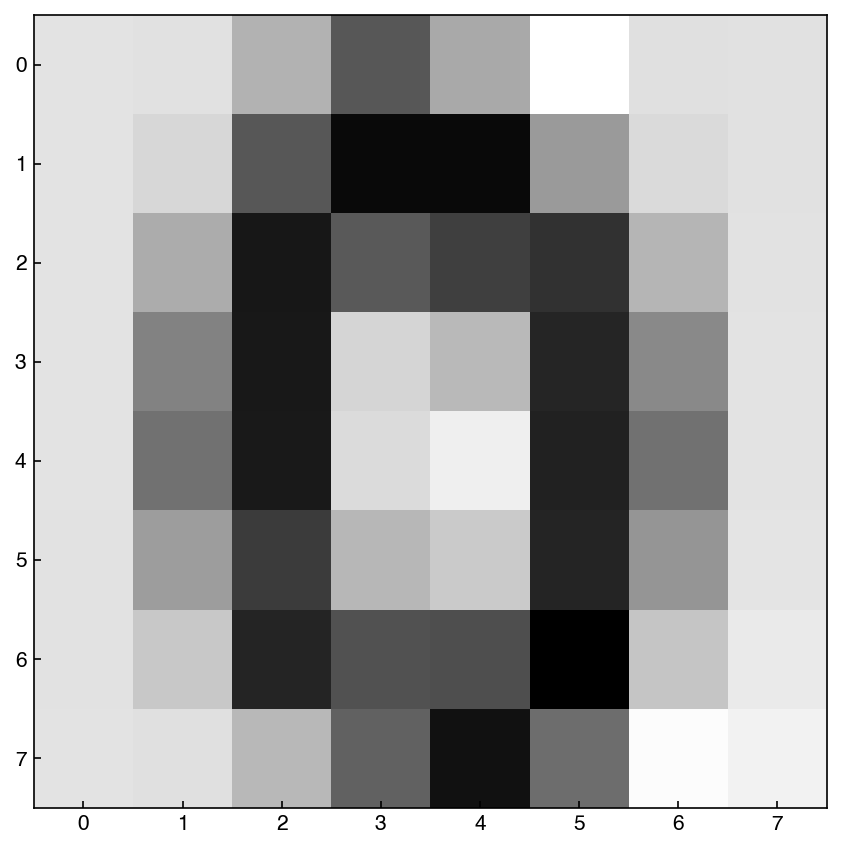

In [28]:
example_lowD, out = gmm_best.sample()

example_lowD = example_lowD.reshape(1, -1)
example = pca_model.inverse_transform(example_lowD)
show_image(example, 0)

In general these seem to be comparable to the samples generated from creating a GMM on the full distribution, but the model is more efficient because it is sampling from a lower-dimensional space. In practice, if you are working with data with dimensions >100 it will likely be necessary to combine dimensional reduction and GMM's to create a generative model.

### Exercise: Create a GMM that can generate new examples of the digit 6

Follow the same procedures above, but only use input data from the digit 6. You can use the `y_mnist` variable to quickly select this subset (`y_mnist == 6`).

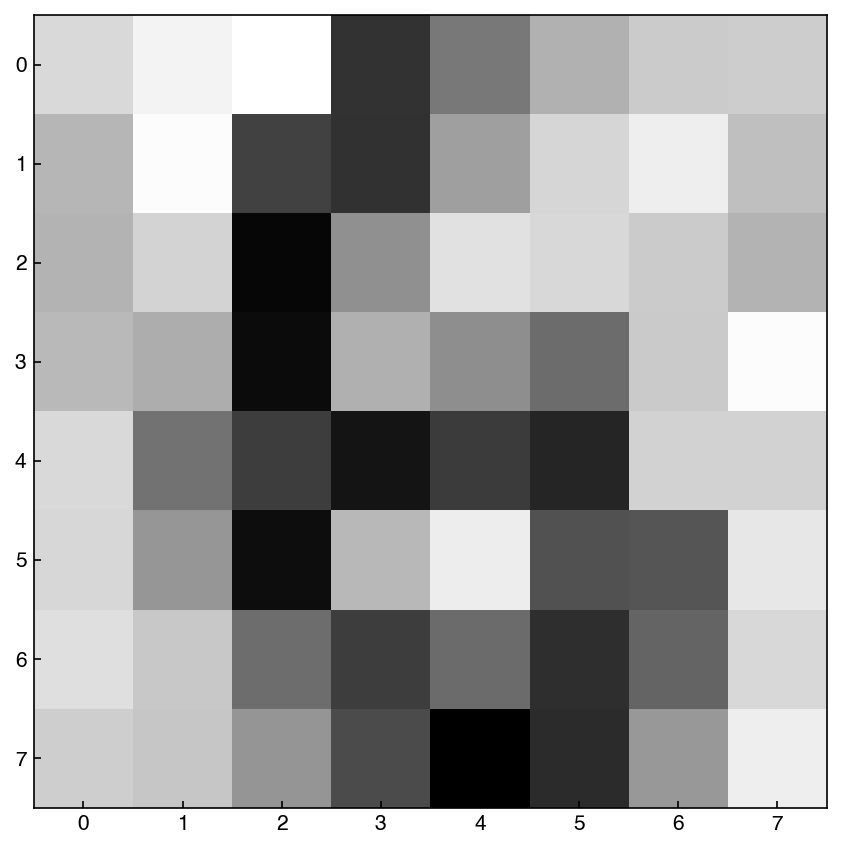

In [29]:
X_mnist_6 = X_mnist[y_mnist == 6]

# Let's just use an arbitrary model
gmm_n =  GaussianMixture(5, covariance_type = 'spherical').fit(X_mnist_6)
example = gmm_n.sample()
show_image(example, 0)

This pretty looks like 6! Note that the model is not optimized in terms of the number of Gaussians.

## Kernel Density Estimation 

In Gaussian mixture models we represent data with a combination of Gaussians. As we increase the number of Gaussians the distribution gets closer to the original data, but the ability to "generalize" to new data decreases.

Kernel density estimation (KDE) takes Gaussian mixtures to their logical extreme by representing the distribution with the same number of Gaussians as data points. This enables it to represent arbitrarily complex distributions relatively well. You can think of it as interpolation for probability distributions.

### KDE vs. Histograms

One issue with histograms is that they can be very sensitive to how the bins are selected. KDE models offer an alternative to histograms that do not require bins, but do require a "bandwidth" (the width of the Gaussians used to represent the distribution). Let's revisit the example of the distribution from the feature from the Dow dataset and compare a histogram to the KDE model:

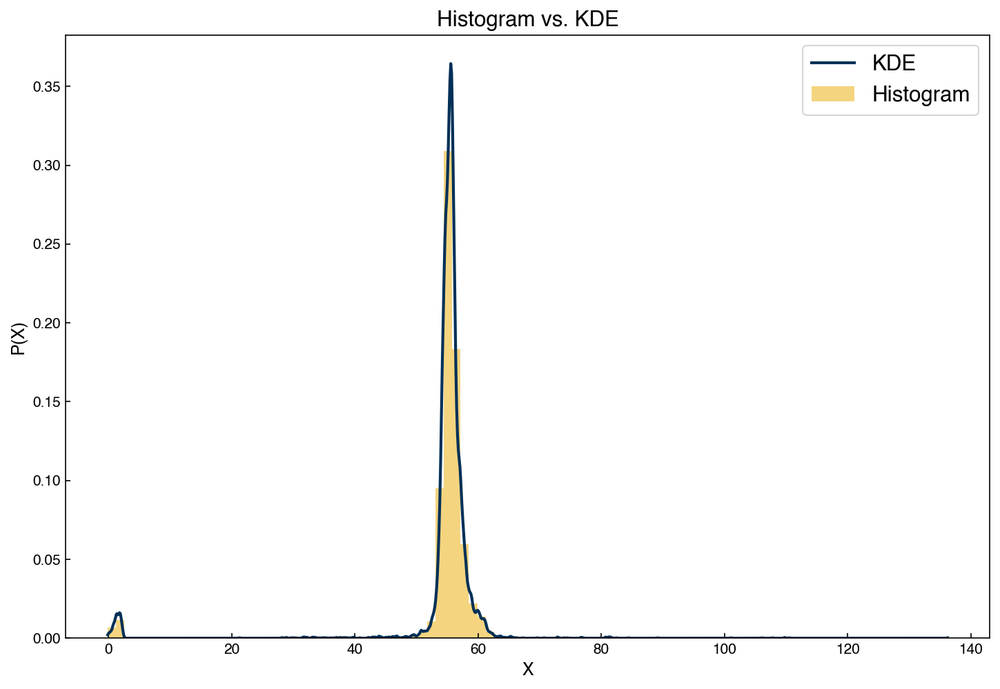

In [30]:
from sklearn.neighbors import KernelDensity

# instantiate and fit the KDE model
x_1d = x_1d.reshape(-1, 1)
kde = KernelDensity(bandwidth = 0.15, kernel = 'gaussian')
kde.fit(x_1d)

#create a continuous x variable
x_continuous = np.linspace(min(x_1d), max(x_1d), 1000)

# score_samples returns the log of the probability density
logprob = kde.score_samples(x_continuous)
fig, ax = plt.subplots(figsize = (10, 7))

ax.plot(x_continuous, np.exp(logprob), '-')
ax.hist(x_1d, alpha = 0.5, density = True, bins = 100)
ax.set_xlabel('X')
ax.set_ylabel('P(X)')
ax.set_title('Histogram vs. KDE')
ax.legend(['KDE', 'Histogram']);

Similar to GMM's, we can use a KDE distribution to create new samples:

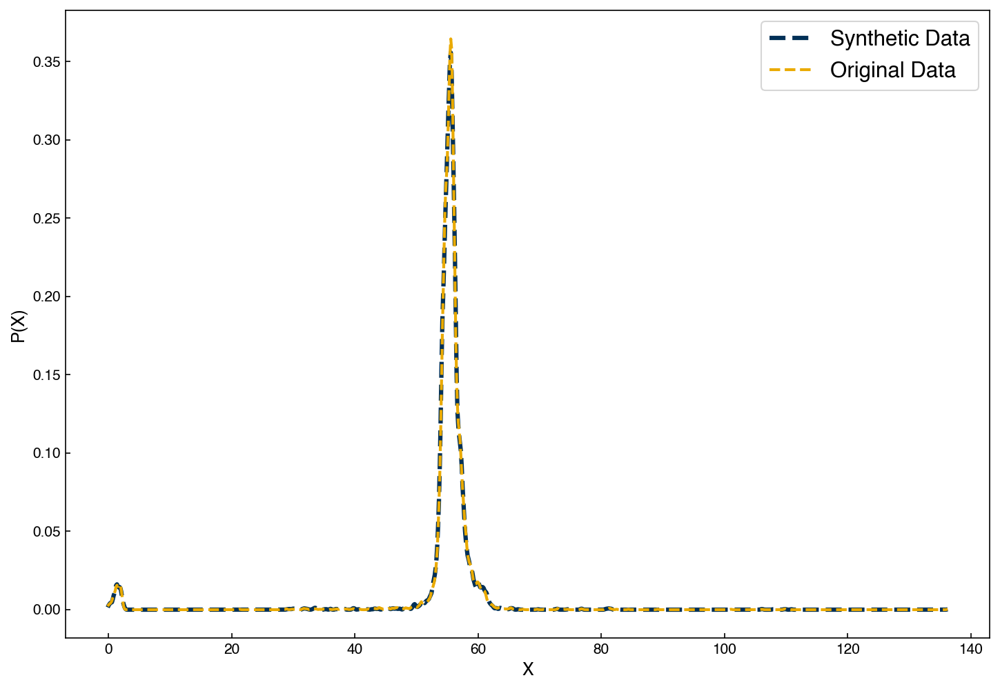

In [31]:
X_synthetic = kde.sample(10000)
X_synthetic = X_synthetic.reshape(-1, 1)
kde = KernelDensity(bandwidth = 0.15, kernel = 'gaussian')
kde.fit(X_synthetic)

# score_samples returns the log of the probability density
logprob_synthetic = kde.score_samples(x_continuous)
fig, ax = plt.subplots(figsize = (10, 7))

ax.plot(x_continuous, np.exp(logprob_synthetic), linewidth = 3)
ax.plot(x_continuous, np.exp(logprob))
ax.set_xlabel('X')
ax.set_ylabel('P(X)')
ax.legend(['Synthetic Data', 'Original Data']);

We see that the samples we draw now follow an almost identical distribution!

### KDE in high dimensions

Since KDE uses kernels, it generally scales realtively well to high dimensions. We can use it directly on the MNIST dataset to try to generate new samples:

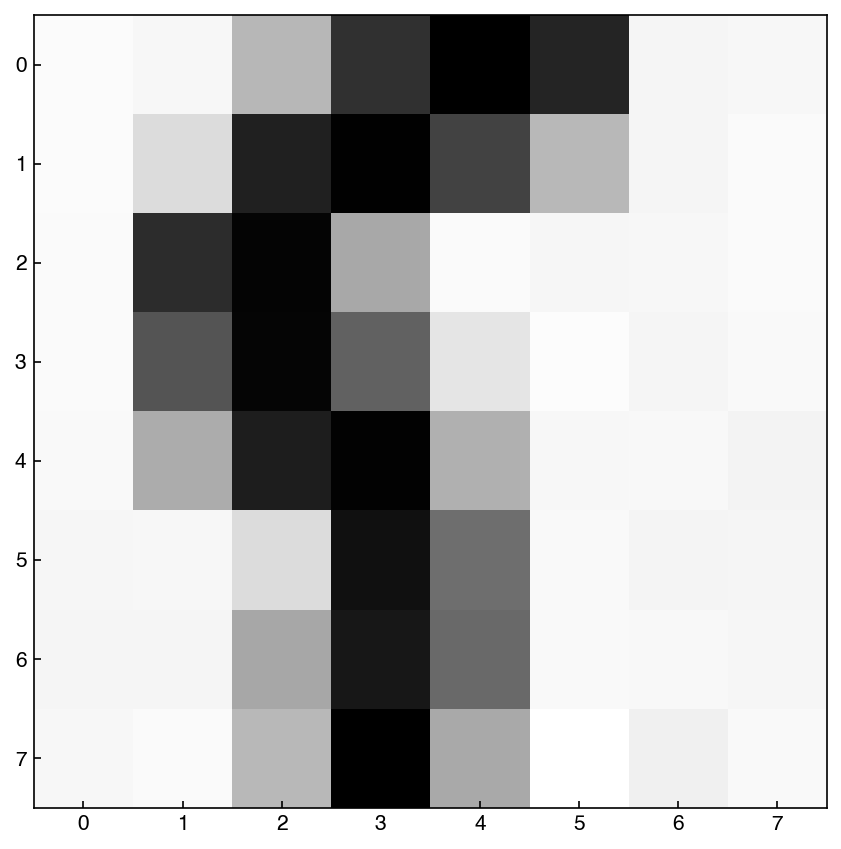

In [32]:
kde_images = KernelDensity(bandwidth = 0.25, kernel = 'gaussian')
kde_images.fit(X_mnist)
example = kde_images.sample()
show_image(example, 0)

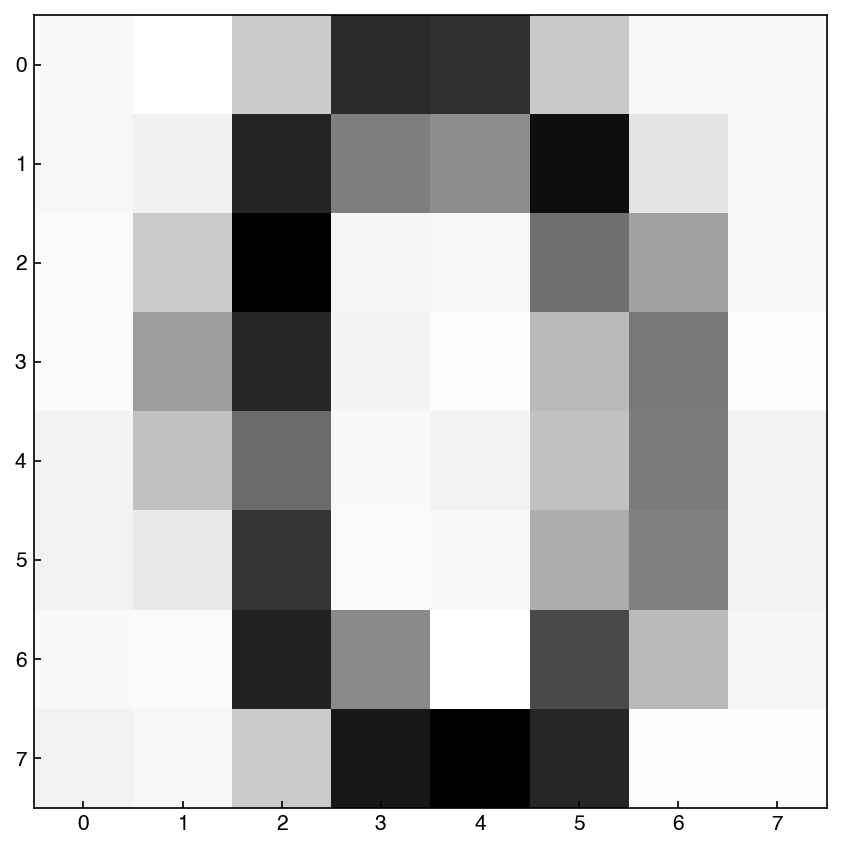

In [33]:
example = kde_images.sample()
show_image(example, 0)

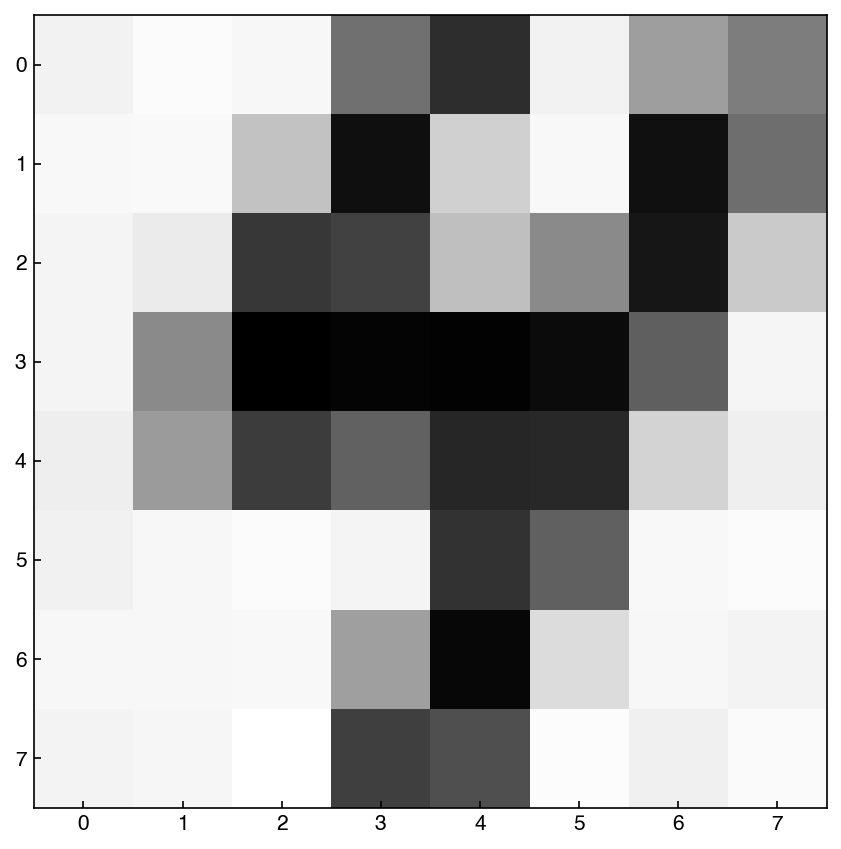

In [34]:
example = kde_images.sample()
show_image(example, 0)

We see that these are very reasonable examples of hand-written digits, but they were generated by the computer! This concept can create very complex synthetic data. Perhaps the best example is faces of people who do not actually exist, as available from https://www.thispersondoesnotexist.com/. These are generated by much more sophisticated deep neural networks generative models, but the principle is the same.

## Not-so-naïve Bayes

In [35]:
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.naive_bayes import GaussianNB

### Calculate the posterior probaility for `label = 0`

Just a simple example of how to calculate the posterior probability for a single label.

In [36]:
label = 0
X = X_mnist[y_mnist == label]

model = KernelDensity(bandwidth = 10, kernel = 'gaussian')
model.fit(X);

In [37]:
model.score_samples(X_mnist[:3, :])

array([-208.48758285, -220.39043884, -218.35226166])

In [38]:
np.exp(model.score_samples(X_mnist[:3, :]))

array([2.85097378e-91, 1.93040551e-96, 1.48189573e-95])

In [39]:
proba_0 = X.shape[0] / X_mnist.shape[0]

In [40]:
post_proba = proba_0 * np.exp(model.score_samples(X_mnist[:3, :]))
print(post_proba)

[2.82400297e-92 1.91214347e-97 1.46787669e-96]


### Build a not-so-naïve Bayes model

In [41]:
def not_so_naive(X_train, X_test, y_train, model):
    # iterate through label 0 to 9
    for y in range(10):
        X = X_train[y_train == y]
        model.fit(X)
        
        proba_y = X.shape[0] / X_train.shape[0]
        
        likelihood = np.exp(model.score_samples(X_test))
        post_proba = proba_y * likelihood
        
        if y == 0:
            prediction = post_proba.reshape(-1, 1)

        else:
            prediction = np.append(prediction, post_proba.reshape(-1, 1), axis = 1)
            
    return np.argmax(prediction, axis = 1)

In [42]:
model = KernelDensity(bandwidth = 10, kernel = 'gaussian')

X_train, X_test, y_train, y_test = train_test_split(X_mnist, y_mnist, test_size = 0.3, random_state = 1)
prediction = not_so_naive(X_train, X_test, y_train, model)

In [43]:
accuracy_score(y_test, prediction)

0.9907407407407407

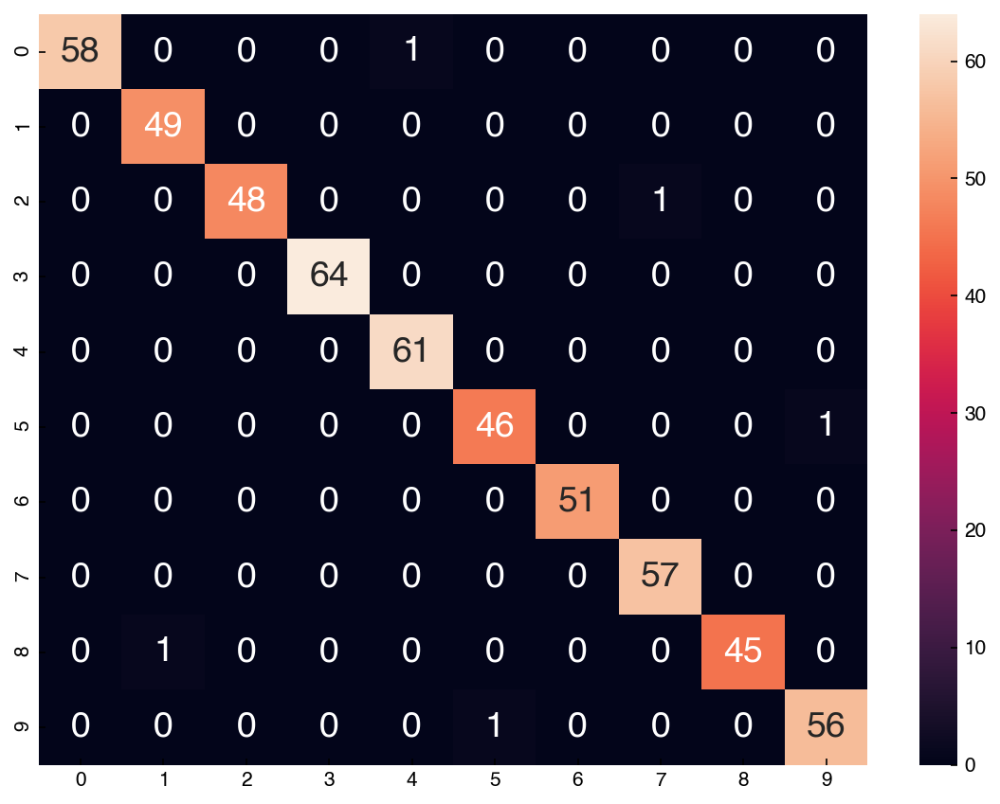

In [44]:
cm = confusion_matrix(y_test.reshape(-1,), prediction)
df_cm = pd.DataFrame(cm, index = range(0, 10), columns = range(0, 10))

fig, ax = plt.subplots()
sns.heatmap(df_cm, annot = True);

### Simple Gaussian Naïve Bayes

Let's compare the results with a simple Gaussian Naïve Bayes classifier.

In [45]:
NB = GaussianNB()
yhat = NB.fit(X_train, y_train).predict(X_test)

In [46]:
NB.score(X_test, y_test)

0.8314814814814815

The accuracy is lower than the not-so-naïve version!

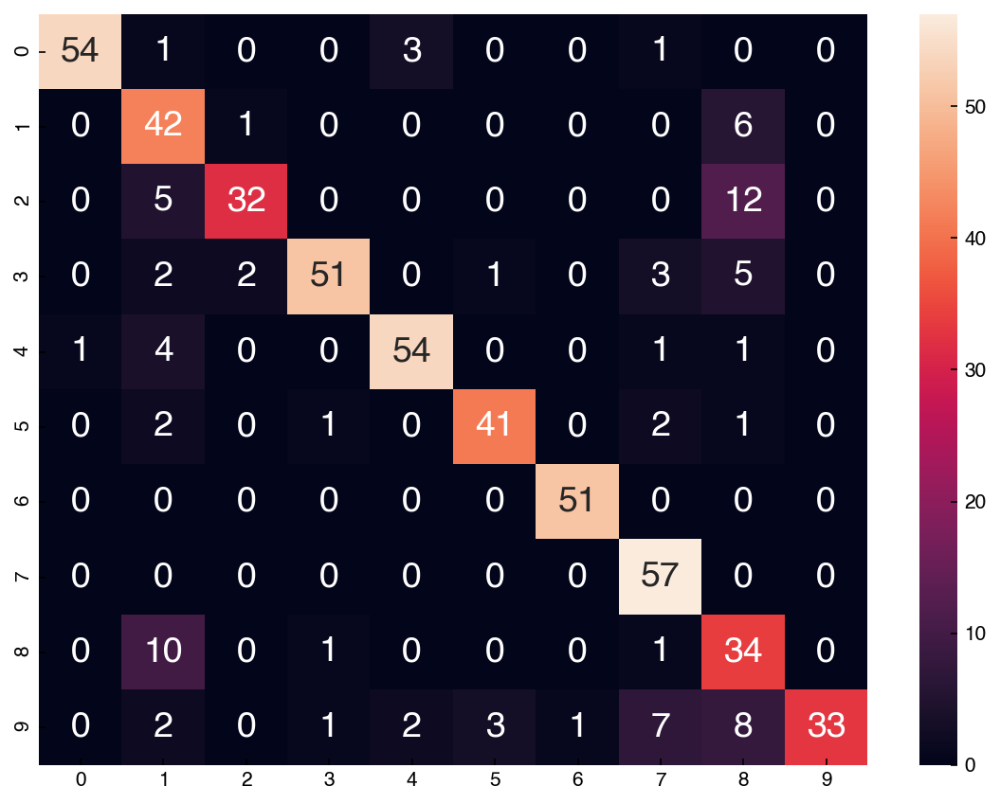

In [47]:
cm = confusion_matrix(y_test, yhat)
df_cm = pd.DataFrame(cm, index = range(10), columns = range(10))
sns.heatmap(df_cm, annot = True);